# Gas powerplant - ADP investigation 
- I found out that it is not that easy to make the model of value function (Linear model does not work). 
- I have tried to come up with some basis functions that would make sense, but it seems like the linear model is not capable of capturing the problem. 
- The complex problem, with government incentive and powerplant months left was simplified. Now the only variables are the prices and the state of a powerplant. Balance might be added to the model as a linear component helping the project.  

- This notebook is about a better basis functions, or maybe a completely new model of the value function. 
- I will start by precise modelling of the last Vf, then I will go in other time epochs. 

# 1. Epoch 298 
- Get a lot of (state, utility) pairs, so that we see the function "plotted" by scatter. Look at the data and try to moodel them reasonably. 

In [1]:
import sys
import os
sys.path.append("/Users/filiprolenec/Desktop/MT/MTpython/src")

In [2]:
from gas_example.optimization.optimization import get_state_utility_pairs
from gas_example.optimization.sampling import get_state_sample
from gas_example.optimization.vf import Vf
from gas_example.enum_types import PowerplantState

import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.linear_model import LinearRegression
sns.set()

from scipy import optimize
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
%matplotlib inline
from gas_example.optimization_2.adp_algorithm import adp_algorithm_complete

from gas_example.simulation.state import State
from gas_example.optimization_2.optimization import get_best_action
from gas_example.optimization_2.vf import Vf

In [3]:
time_epoch = 298
VF_SAMPLE_GLOBAL = 1000
VF_SAMPLE_IND = 100
next_vf = Vf()

In [4]:
sampled_states = get_state_sample(VF_SAMPLE_GLOBAL, VF_SAMPLE_IND, time_epoch)
state_reward_pairs_raw = get_state_utility_pairs(sampled_states, time_epoch, next_vf)

In [5]:
def plot_spark_utility_graph(plant_state): 
    pair_choice  = [pair for pair in state_reward_pairs_raw if pair[0].plant_state ==plant_state]
    sparks = [pair[0].get_spark_price() for pair in pair_choice]
    utilities = [pair[1] for pair in pair_choice]
    
    plt.scatter(sparks, utilities)
    plt.xlabel("Spark")
    plt.ylabel("Utility")
    plt.title(f"Spark vs Utility {plant_state}")
    plt.show()


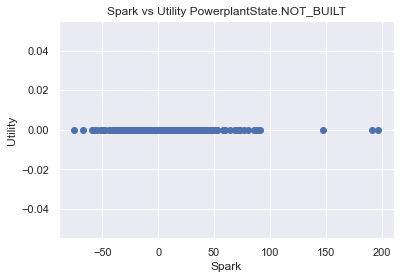

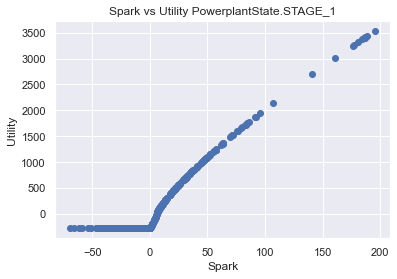

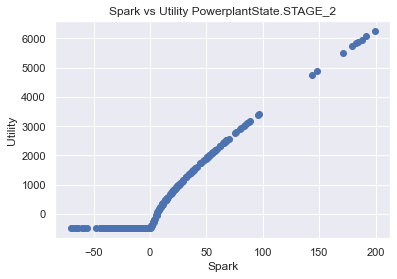

In [6]:
for state in PowerplantState: 
    plot_spark_utility_graph(state)

**Stage 1 and 2 are similar, we will not focus on them individually. Trying to find a linear model of stage 1**

In [7]:
plant_state =PowerplantState.STAGE_1

In [8]:
pair_choice  = [pair for pair in state_reward_pairs_raw if pair[0].plant_state ==plant_state]
sparks = [pair[0].get_spark_price() for pair in pair_choice]
utilities = [pair[1] for pair in pair_choice]

In [9]:
x = np.array(sparks).reshape(-1,1)
y = np.array(utilities)
model = LinearRegression().fit(x, y)
model.coef_

array([17.77495779])

In [10]:
sparks_sample = np.linspace(-200,200,401)
a = model.predict(sparks_sample.reshape(-1,1))

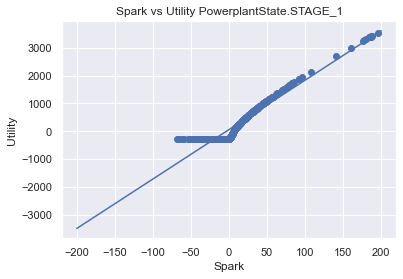

In [11]:
plt.scatter(sparks, utilities)
plt.plot(sparks_sample, a)
plt.xlabel("Spark")
plt.ylabel("Utility")
plt.title(f"Spark vs Utility {plant_state}")
plt.show()

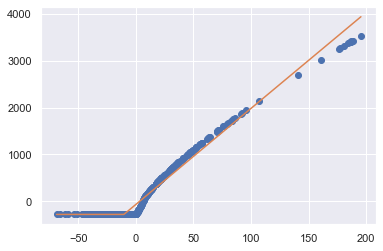

In [12]:
def piecewise_linear(x, x0, y0, k1, k2):
    return np.piecewise(x, [x < x0], [lambda x:k1*x + y0-k1*x0, lambda x:k2*x + y0-k2*x0])

p , e = optimize.curve_fit(piecewise_linear, sparks, utilities)
xd = np.linspace(min(sparks), max(sparks), 500)
plt.plot(sparks, utilities, "o")
plt.plot(xd, piecewise_linear(xd, *p))

# Looking good 
- What is the equation? Now we want to write a strategy that will behave based on these value functions. 
- We save the vfs parameters as csv and we will use it in another notebook. ADP simulaiton. 


# Testing
- All at once, what will be the value function in time 0?

N/A% (0 of 300) |                        | Elapsed Time: 0:00:00 ETA:  --:--:--

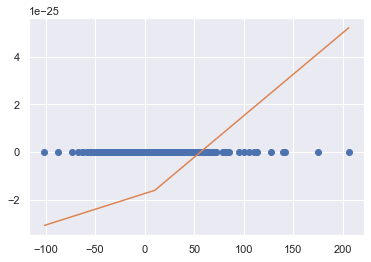

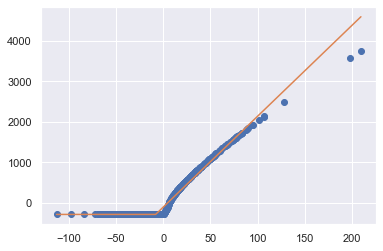

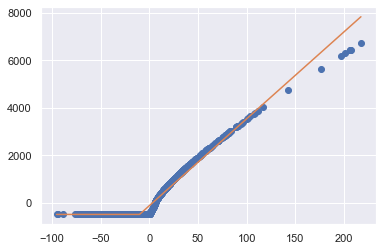

  0% (2 of 300) |                        | Elapsed Time: 0:01:01 ETA:   2:32:16

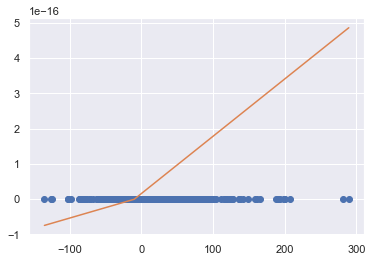

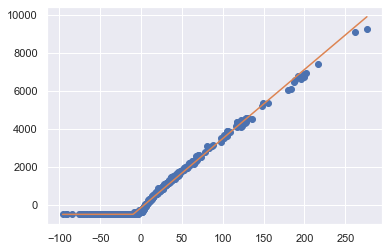

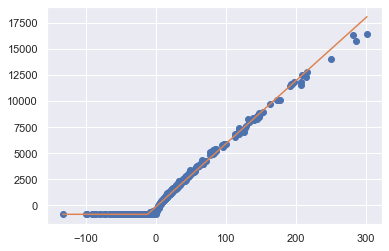

  1% (3 of 300) |                        | Elapsed Time: 0:02:01 ETA:   4:58:25

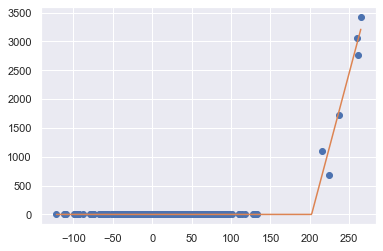

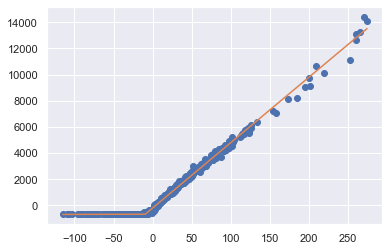

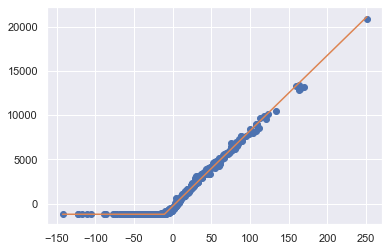

  1% (4 of 300) |                        | Elapsed Time: 0:03:07 ETA:   5:22:38

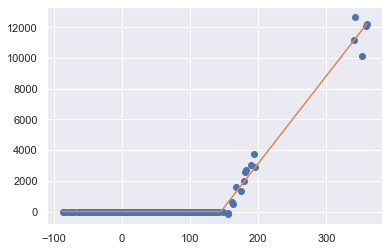

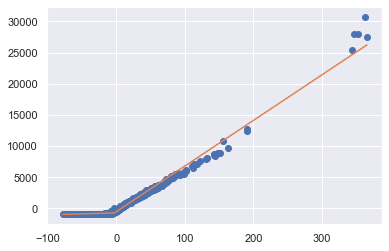

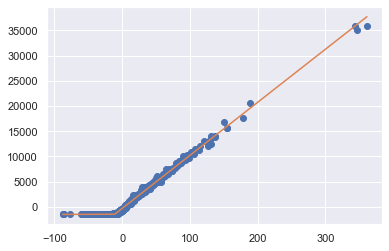

  1% (5 of 300) |                        | Elapsed Time: 0:04:07 ETA:   4:56:42

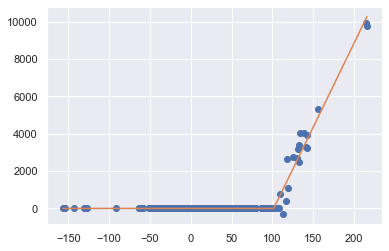

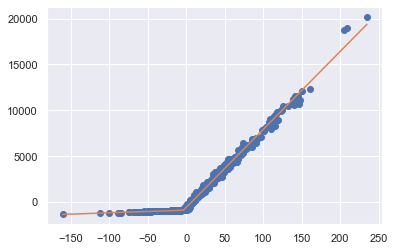

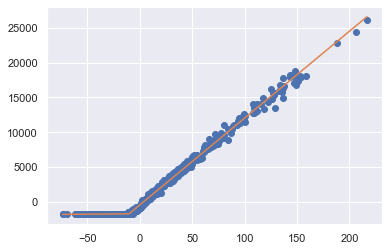

  2% (6 of 300) |                        | Elapsed Time: 0:05:15 ETA:   5:32:11

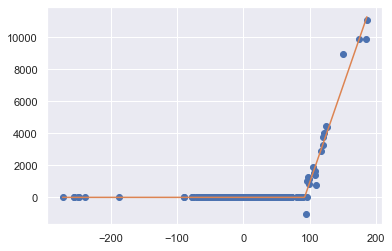

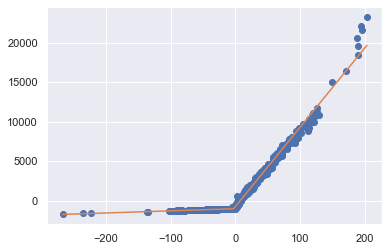

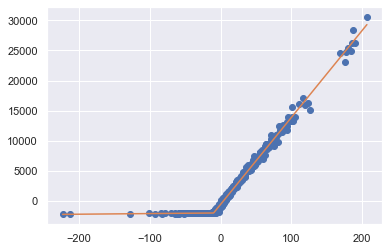

  2% (7 of 300) |                        | Elapsed Time: 0:06:20 ETA:   5:18:09

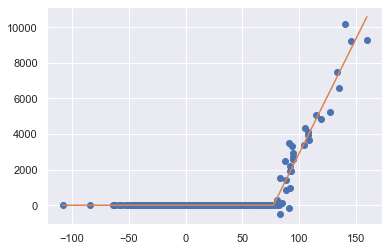

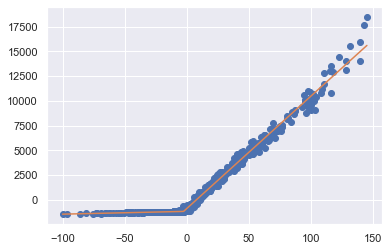

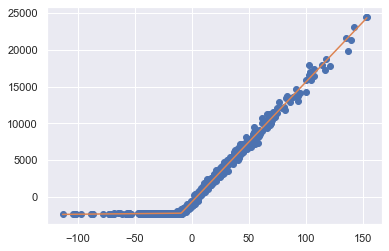

  2% (8 of 300) |                        | Elapsed Time: 0:07:22 ETA:   5:03:57

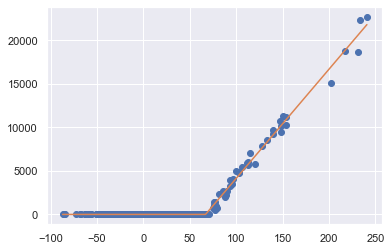

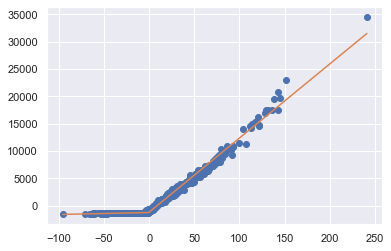

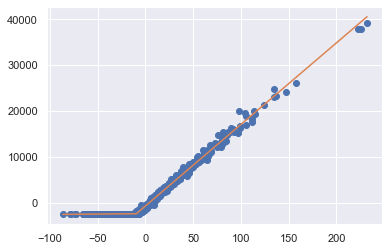

  3% (9 of 300) |                        | Elapsed Time: 0:08:26 ETA:   5:07:52

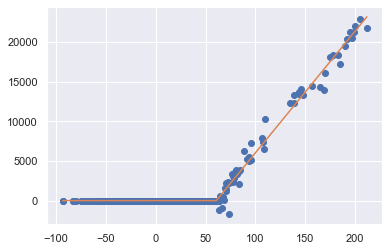

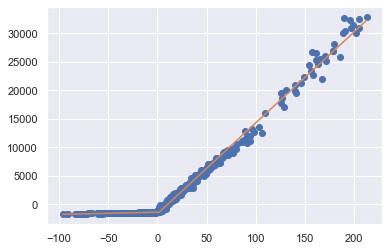

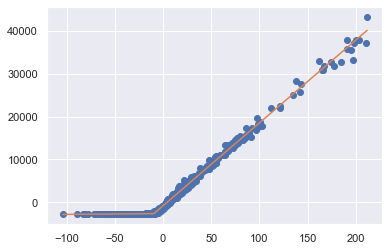

  3% (10 of 300) |                       | Elapsed Time: 0:09:28 ETA:   5:01:14

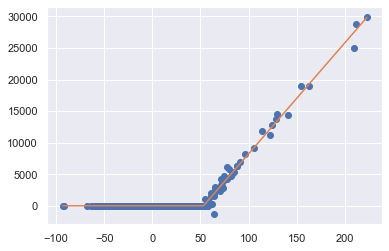

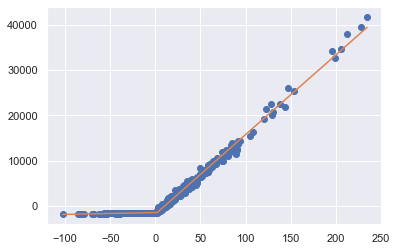

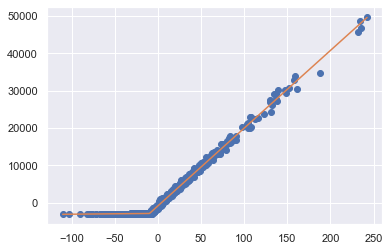

  3% (11 of 300) |                       | Elapsed Time: 0:10:33 ETA:   5:14:22

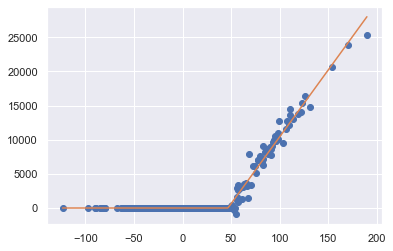

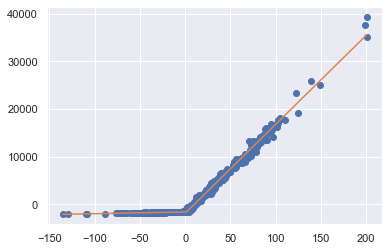

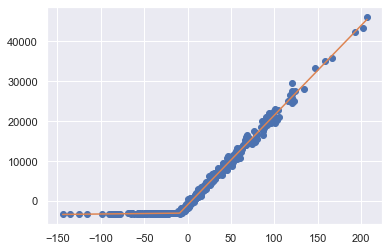

  4% (12 of 300) |                       | Elapsed Time: 0:11:36 ETA:   5:00:02

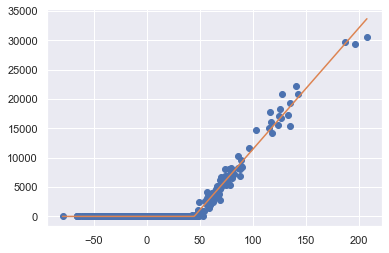

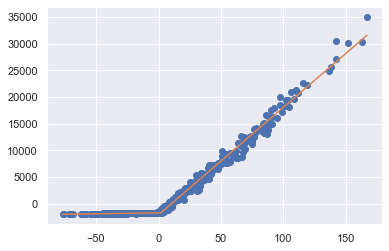

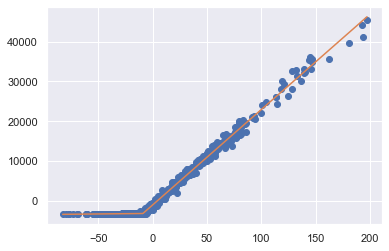

  4% (13 of 300) |                       | Elapsed Time: 0:12:37 ETA:   4:53:25

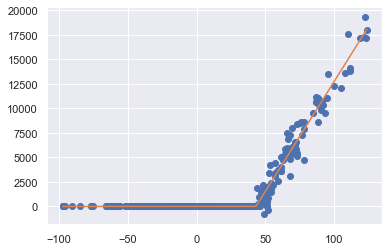

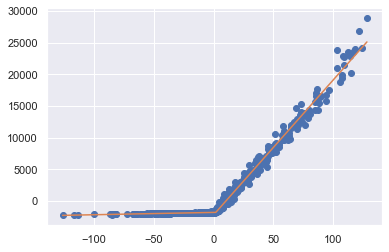

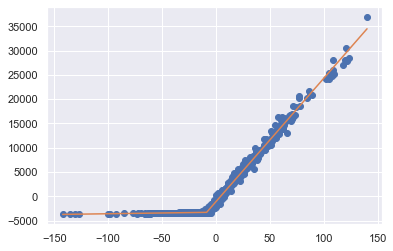

  4% (14 of 300) |#                      | Elapsed Time: 0:13:41 ETA:   5:02:57

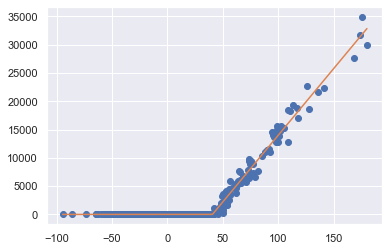

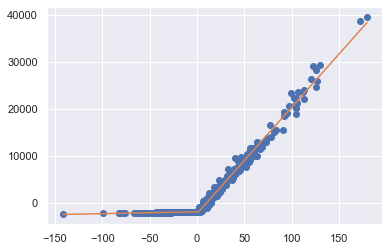

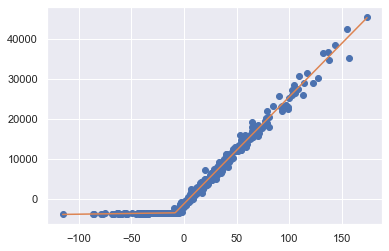

  5% (15 of 300) |#                      | Elapsed Time: 0:14:43 ETA:   4:56:33

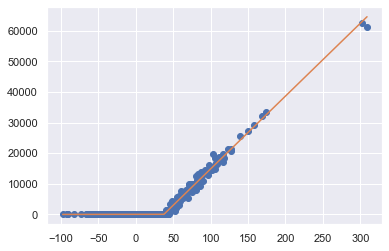

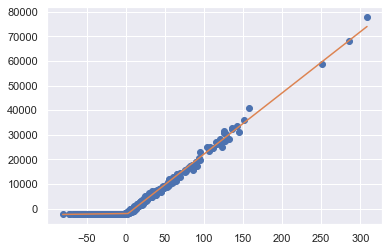

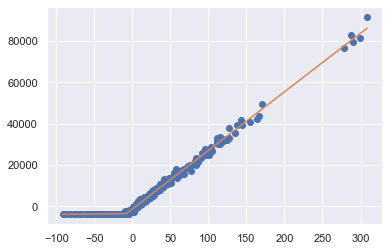

  5% (16 of 300) |#                      | Elapsed Time: 0:15:43 ETA:   4:44:37

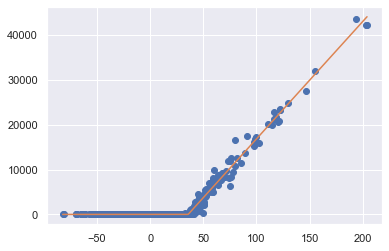

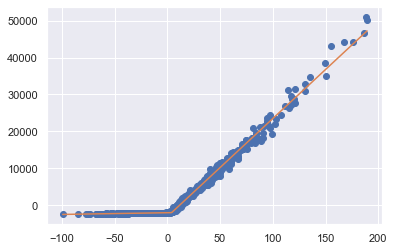

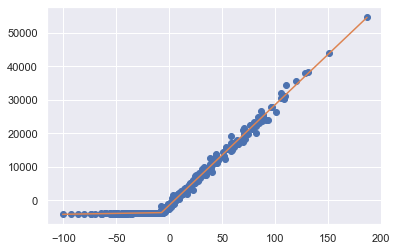

  5% (17 of 300) |#                      | Elapsed Time: 0:16:47 ETA:   5:02:12

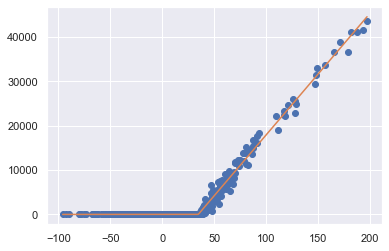

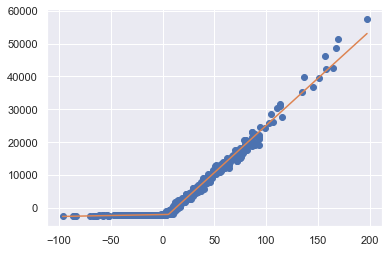

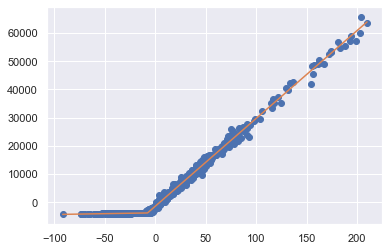

  6% (18 of 300) |#                      | Elapsed Time: 0:17:49 ETA:   4:48:17

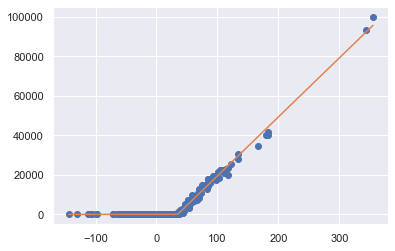

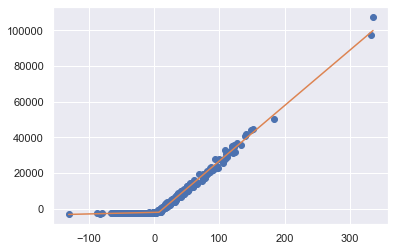

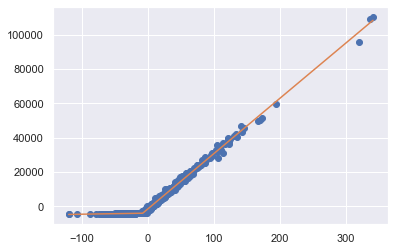

  6% (19 of 300) |#                      | Elapsed Time: 0:18:50 ETA:   4:45:36

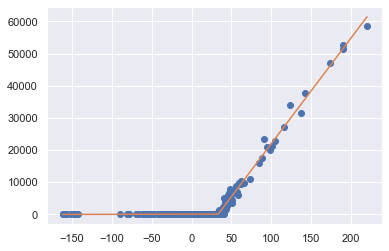

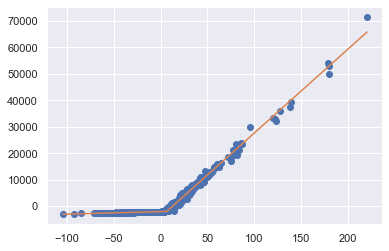

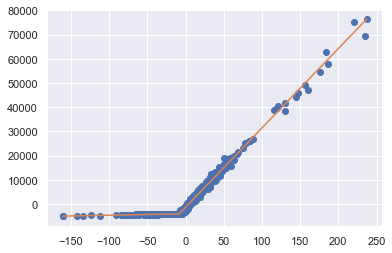

  6% (20 of 300) |#                      | Elapsed Time: 0:19:52 ETA:   4:52:02

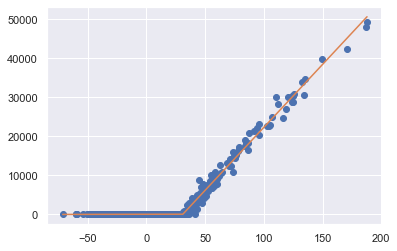

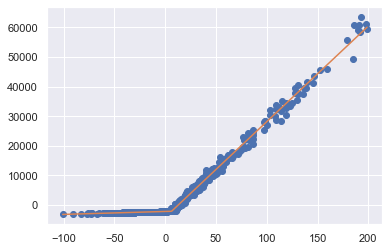

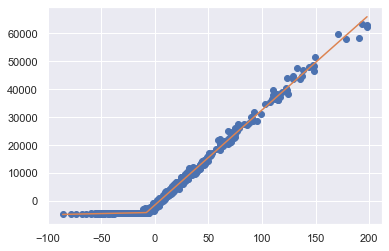

  7% (21 of 300) |#                      | Elapsed Time: 0:20:58 ETA:   5:04:16

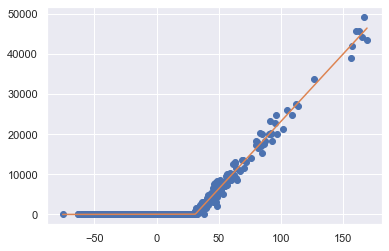

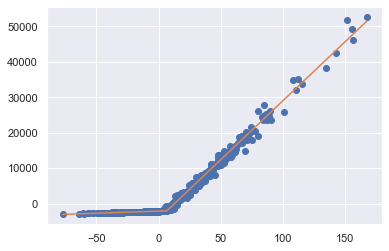

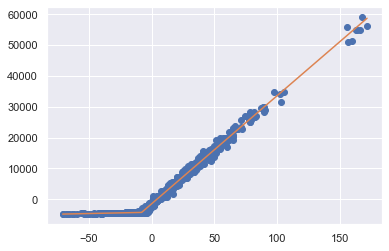

  7% (22 of 300) |#                      | Elapsed Time: 0:21:57 ETA:   4:33:14

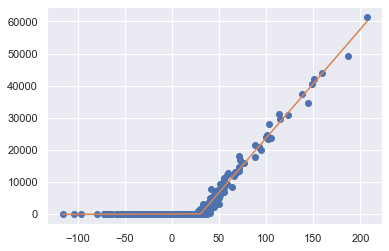

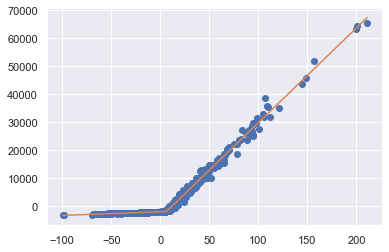

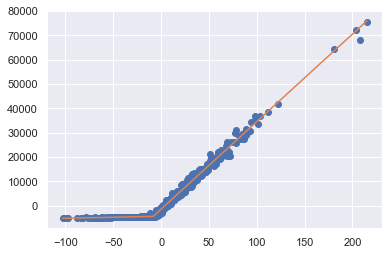

  7% (23 of 300) |#                      | Elapsed Time: 0:23:00 ETA:   4:52:46

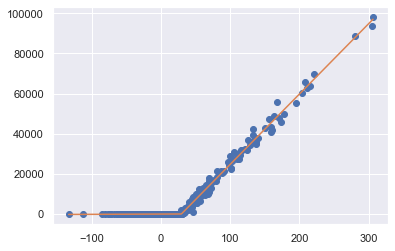

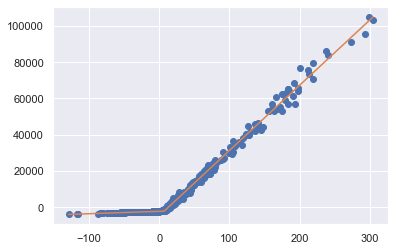

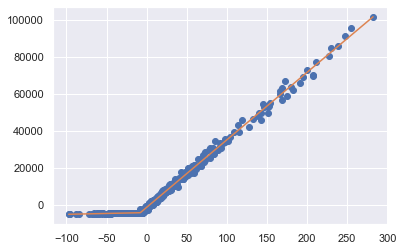

  8% (24 of 300) |#                      | Elapsed Time: 0:24:04 ETA:   4:52:11

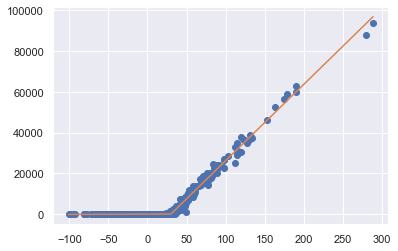

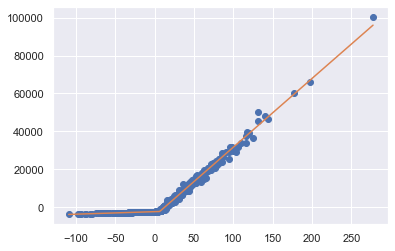

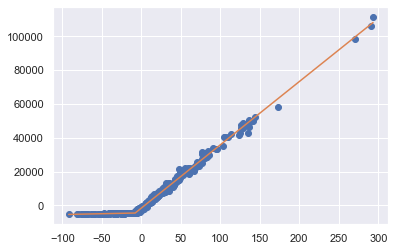

  8% (25 of 300) |#                      | Elapsed Time: 0:25:02 ETA:   4:29:36

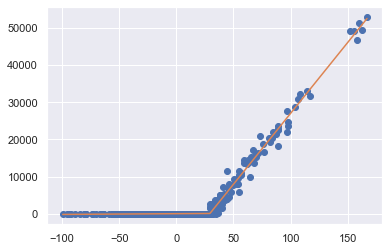

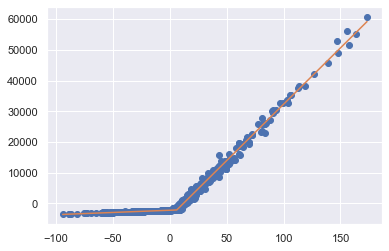

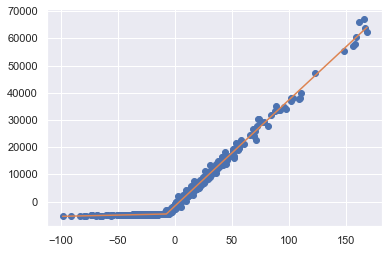

  8% (26 of 300) |#                      | Elapsed Time: 0:26:06 ETA:   4:50:12

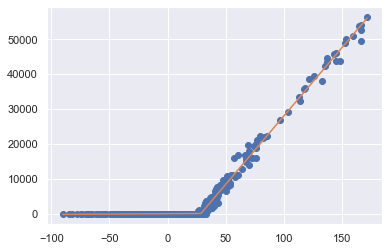

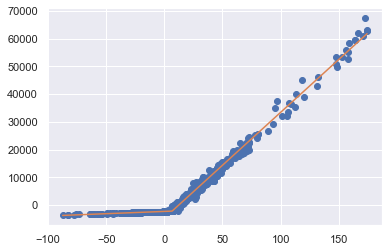

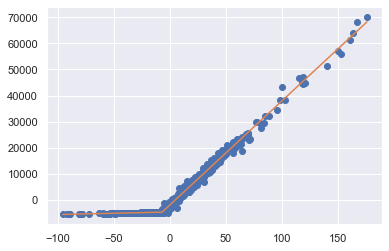

  9% (27 of 300) |##                     | Elapsed Time: 0:27:12 ETA:   5:01:45

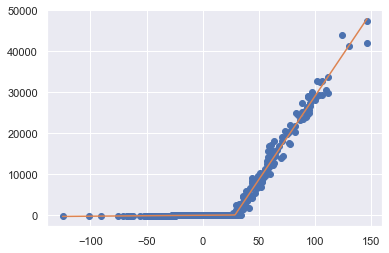

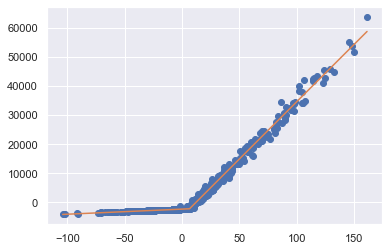

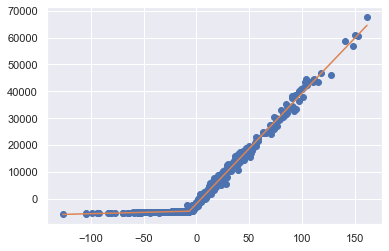

  9% (28 of 300) |##                     | Elapsed Time: 0:28:14 ETA:   4:40:07

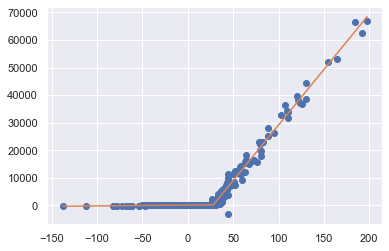

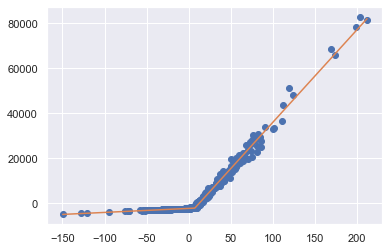

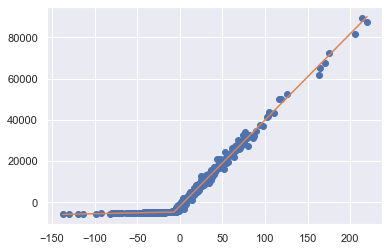

  9% (29 of 300) |##                     | Elapsed Time: 0:29:17 ETA:   4:42:50

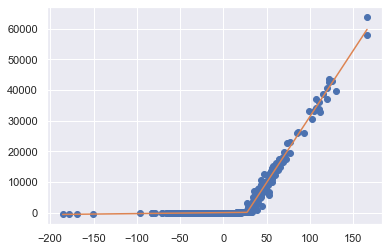

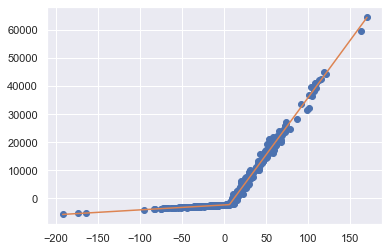

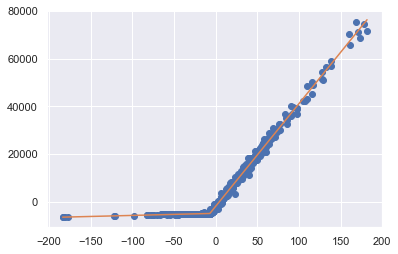

 10% (30 of 300) |##                     | Elapsed Time: 0:30:18 ETA:   4:37:03

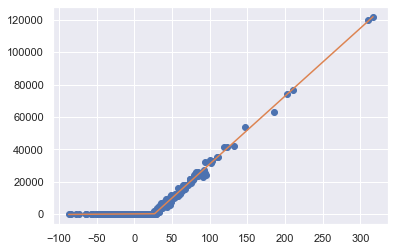

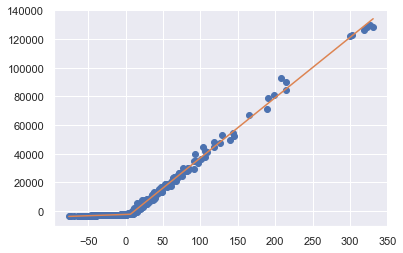

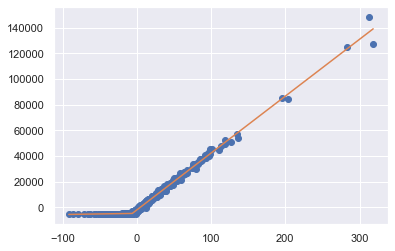

 10% (31 of 300) |##                     | Elapsed Time: 0:31:22 ETA:   4:45:38

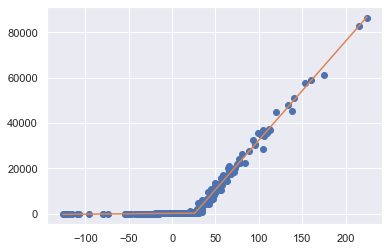

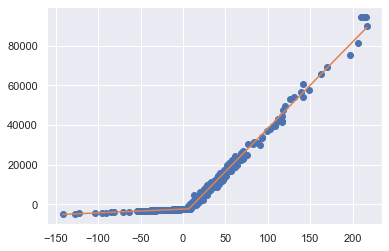

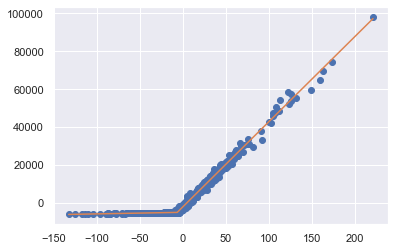

 10% (32 of 300) |##                     | Elapsed Time: 0:32:26 ETA:   4:45:48

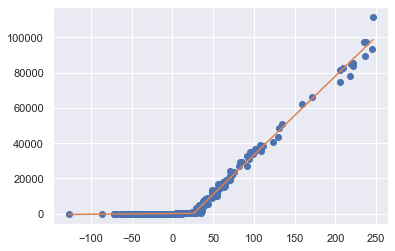

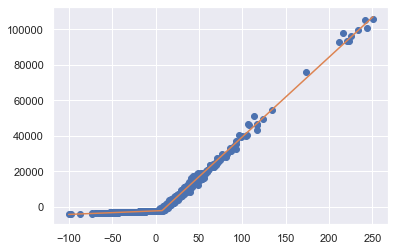

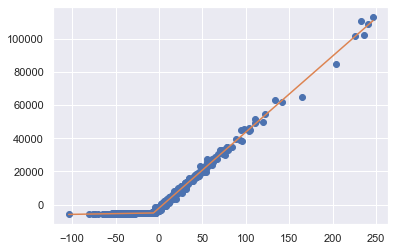

 11% (33 of 300) |##                     | Elapsed Time: 0:33:29 ETA:   4:42:07

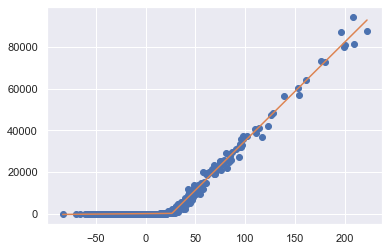

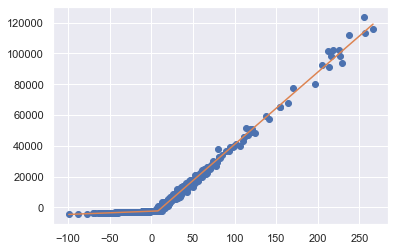

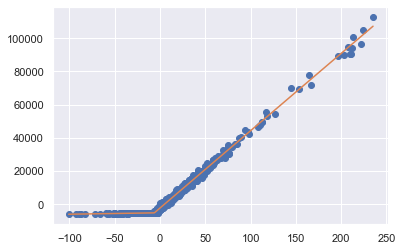

 11% (34 of 300) |##                     | Elapsed Time: 0:34:32 ETA:   4:38:02

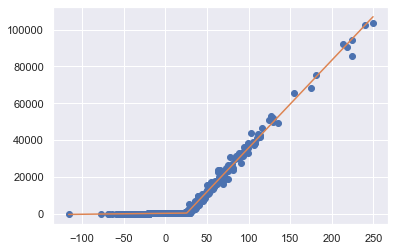

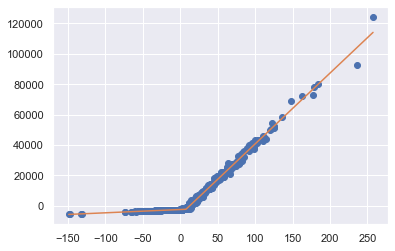

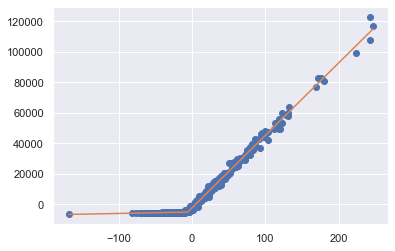

 11% (35 of 300) |##                     | Elapsed Time: 0:35:34 ETA:   4:35:00

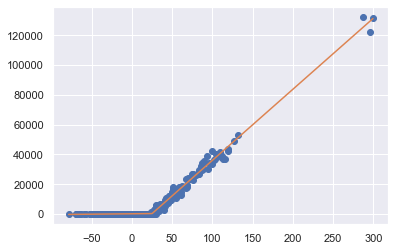

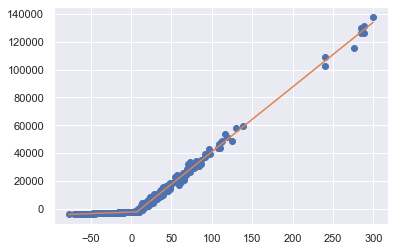

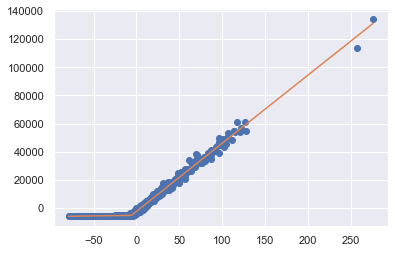

 12% (36 of 300) |##                     | Elapsed Time: 0:36:37 ETA:   4:36:16

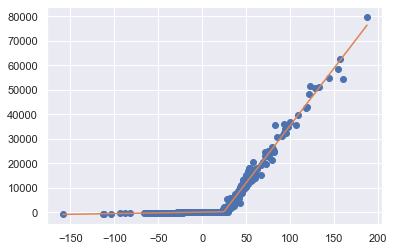

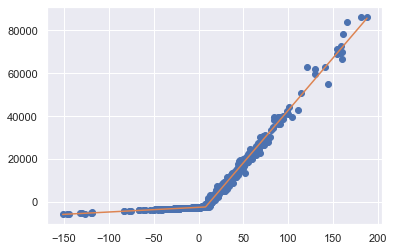

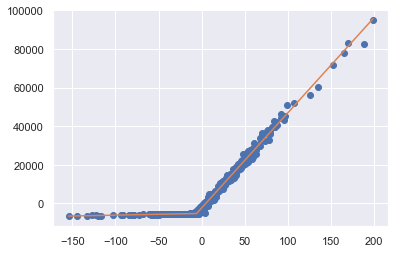

 12% (37 of 300) |##                     | Elapsed Time: 0:37:42 ETA:   4:42:49

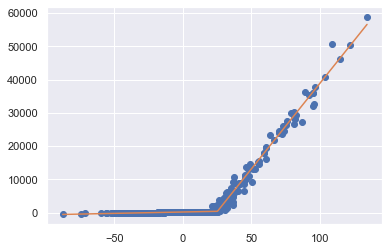

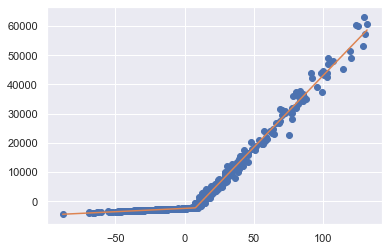

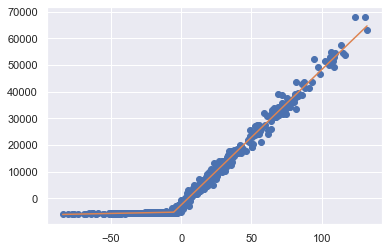

 12% (38 of 300) |##                     | Elapsed Time: 0:38:44 ETA:   4:30:57

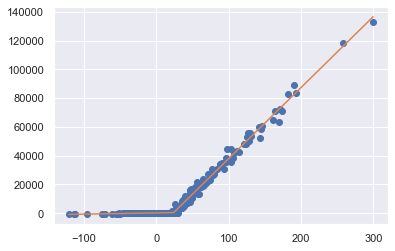

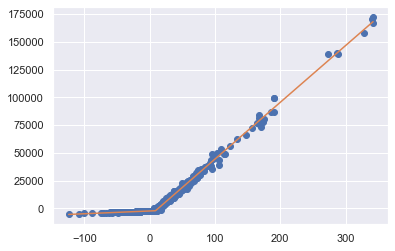

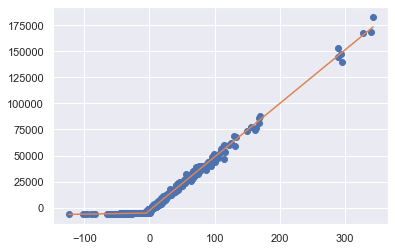

 13% (39 of 300) |##                     | Elapsed Time: 0:39:48 ETA:   4:39:03

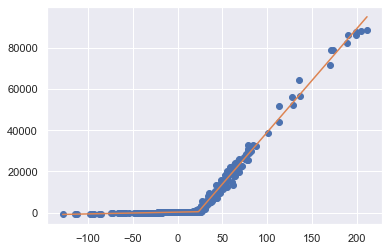

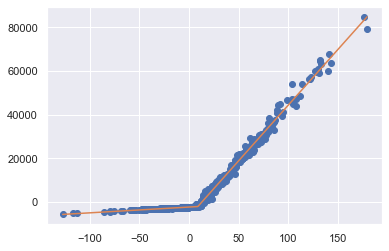

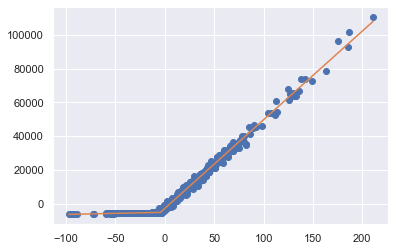

 13% (40 of 300) |###                    | Elapsed Time: 0:40:51 ETA:   4:32:00

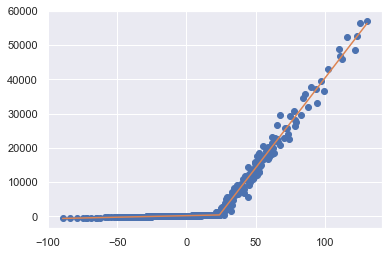

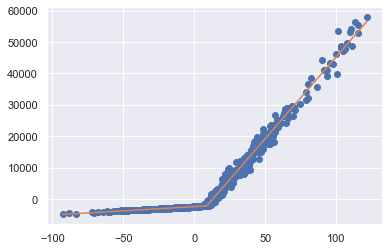

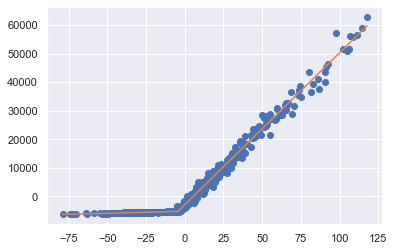

 13% (41 of 300) |###                    | Elapsed Time: 0:41:55 ETA:   4:36:40

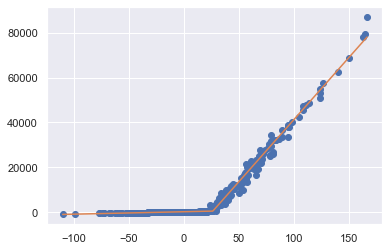

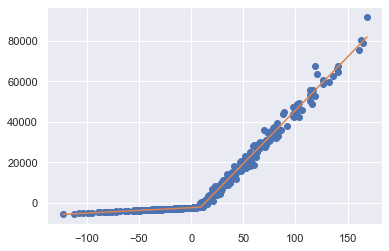

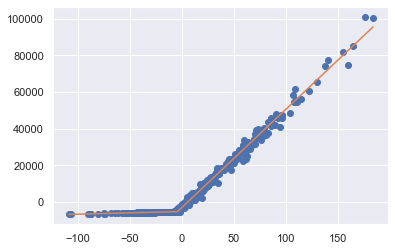

 14% (42 of 300) |###                    | Elapsed Time: 0:43:00 ETA:   4:38:22

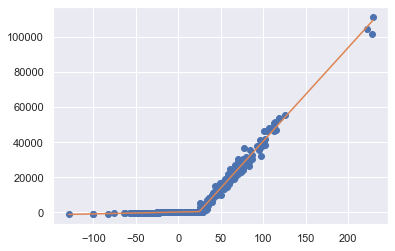

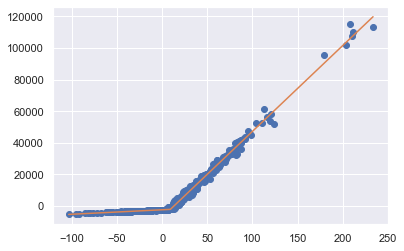

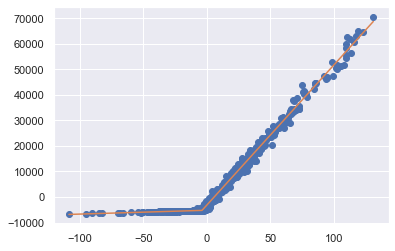

 14% (43 of 300) |###                    | Elapsed Time: 0:44:02 ETA:   4:27:27

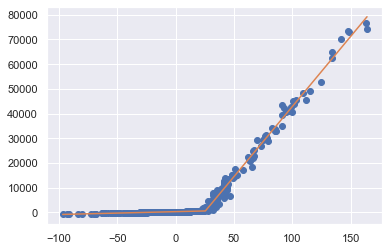

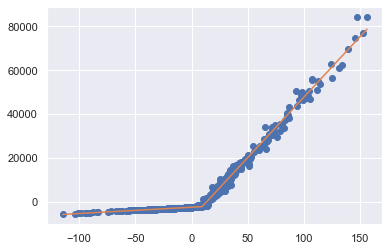

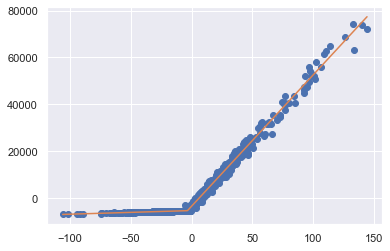

 14% (44 of 300) |###                    | Elapsed Time: 0:45:03 ETA:   4:21:21

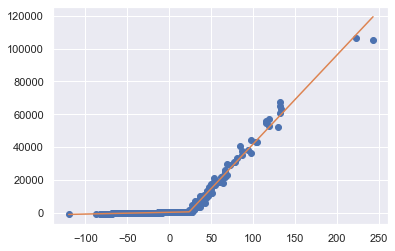

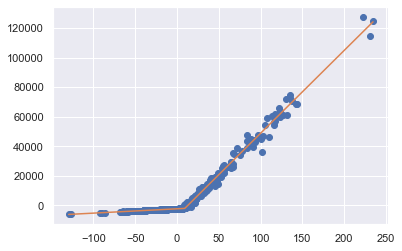

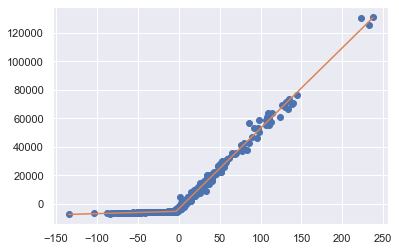

 15% (45 of 300) |###                    | Elapsed Time: 0:46:04 ETA:   4:19:23

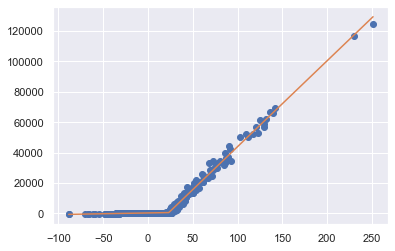

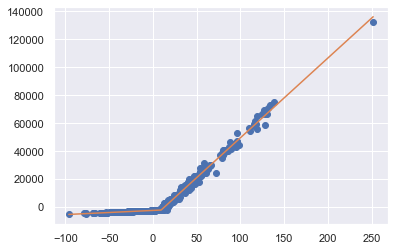

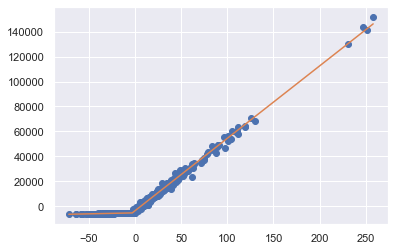

 15% (46 of 300) |###                    | Elapsed Time: 0:47:08 ETA:   4:30:10

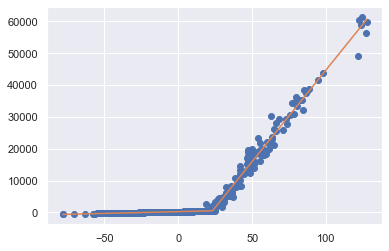

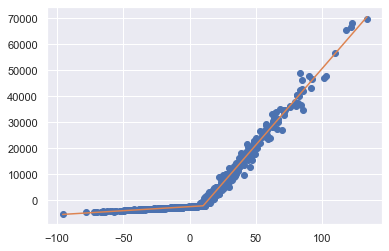

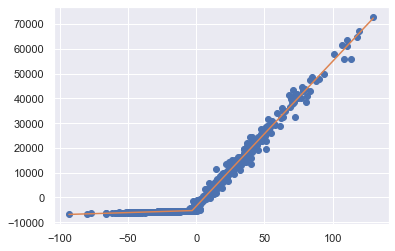

 15% (47 of 300) |###                    | Elapsed Time: 0:48:10 ETA:   4:23:02

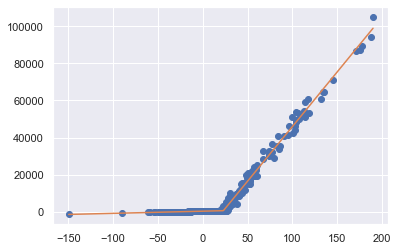

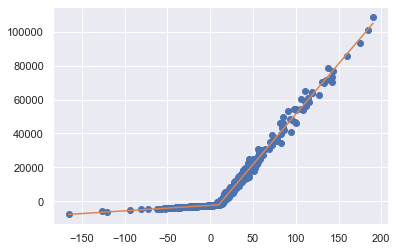

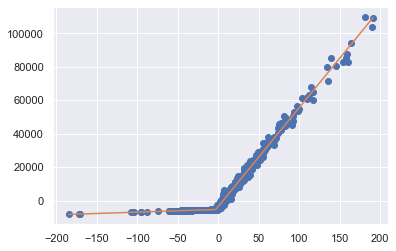

 16% (48 of 300) |###                    | Elapsed Time: 0:49:15 ETA:   4:32:37

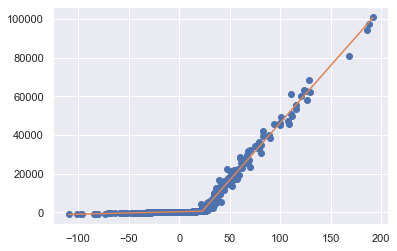

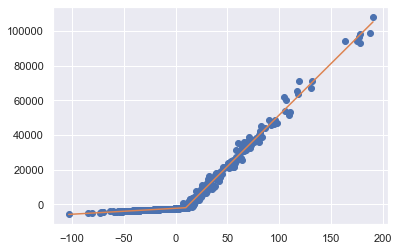

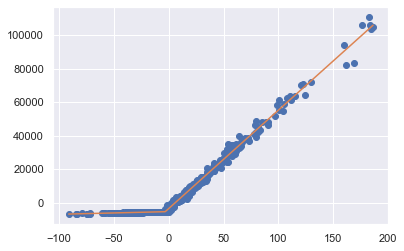

 16% (49 of 300) |###                    | Elapsed Time: 0:50:19 ETA:   4:25:10

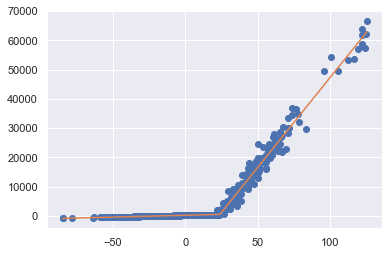

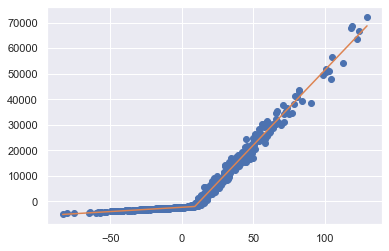

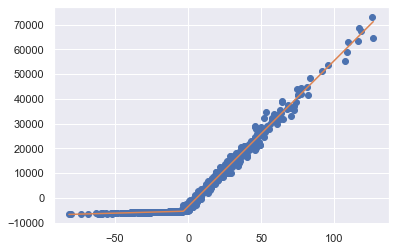

 16% (50 of 300) |###                    | Elapsed Time: 0:51:22 ETA:   4:22:47

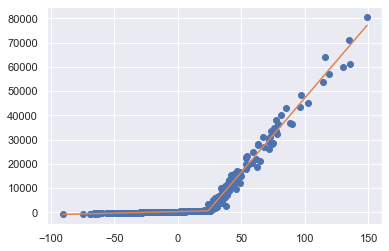

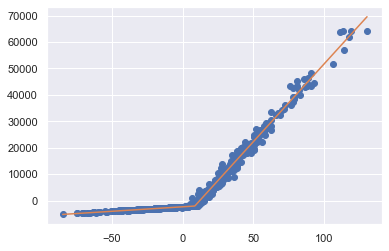

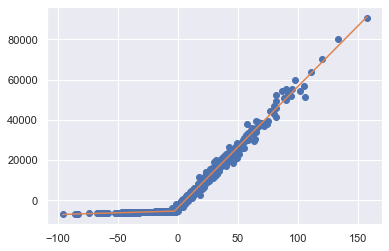

 17% (51 of 300) |###                    | Elapsed Time: 0:52:24 ETA:   4:16:50

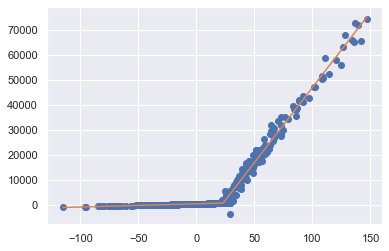

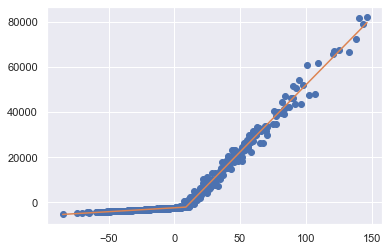

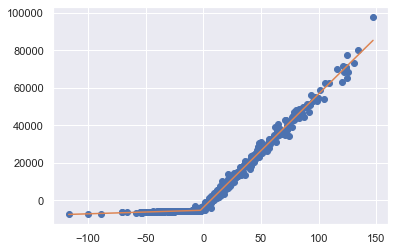

 17% (52 of 300) |###                    | Elapsed Time: 0:53:27 ETA:   4:21:07

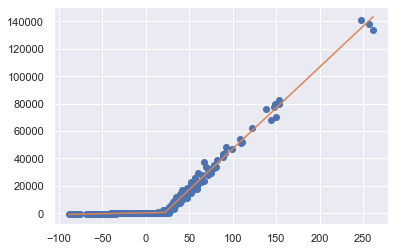

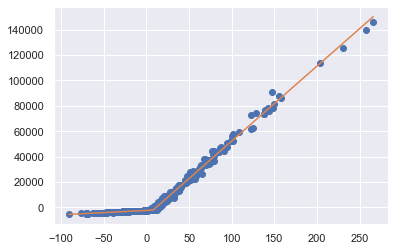

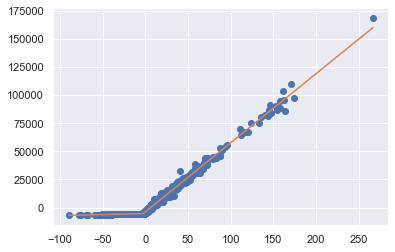

 17% (53 of 300) |####                   | Elapsed Time: 0:54:29 ETA:   4:15:39

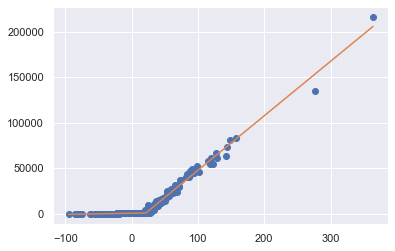

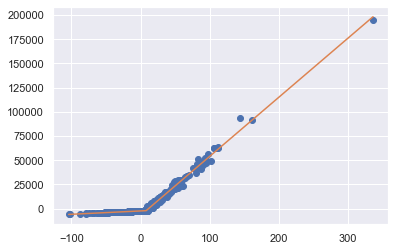

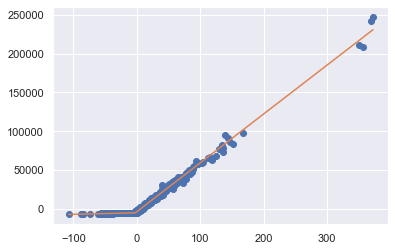

 18% (54 of 300) |####                   | Elapsed Time: 0:55:33 ETA:   4:22:05

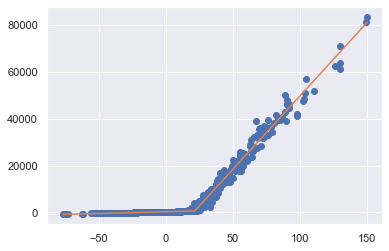

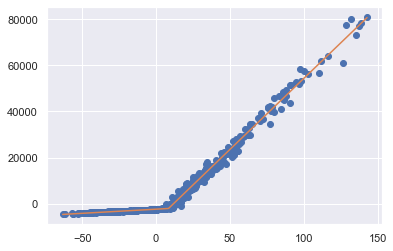

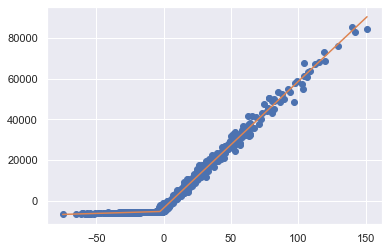

 18% (55 of 300) |####                   | Elapsed Time: 0:56:34 ETA:   4:11:29

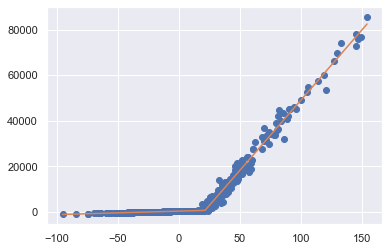

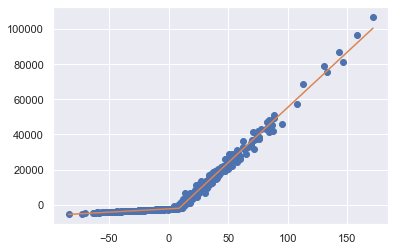

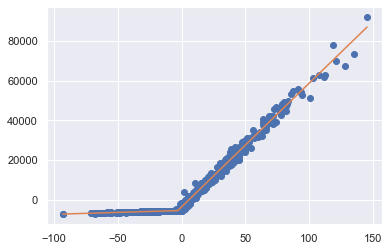

 18% (56 of 300) |####                   | Elapsed Time: 0:57:35 ETA:   4:05:33

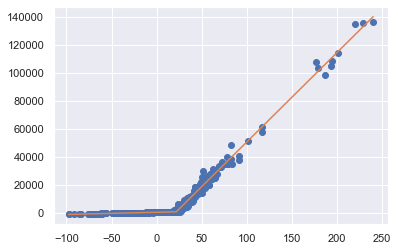

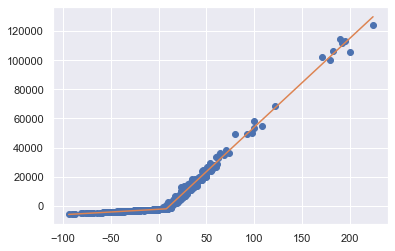

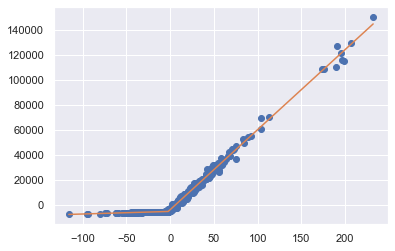

 19% (57 of 300) |####                   | Elapsed Time: 0:58:36 ETA:   4:06:42

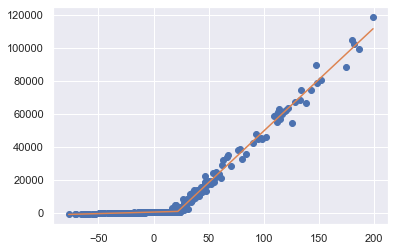

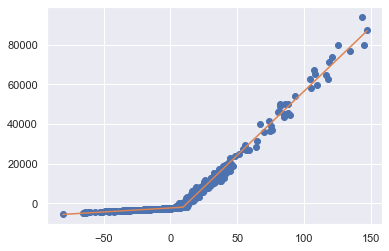

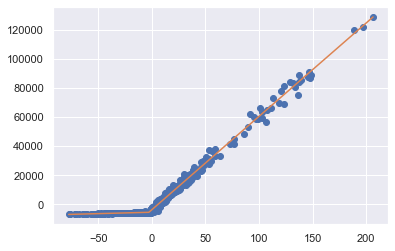

 19% (58 of 300) |####                   | Elapsed Time: 0:59:37 ETA:   4:07:16

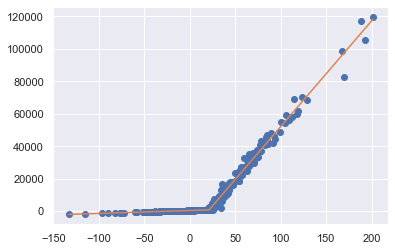

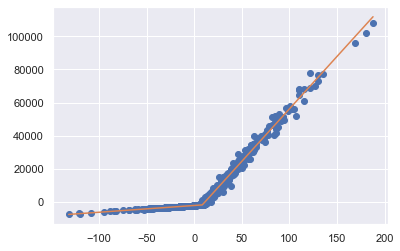

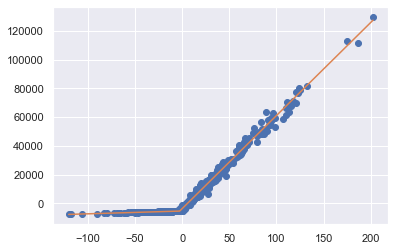

 19% (59 of 300) |####                   | Elapsed Time: 1:00:41 ETA:   4:16:05

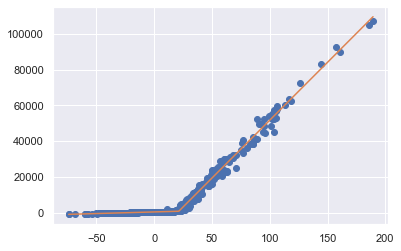

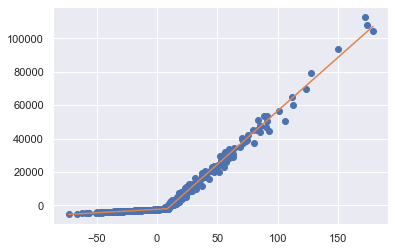

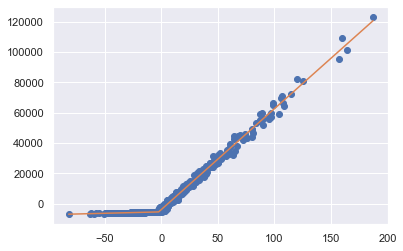

 20% (60 of 300) |####                   | Elapsed Time: 1:01:41 ETA:   4:00:26

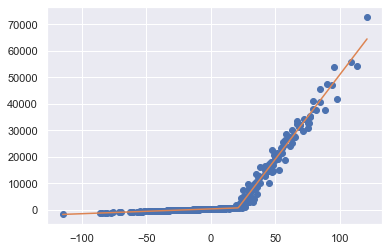

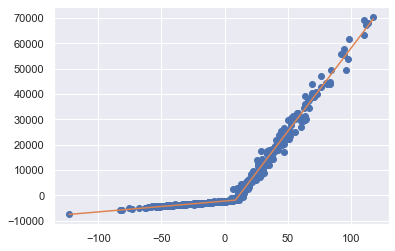

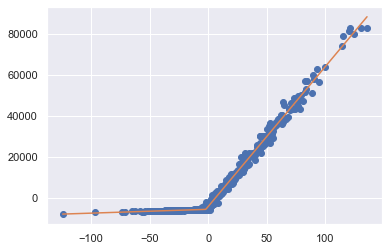

 20% (61 of 300) |####                   | Elapsed Time: 1:02:43 ETA:   4:07:58

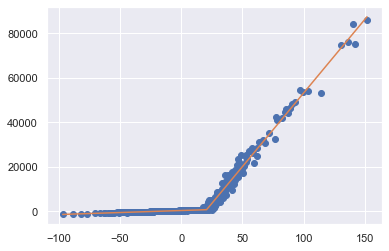

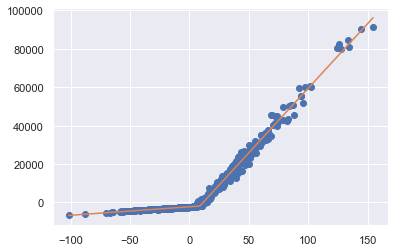

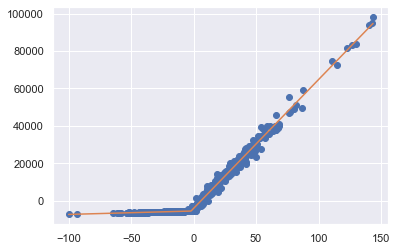

 20% (62 of 300) |####                   | Elapsed Time: 1:03:45 ETA:   4:06:02

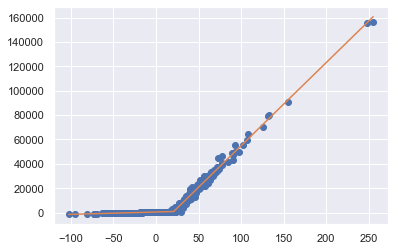

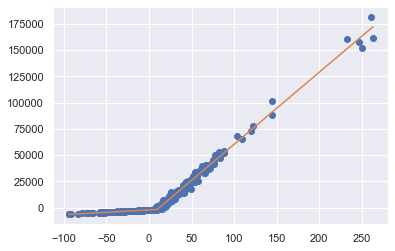

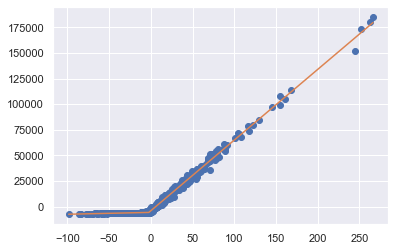

 21% (63 of 300) |####                   | Elapsed Time: 1:04:48 ETA:   4:08:33

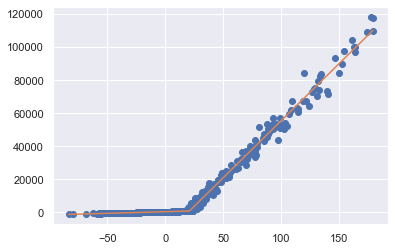

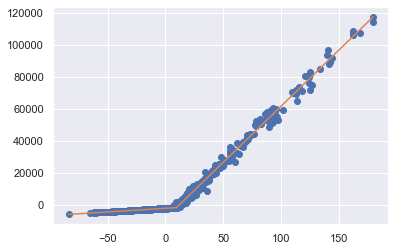

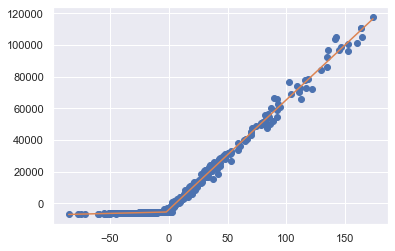

 21% (64 of 300) |####                   | Elapsed Time: 1:05:50 ETA:   4:04:39

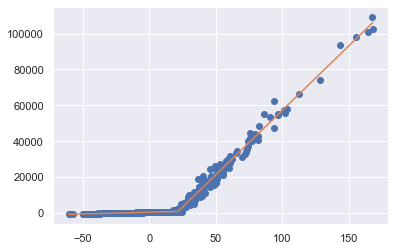

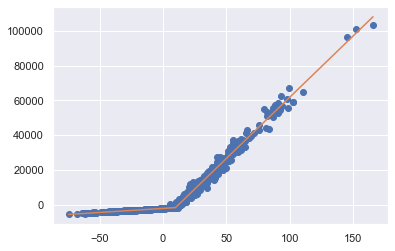

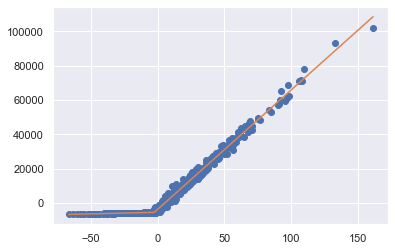

 21% (65 of 300) |####                   | Elapsed Time: 1:06:55 ETA:   4:13:22

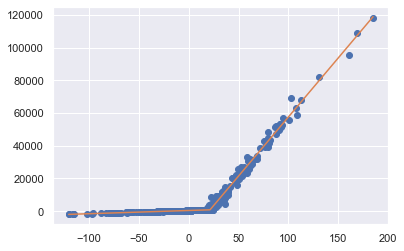

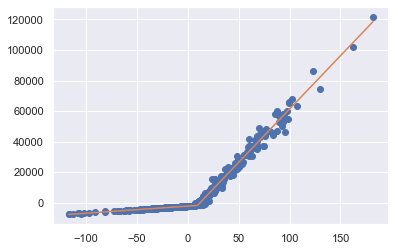

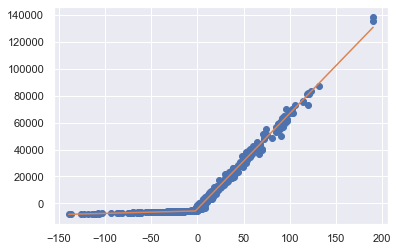

 22% (66 of 300) |#####                  | Elapsed Time: 1:07:57 ETA:   4:03:14

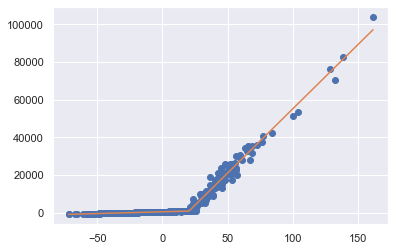

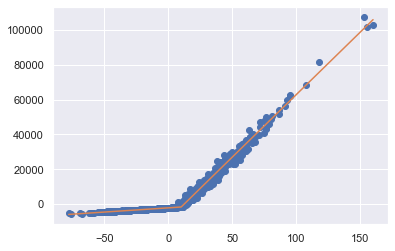

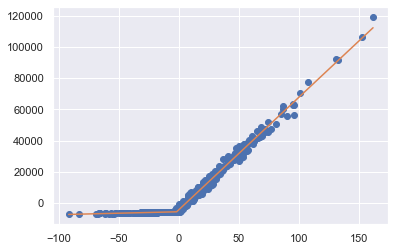

 22% (67 of 300) |#####                  | Elapsed Time: 1:09:04 ETA:   4:17:45

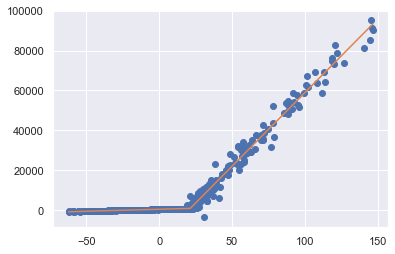

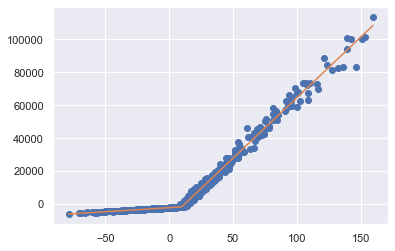

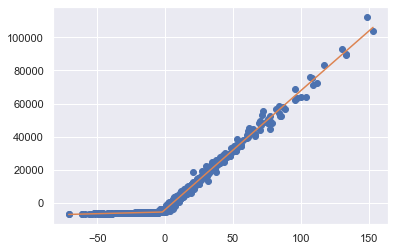

 22% (68 of 300) |#####                  | Elapsed Time: 1:10:08 ETA:   4:06:36

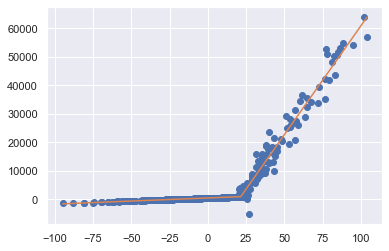

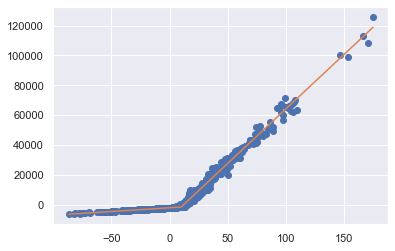

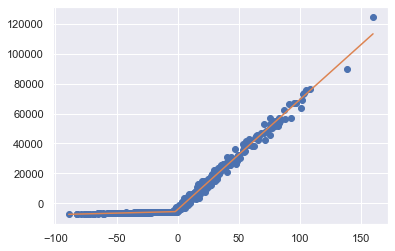

 23% (69 of 300) |#####                  | Elapsed Time: 1:11:12 ETA:   4:07:34

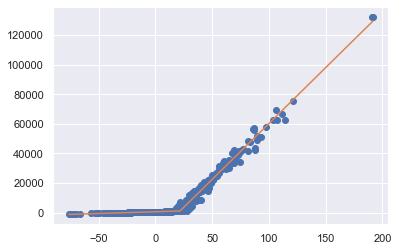

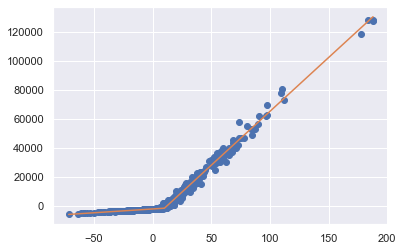

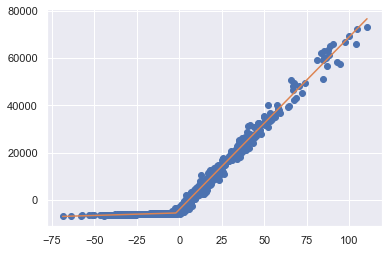

 23% (70 of 300) |#####                  | Elapsed Time: 1:12:15 ETA:   4:00:52

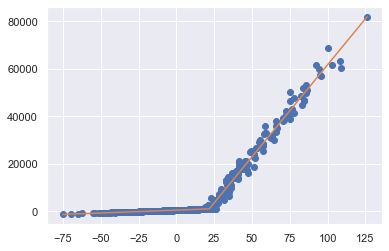

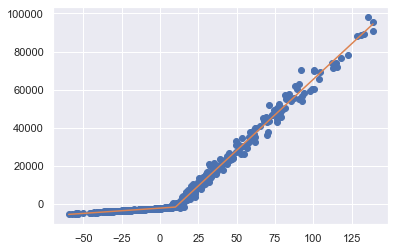

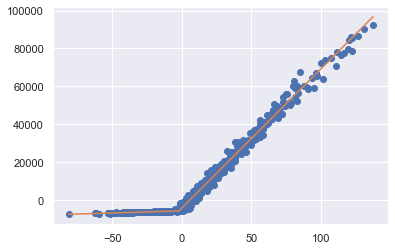

 23% (71 of 300) |#####                  | Elapsed Time: 1:13:17 ETA:   3:57:37

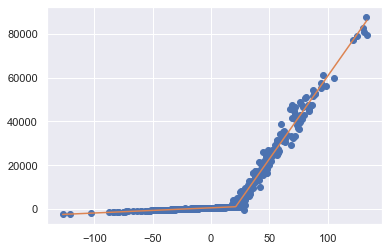

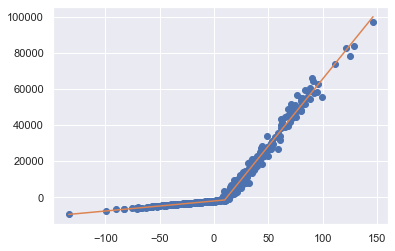

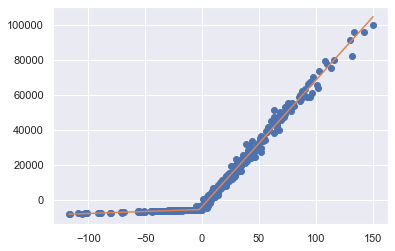

 24% (72 of 300) |#####                  | Elapsed Time: 1:14:18 ETA:   3:51:24

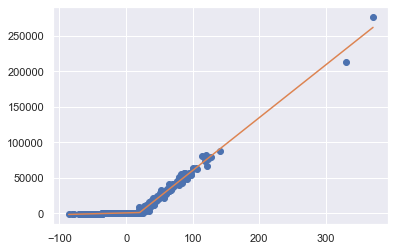

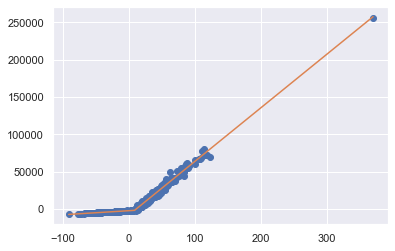

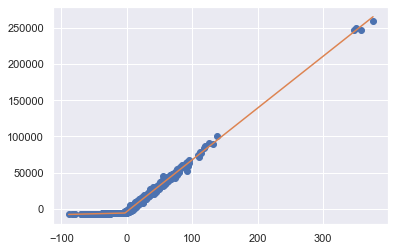

 24% (73 of 300) |#####                  | Elapsed Time: 1:15:18 ETA:   3:47:03

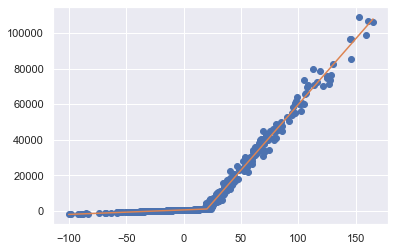

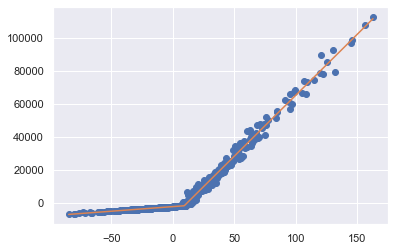

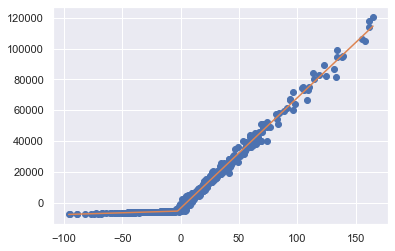

 24% (74 of 300) |#####                  | Elapsed Time: 1:16:19 ETA:   3:48:41

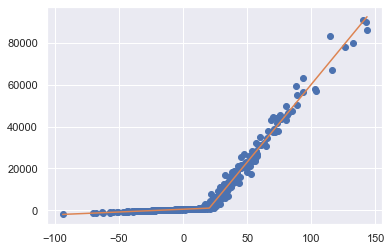

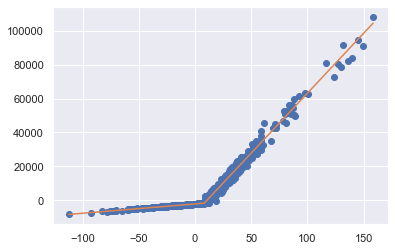

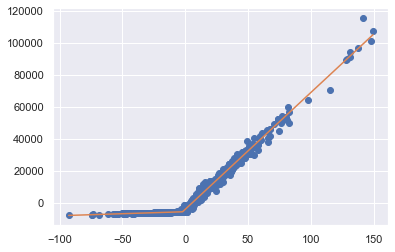

 25% (75 of 300) |#####                  | Elapsed Time: 1:17:24 ETA:   4:05:26

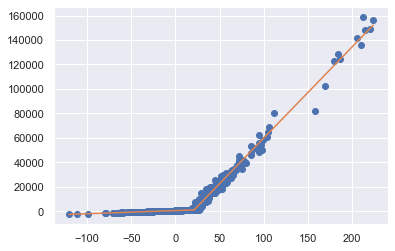

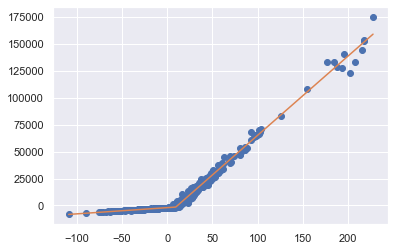

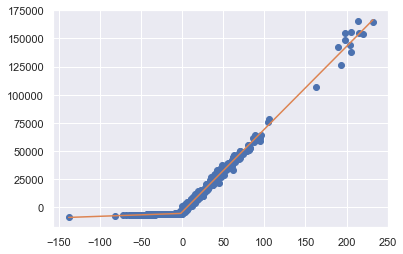

 25% (76 of 300) |#####                  | Elapsed Time: 1:18:26 ETA:   3:51:43

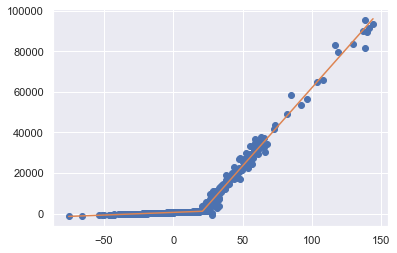

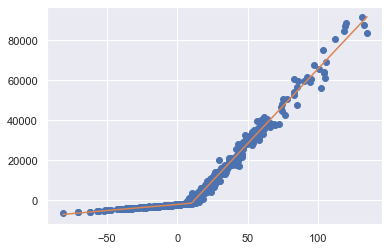

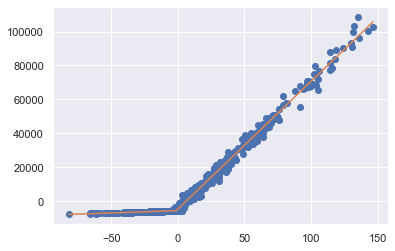

 25% (77 of 300) |#####                  | Elapsed Time: 1:19:29 ETA:   3:52:51

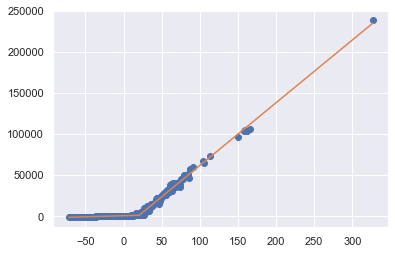

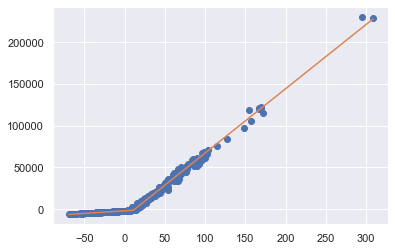

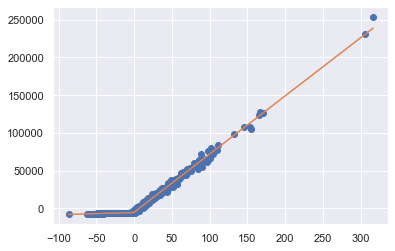

 26% (78 of 300) |#####                  | Elapsed Time: 1:20:34 ETA:   4:00:38

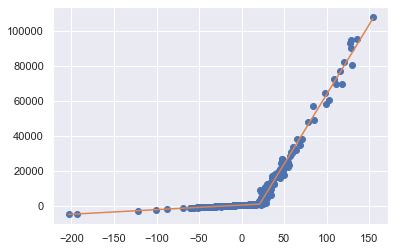

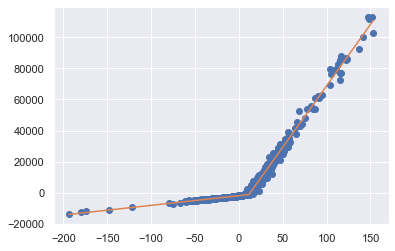

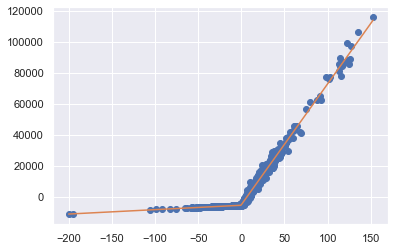

 26% (79 of 300) |######                 | Elapsed Time: 1:21:38 ETA:   3:57:09

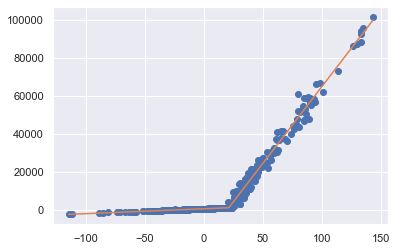

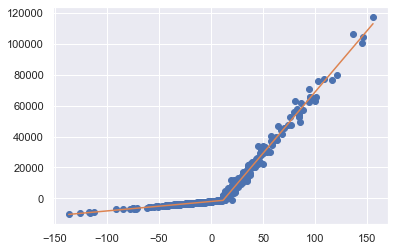

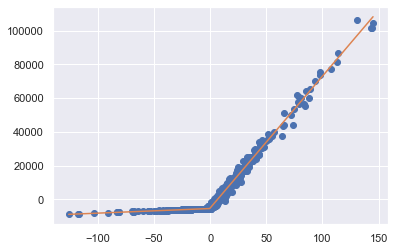

 26% (80 of 300) |######                 | Elapsed Time: 1:22:40 ETA:   3:45:10

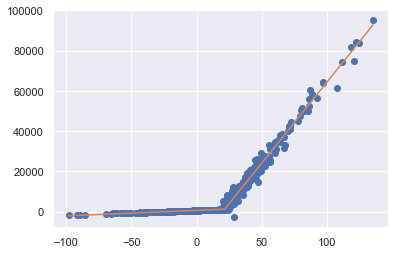

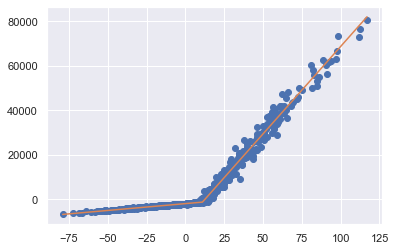

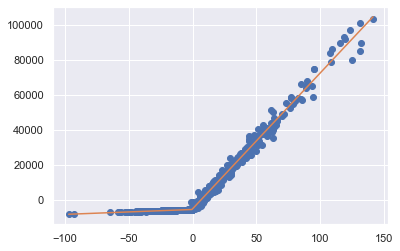

 27% (81 of 300) |######                 | Elapsed Time: 1:23:42 ETA:   3:48:01

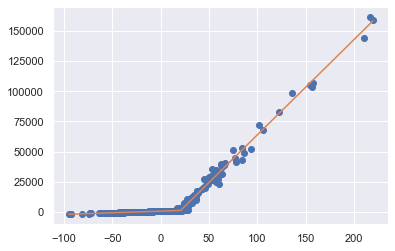

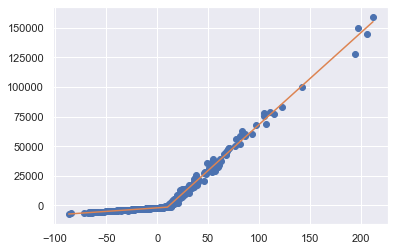

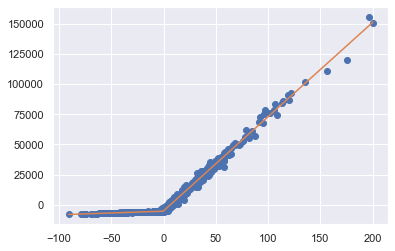

 27% (82 of 300) |######                 | Elapsed Time: 1:24:42 ETA:   3:38:38

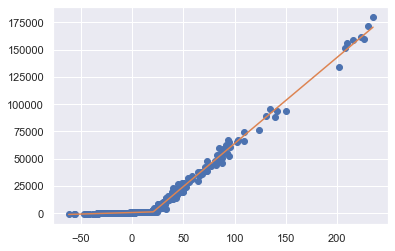

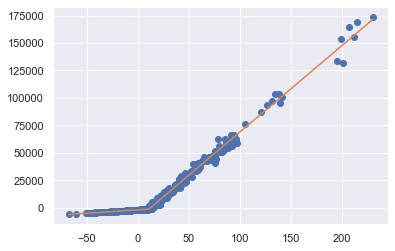

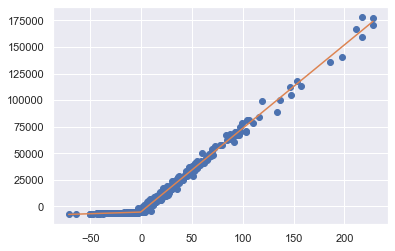

 27% (83 of 300) |######                 | Elapsed Time: 1:25:45 ETA:   3:47:59

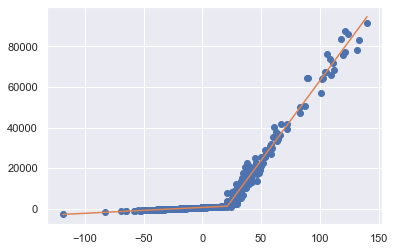

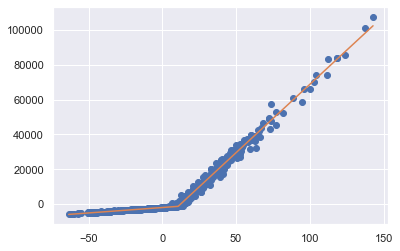

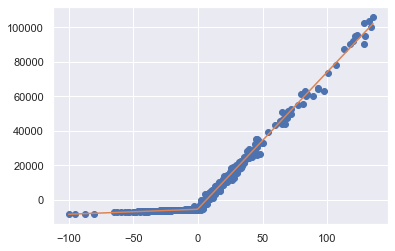

 28% (84 of 300) |######                 | Elapsed Time: 1:26:50 ETA:   3:52:05

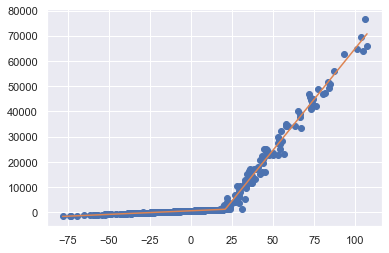

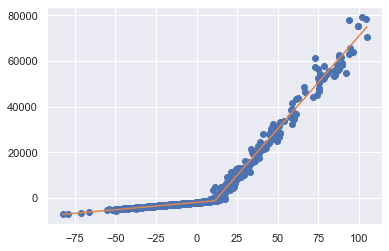

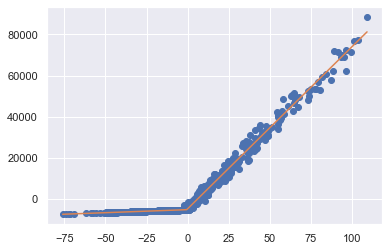

 28% (85 of 300) |######                 | Elapsed Time: 1:27:52 ETA:   3:42:23

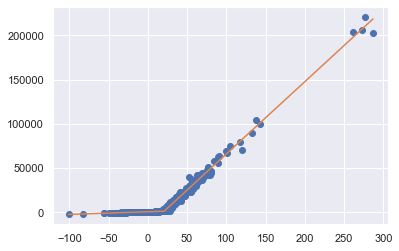

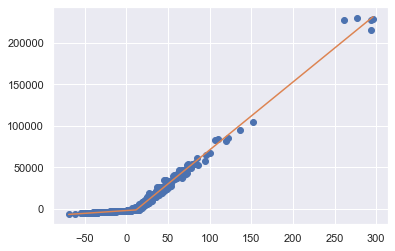

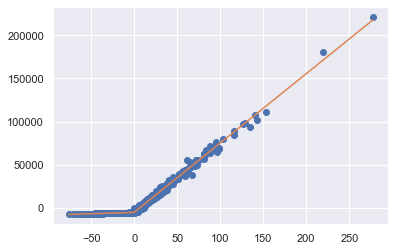

 28% (86 of 300) |######                 | Elapsed Time: 1:28:56 ETA:   3:50:12

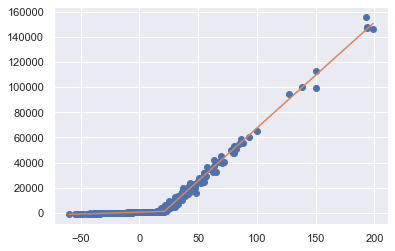

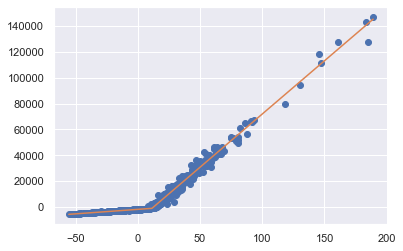

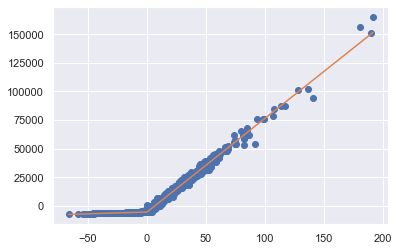

 29% (87 of 300) |######                 | Elapsed Time: 1:30:00 ETA:   3:44:01

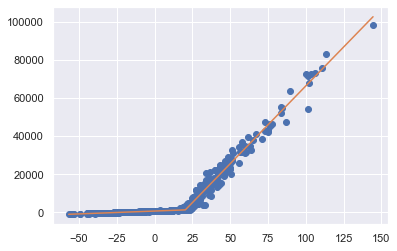

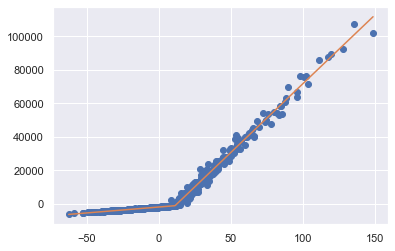

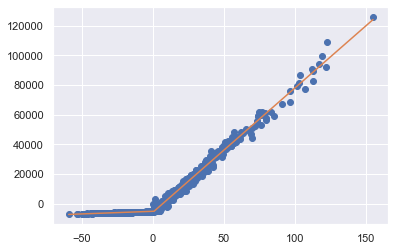

 29% (88 of 300) |######                 | Elapsed Time: 1:31:01 ETA:   3:36:02

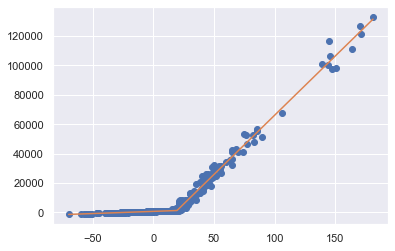

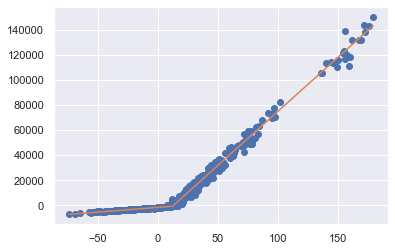

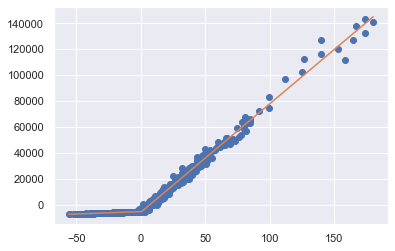

 29% (89 of 300) |######                 | Elapsed Time: 1:32:05 ETA:   3:47:23

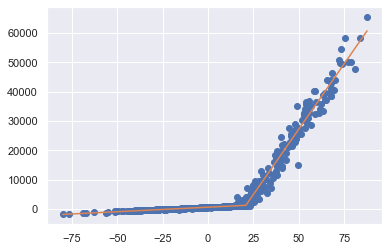

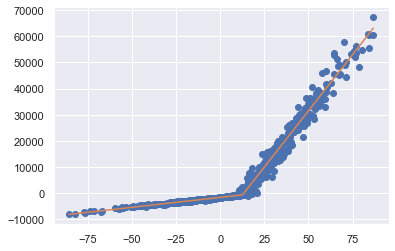

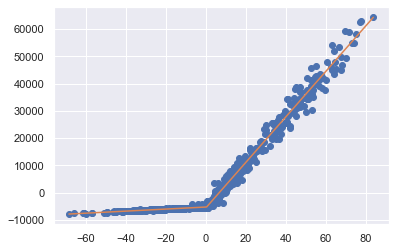

 30% (90 of 300) |######                 | Elapsed Time: 1:33:10 ETA:   3:46:16

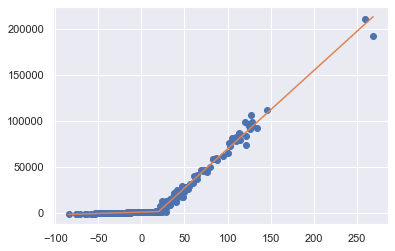

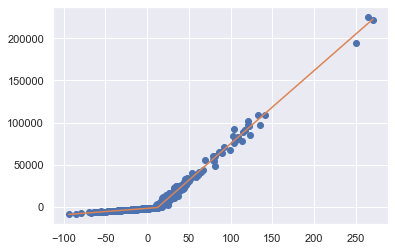

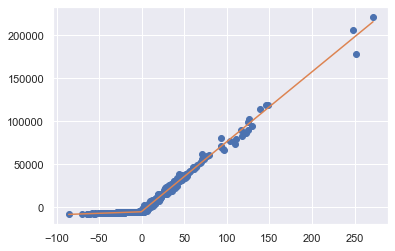

 30% (91 of 300) |######                 | Elapsed Time: 1:34:13 ETA:   3:39:05

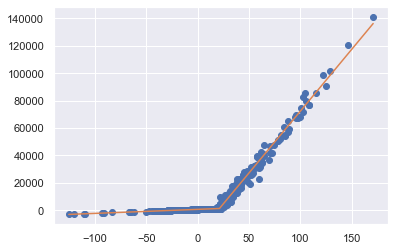

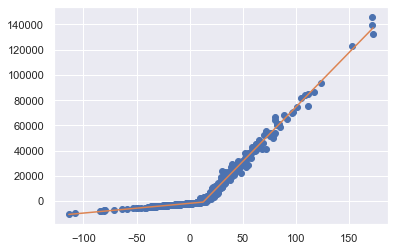

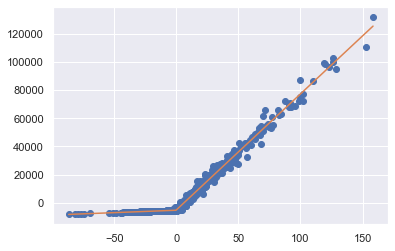

 30% (92 of 300) |#######                | Elapsed Time: 1:35:15 ETA:   3:36:31

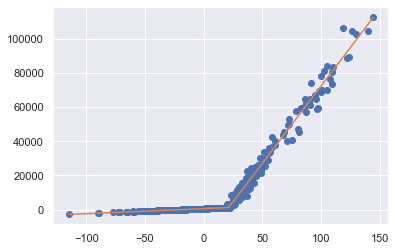

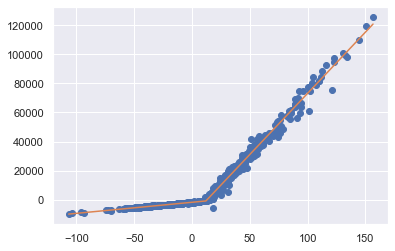

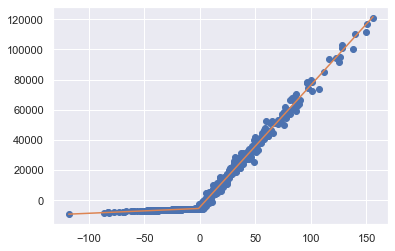

 31% (93 of 300) |#######                | Elapsed Time: 1:36:20 ETA:   3:42:52

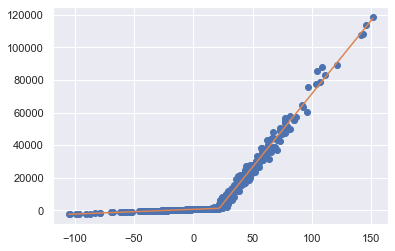

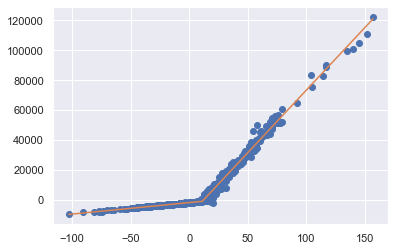

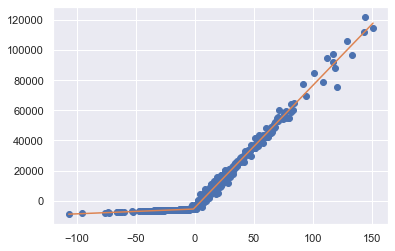

 31% (94 of 300) |#######                | Elapsed Time: 1:37:20 ETA:   3:26:40

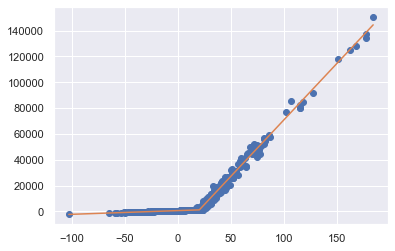

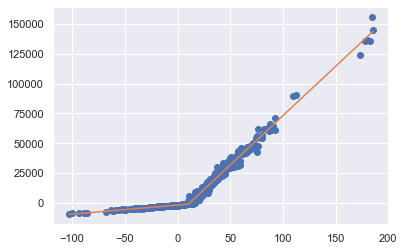

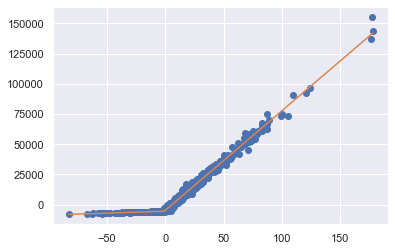

 31% (95 of 300) |#######                | Elapsed Time: 1:38:22 ETA:   3:30:25

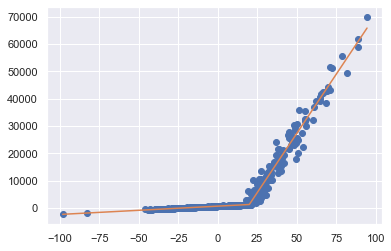

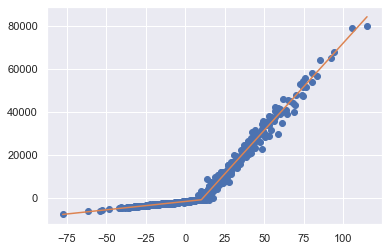

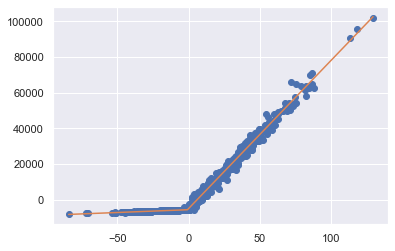

 32% (96 of 300) |#######                | Elapsed Time: 1:39:24 ETA:   3:31:06

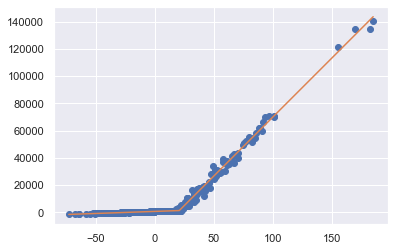

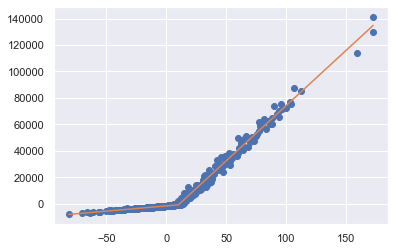

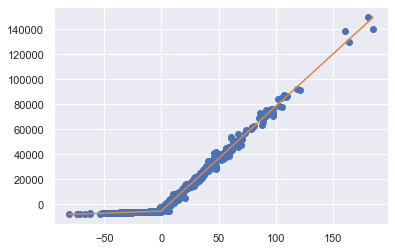

 32% (97 of 300) |#######                | Elapsed Time: 1:40:26 ETA:   3:32:09

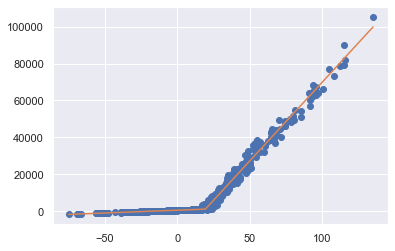

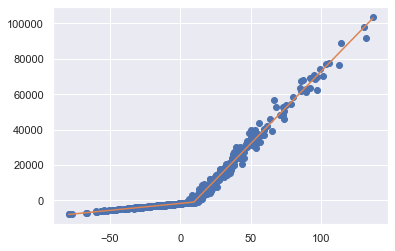

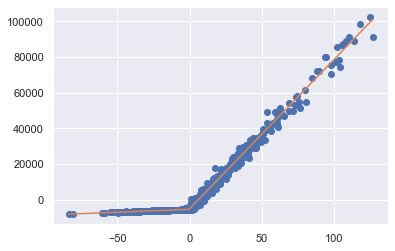

 32% (98 of 300) |#######                | Elapsed Time: 1:41:27 ETA:   3:24:13

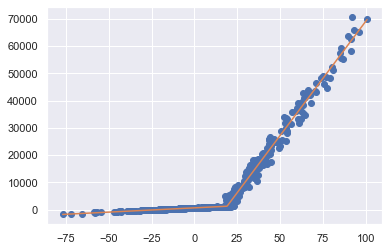

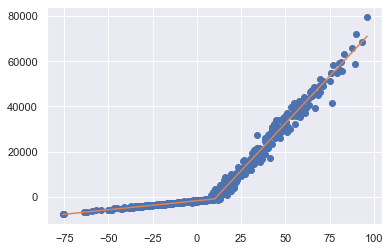

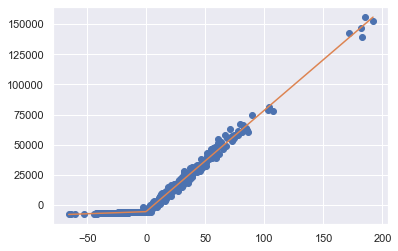

 33% (99 of 300) |#######                | Elapsed Time: 1:42:30 ETA:   3:30:45

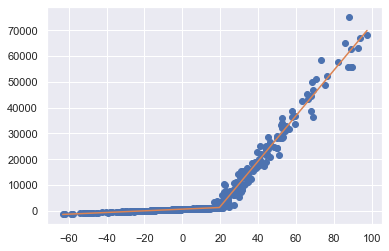

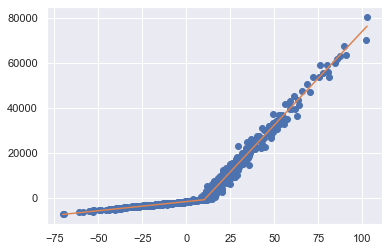

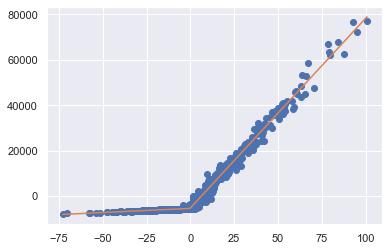

 33% (100 of 300) |#######               | Elapsed Time: 1:43:34 ETA:   3:31:41

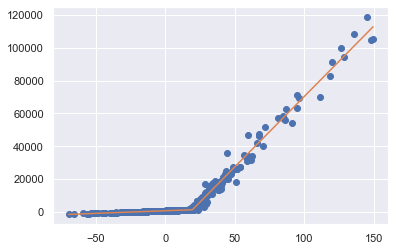

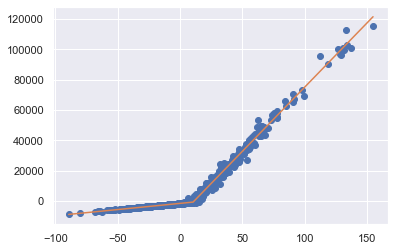

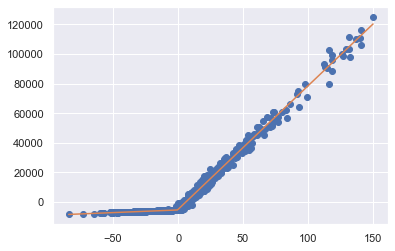

 33% (101 of 300) |#######               | Elapsed Time: 1:44:38 ETA:   3:33:31

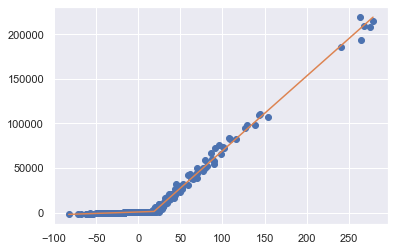

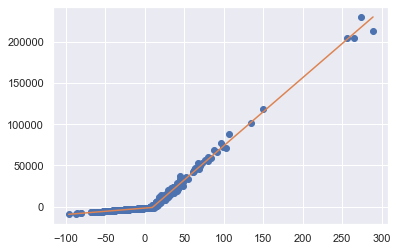

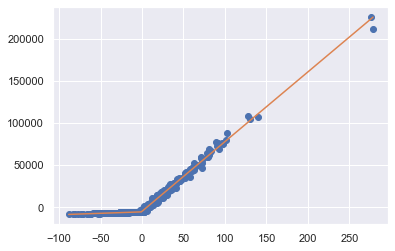

 34% (102 of 300) |#######               | Elapsed Time: 1:45:41 ETA:   3:26:38

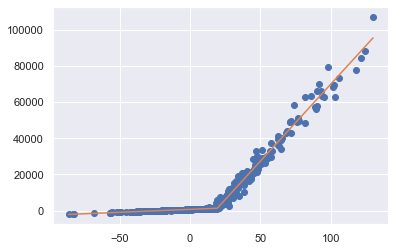

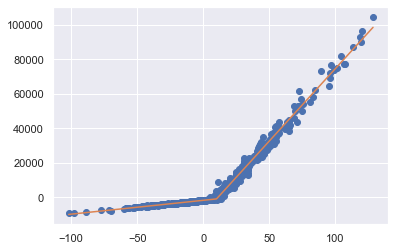

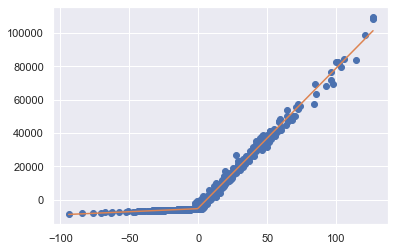

 34% (103 of 300) |#######               | Elapsed Time: 1:46:46 ETA:   3:34:42

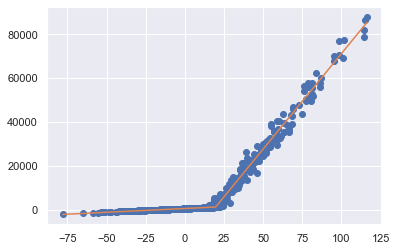

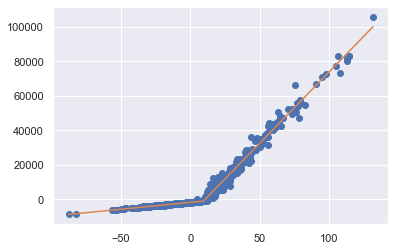

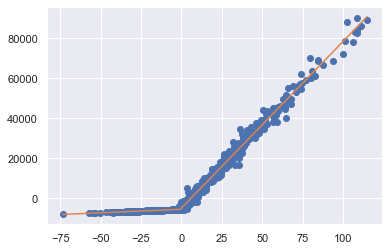

 34% (104 of 300) |#######               | Elapsed Time: 1:47:46 ETA:   3:16:17

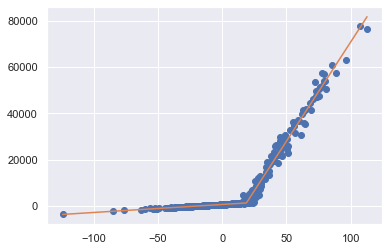

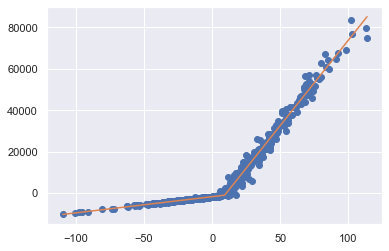

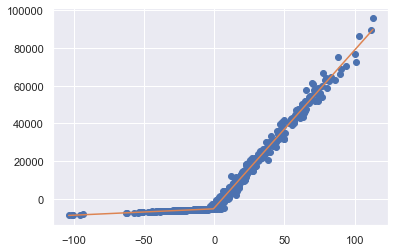

 35% (105 of 300) |#######               | Elapsed Time: 1:48:50 ETA:   3:28:53

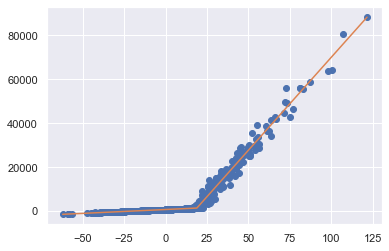

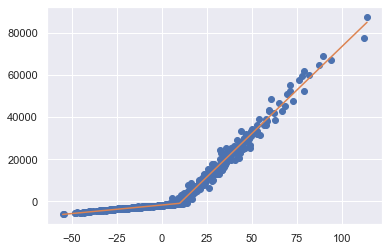

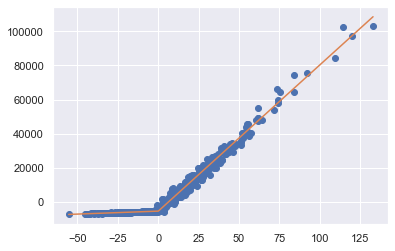

 35% (106 of 300) |#######               | Elapsed Time: 1:49:52 ETA:   3:18:46

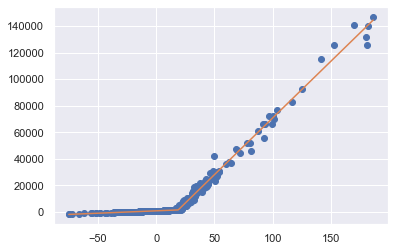

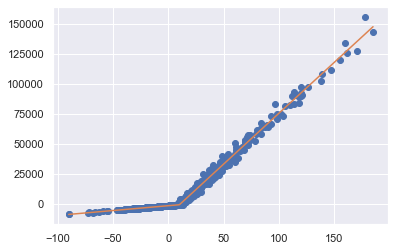

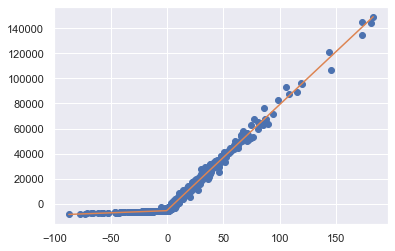

 35% (107 of 300) |#######               | Elapsed Time: 1:50:57 ETA:   3:30:07

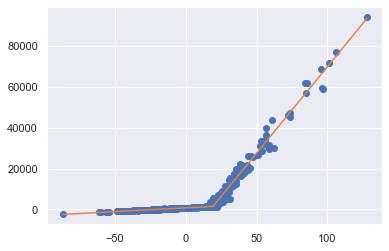

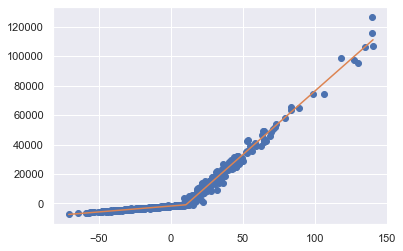

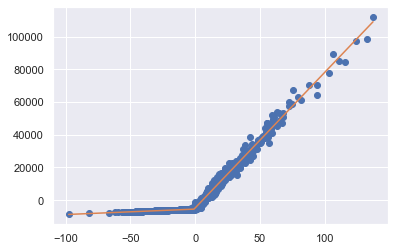

 36% (108 of 300) |#######               | Elapsed Time: 1:52:04 ETA:   3:33:09

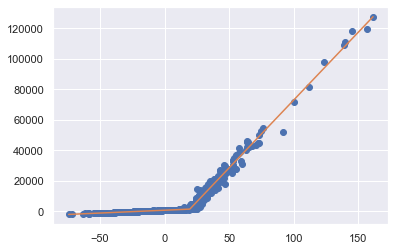

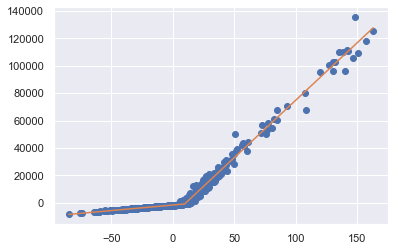

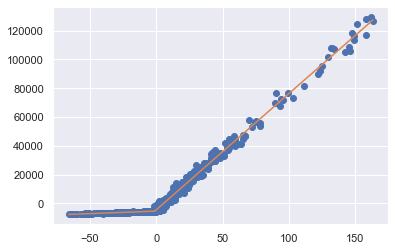

 36% (109 of 300) |#######               | Elapsed Time: 1:53:04 ETA:   3:13:05

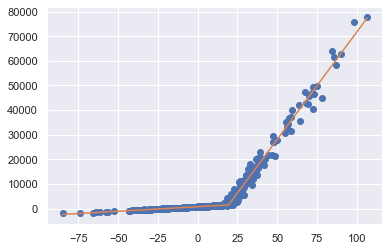

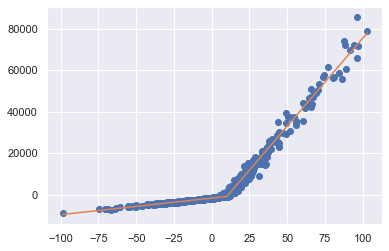

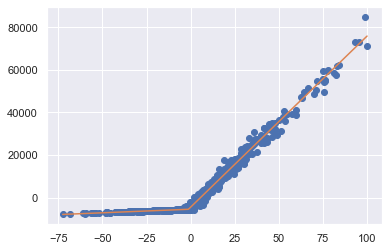

 36% (110 of 300) |########              | Elapsed Time: 1:54:07 ETA:   3:17:08

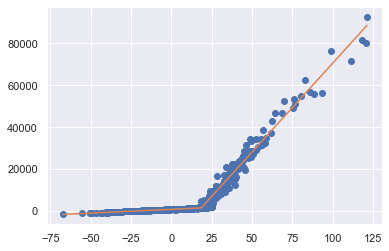

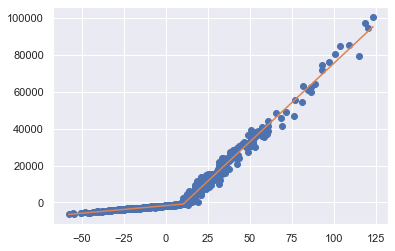

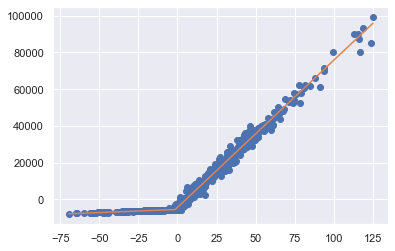

 37% (111 of 300) |########              | Elapsed Time: 1:55:10 ETA:   3:18:01

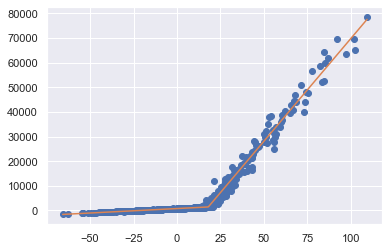

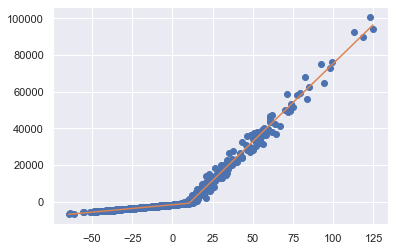

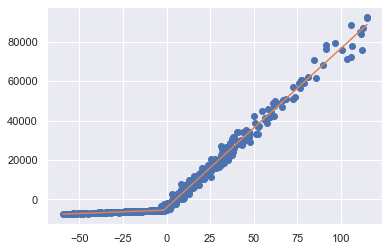

 37% (112 of 300) |########              | Elapsed Time: 1:56:13 ETA:   3:17:49

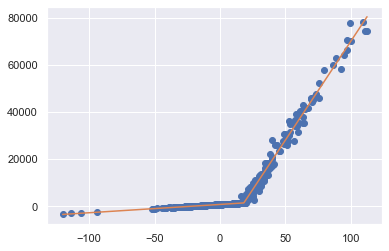

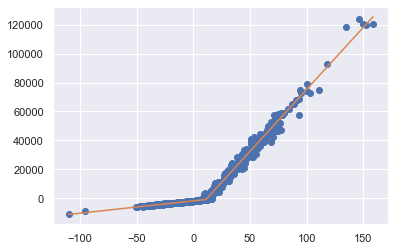

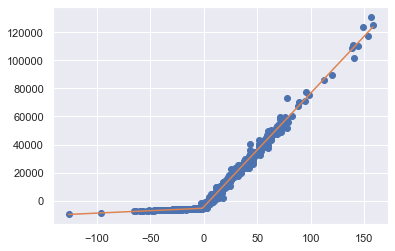

 37% (113 of 300) |########              | Elapsed Time: 1:57:17 ETA:   3:20:45

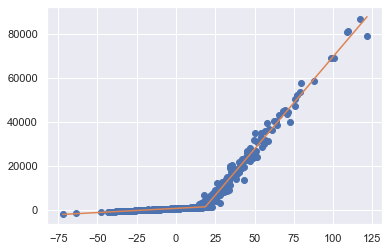

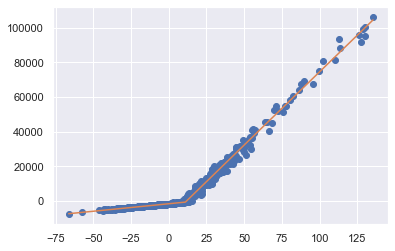

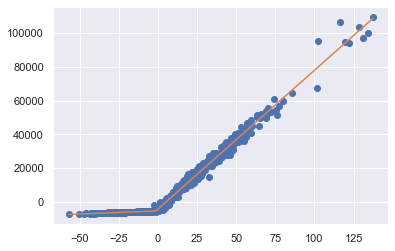

 38% (114 of 300) |########              | Elapsed Time: 1:58:21 ETA:   3:16:50

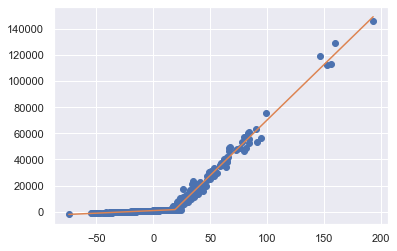

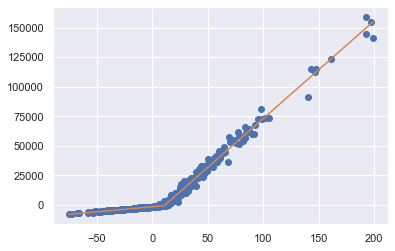

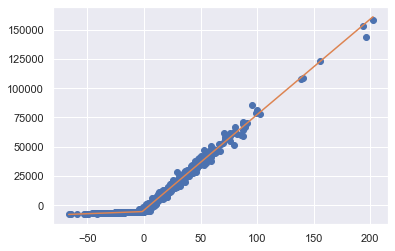

 38% (115 of 300) |########              | Elapsed Time: 1:59:23 ETA:   3:12:48

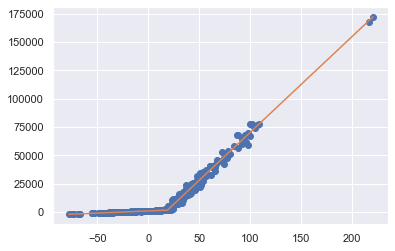

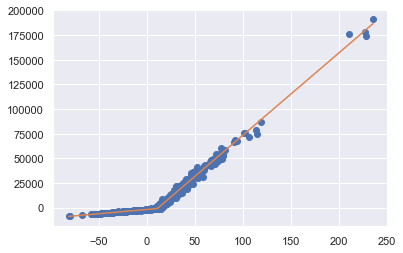

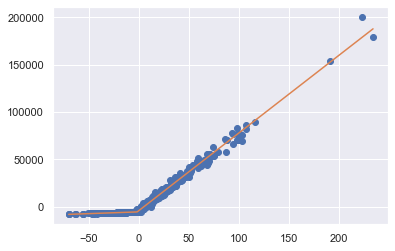

 38% (116 of 300) |########              | Elapsed Time: 2:00:24 ETA:   3:07:33

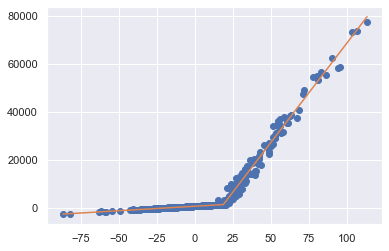

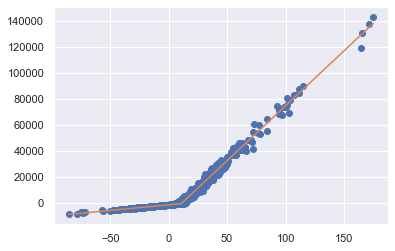

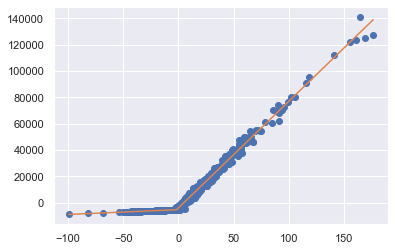

 39% (117 of 300) |########              | Elapsed Time: 2:01:27 ETA:   3:12:35

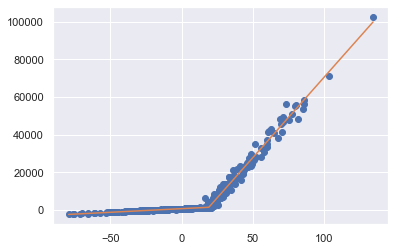

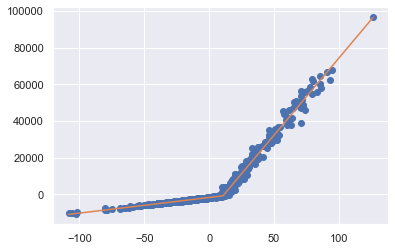

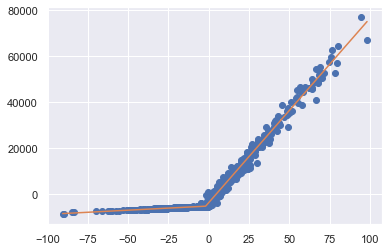

 39% (118 of 300) |########              | Elapsed Time: 2:02:31 ETA:   3:13:12

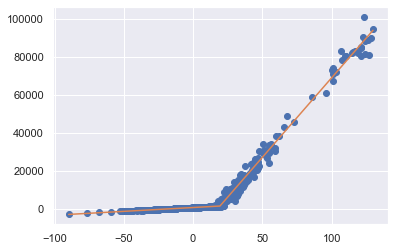

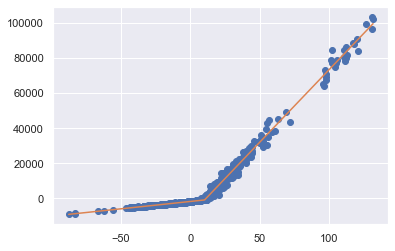

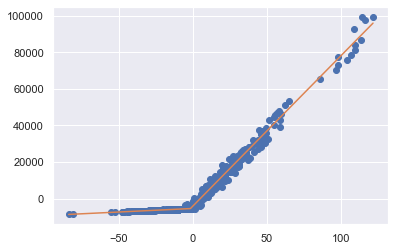

 39% (119 of 300) |########              | Elapsed Time: 2:03:34 ETA:   3:10:32

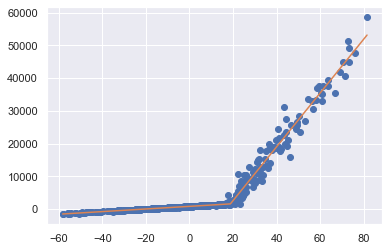

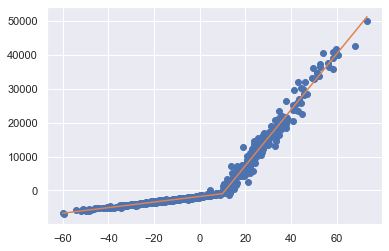

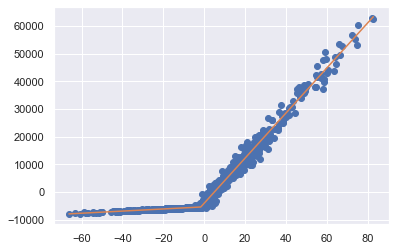

 40% (120 of 300) |########              | Elapsed Time: 2:04:35 ETA:   3:02:30

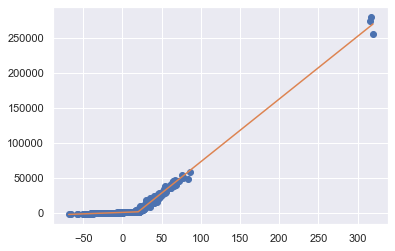

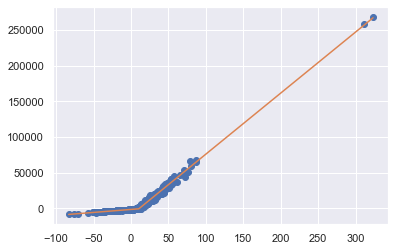

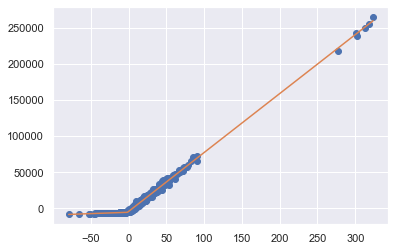

 40% (121 of 300) |########              | Elapsed Time: 2:05:37 ETA:   3:05:47

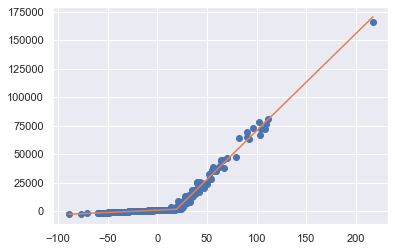

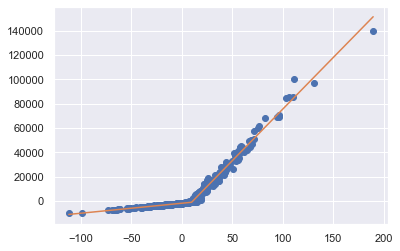

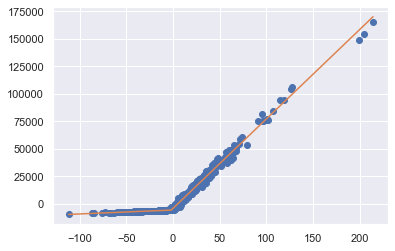

 40% (122 of 300) |########              | Elapsed Time: 2:06:40 ETA:   3:07:12

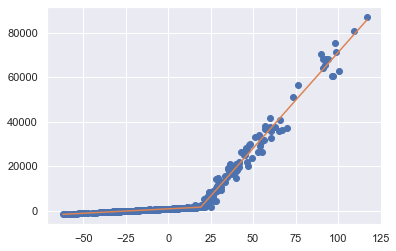

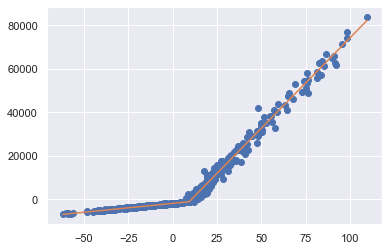

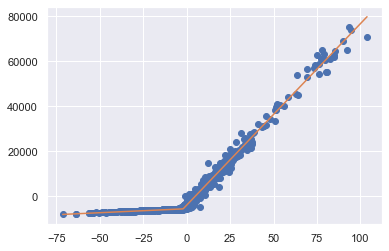

 41% (123 of 300) |#########             | Elapsed Time: 2:07:41 ETA:   2:58:59

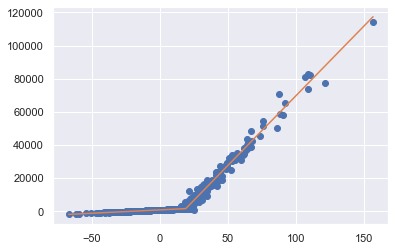

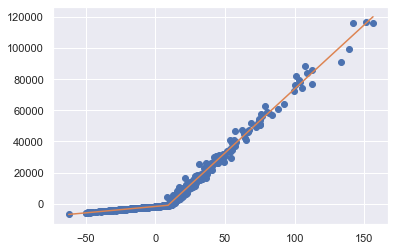

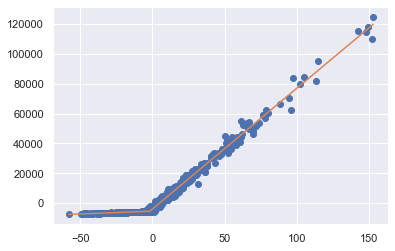

 41% (124 of 300) |#########             | Elapsed Time: 2:08:44 ETA:   3:03:16

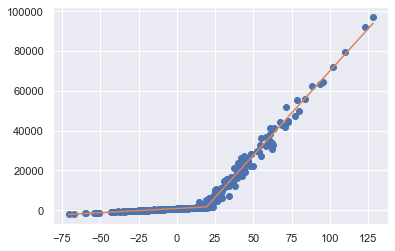

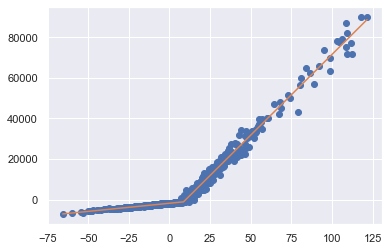

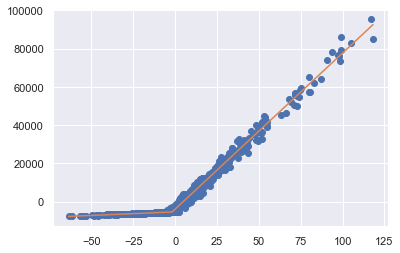

 41% (125 of 300) |#########             | Elapsed Time: 2:09:46 ETA:   3:02:22

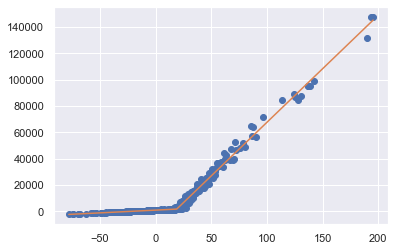

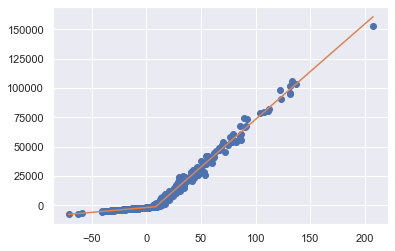

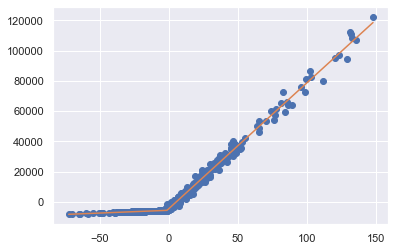

 42% (126 of 300) |#########             | Elapsed Time: 2:10:47 ETA:   2:56:23

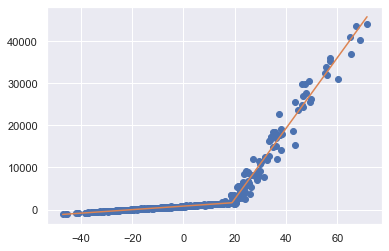

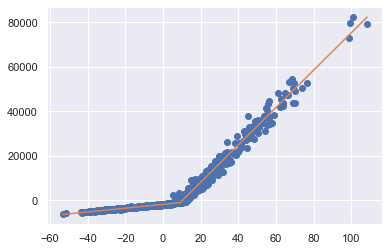

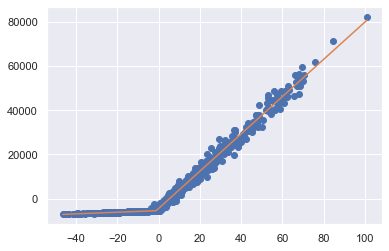

 42% (127 of 300) |#########             | Elapsed Time: 2:11:55 ETA:   3:16:10

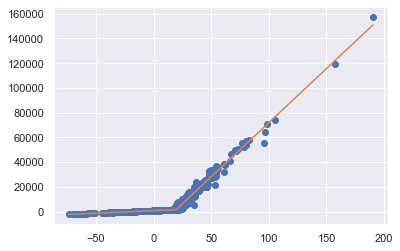

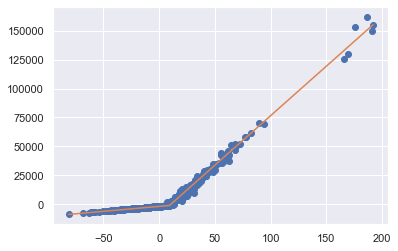

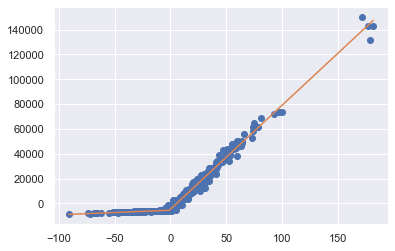

 42% (128 of 300) |#########             | Elapsed Time: 2:12:55 ETA:   2:52:52

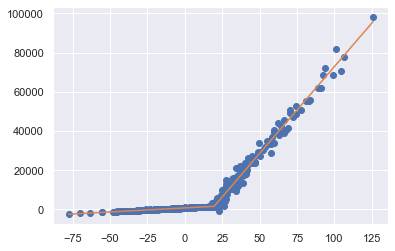

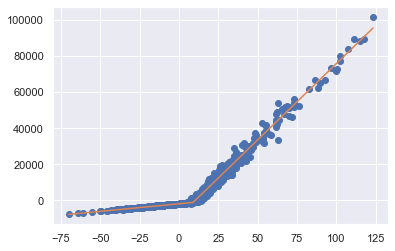

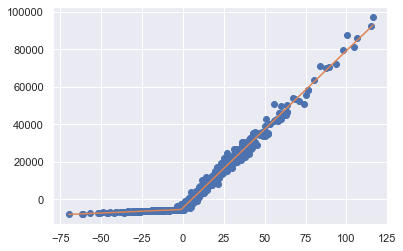

 43% (129 of 300) |#########             | Elapsed Time: 2:13:58 ETA:   2:57:27

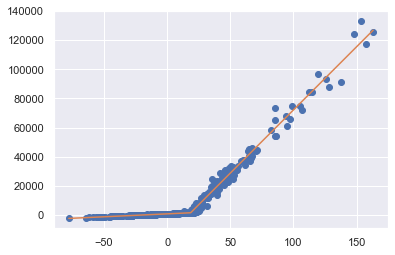

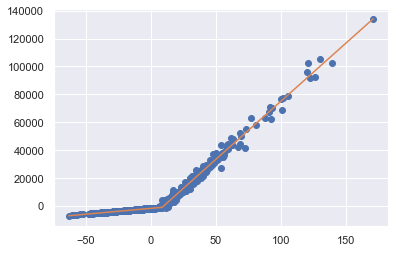

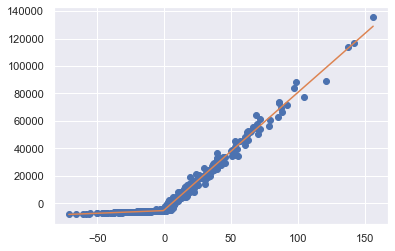

 43% (130 of 300) |#########             | Elapsed Time: 2:15:01 ETA:   2:58:30

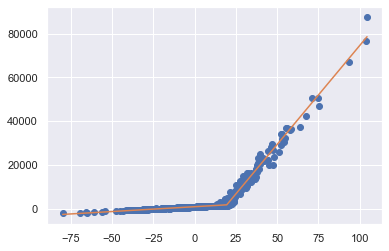

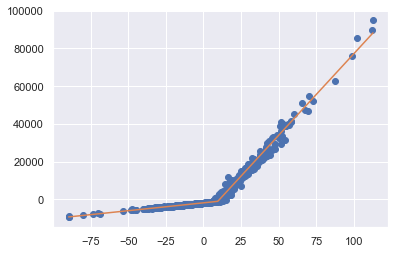

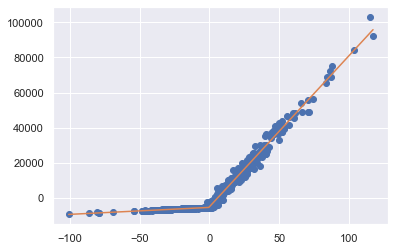

 43% (131 of 300) |#########             | Elapsed Time: 2:16:03 ETA:   2:56:27

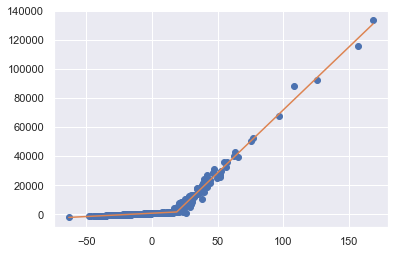

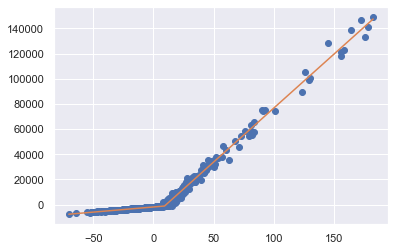

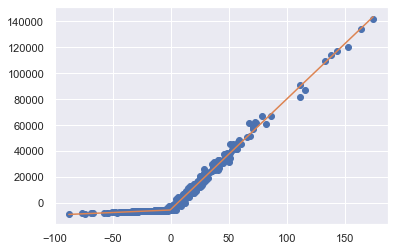

 44% (132 of 300) |#########             | Elapsed Time: 2:17:07 ETA:   2:59:10

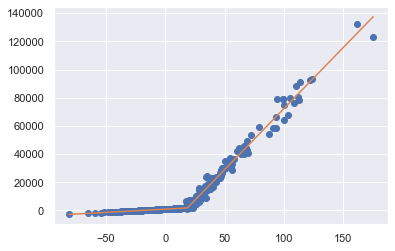

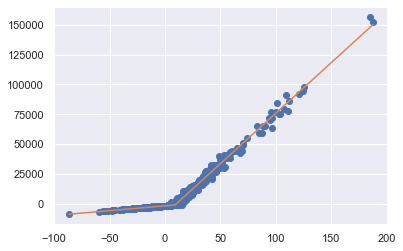

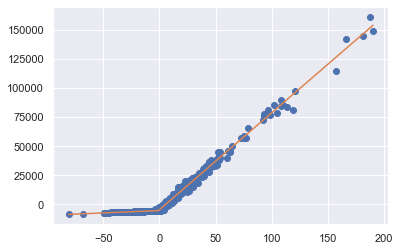

 44% (133 of 300) |#########             | Elapsed Time: 2:18:12 ETA:   2:59:33

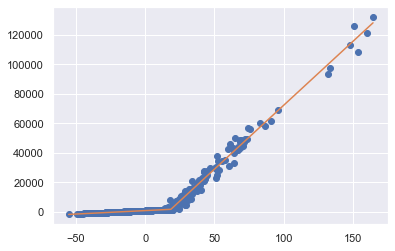

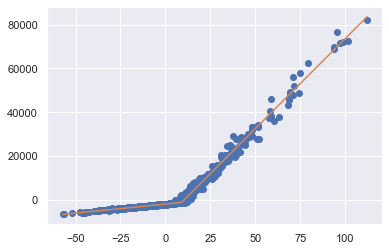

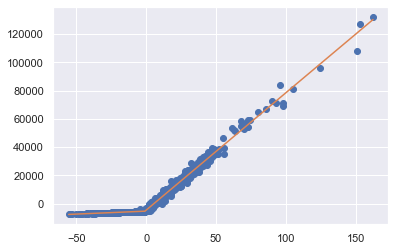

 44% (134 of 300) |#########             | Elapsed Time: 2:19:13 ETA:   2:48:54

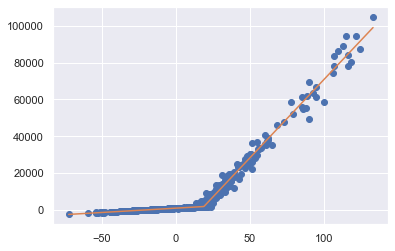

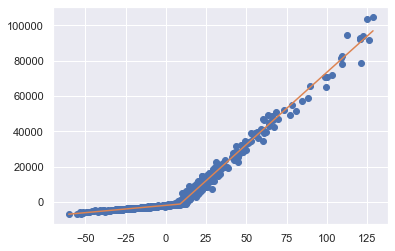

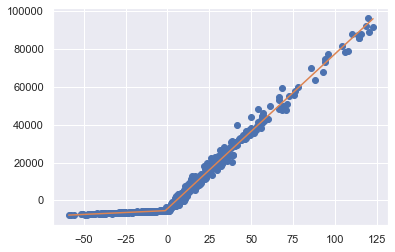

 45% (135 of 300) |#########             | Elapsed Time: 2:20:17 ETA:   2:56:04

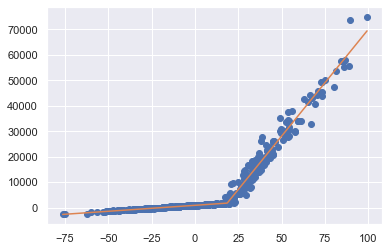

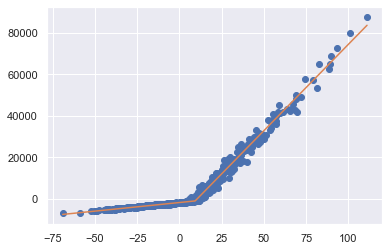

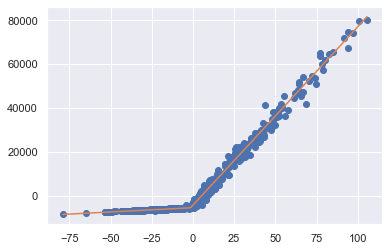

 45% (136 of 300) |#########             | Elapsed Time: 2:21:22 ETA:   2:57:16

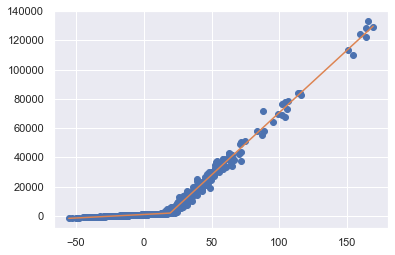

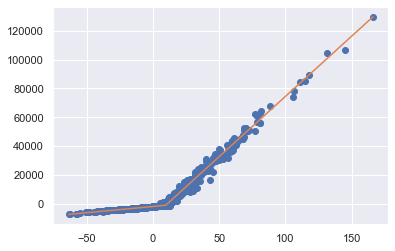

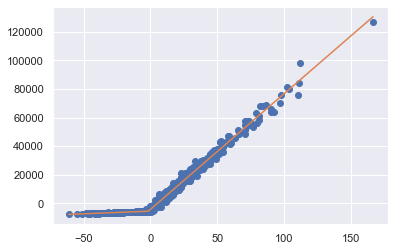

 45% (137 of 300) |##########            | Elapsed Time: 2:22:23 ETA:   2:47:30

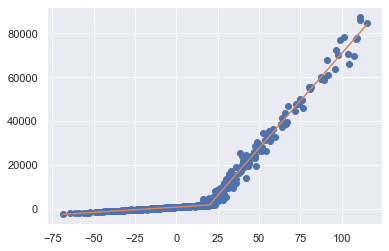

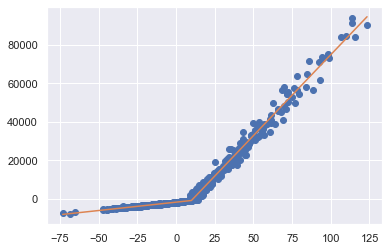

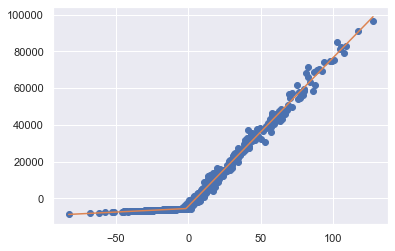

 46% (138 of 300) |##########            | Elapsed Time: 2:23:24 ETA:   2:44:55

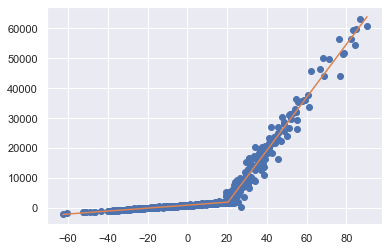

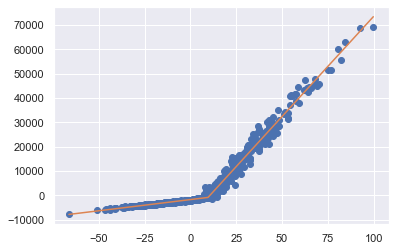

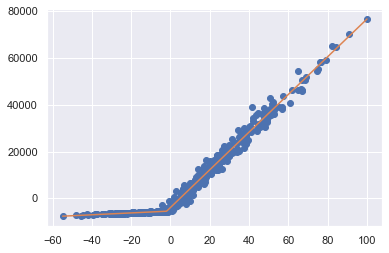

 46% (139 of 300) |##########            | Elapsed Time: 2:24:26 ETA:   2:45:58

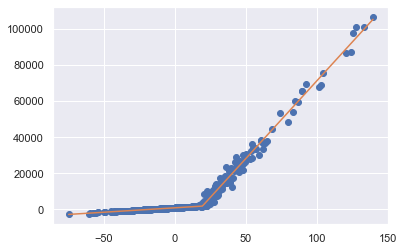

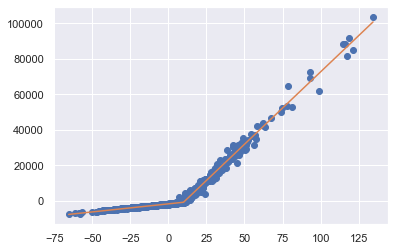

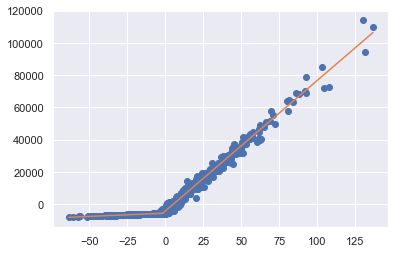

 46% (140 of 300) |##########            | Elapsed Time: 2:25:29 ETA:   2:45:55

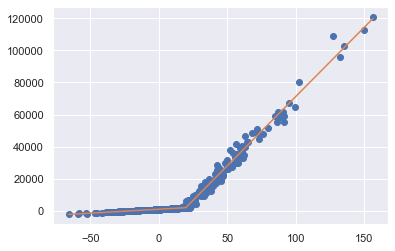

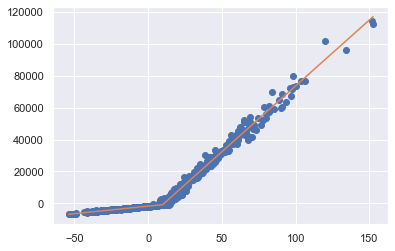

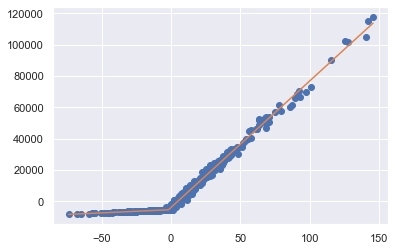

 47% (141 of 300) |##########            | Elapsed Time: 2:26:34 ETA:   2:53:27

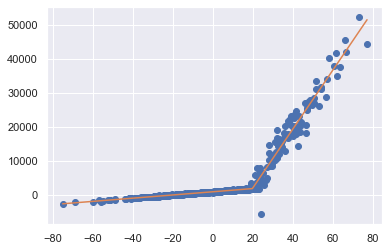

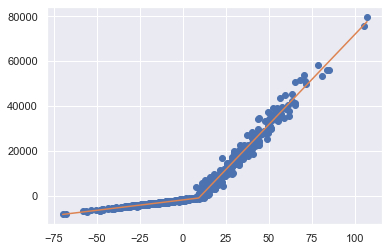

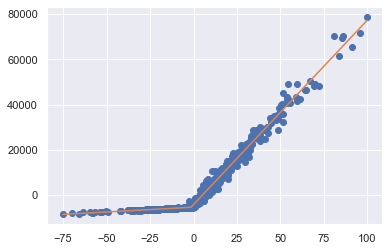

 47% (142 of 300) |##########            | Elapsed Time: 2:27:39 ETA:   2:51:30

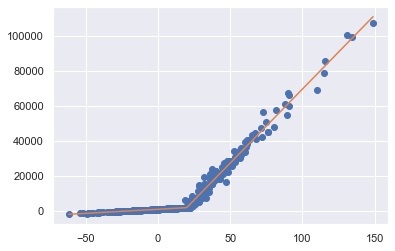

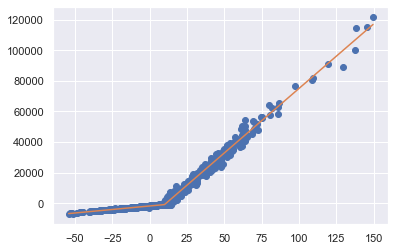

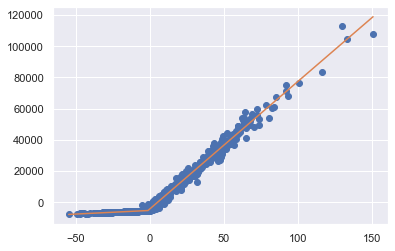

 47% (143 of 300) |##########            | Elapsed Time: 2:28:43 ETA:   2:45:59

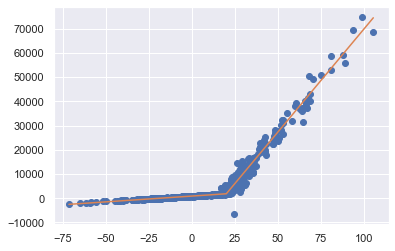

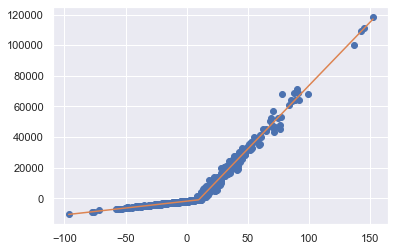

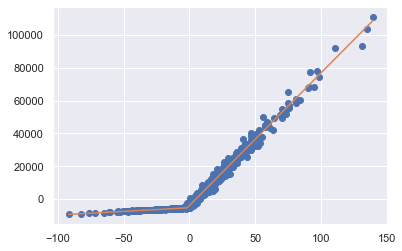

 48% (144 of 300) |##########            | Elapsed Time: 2:29:45 ETA:   2:41:33

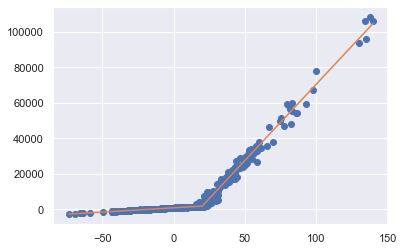

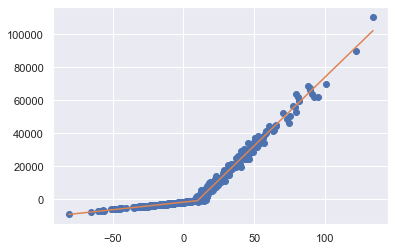

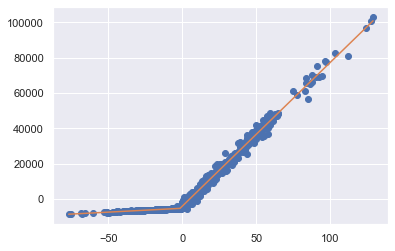

 48% (145 of 300) |##########            | Elapsed Time: 2:30:46 ETA:   2:39:30

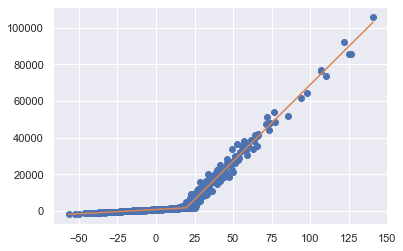

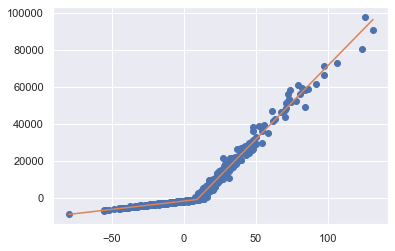

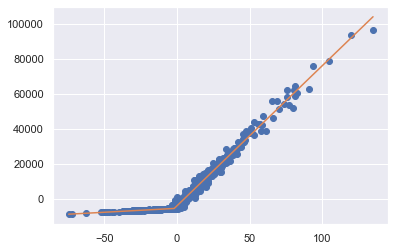

 48% (146 of 300) |##########            | Elapsed Time: 2:31:48 ETA:   2:36:54

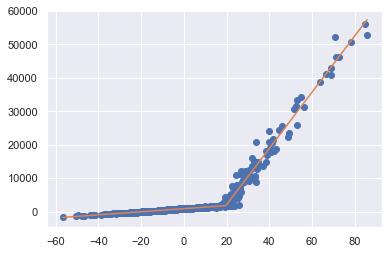

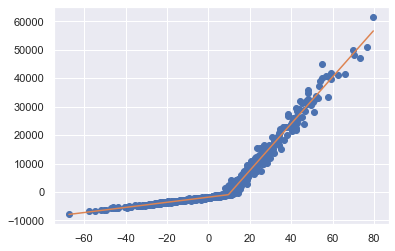

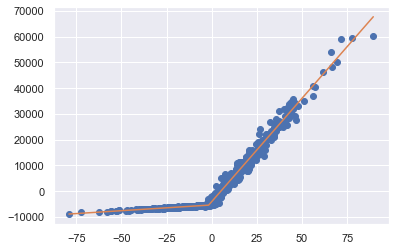

 49% (147 of 300) |##########            | Elapsed Time: 2:32:50 ETA:   2:38:41

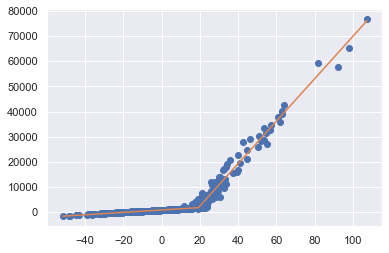

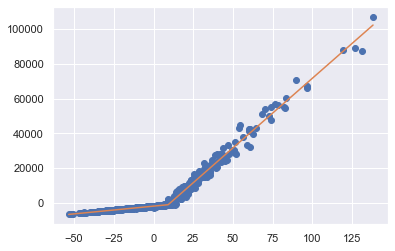

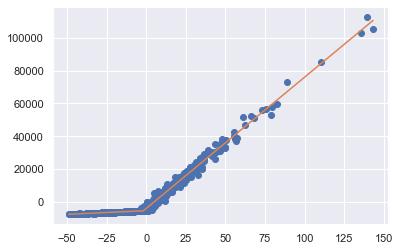

 49% (148 of 300) |##########            | Elapsed Time: 2:33:55 ETA:   2:45:29

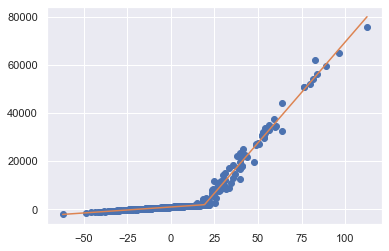

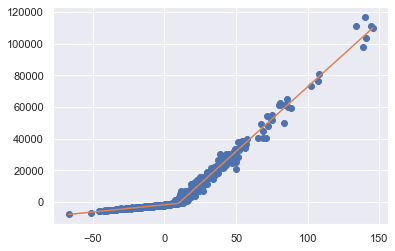

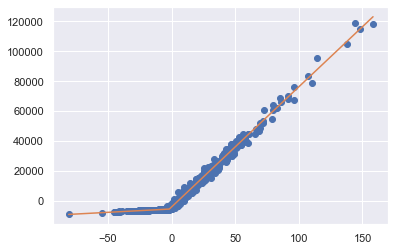

 49% (149 of 300) |##########            | Elapsed Time: 2:35:01 ETA:   2:45:09

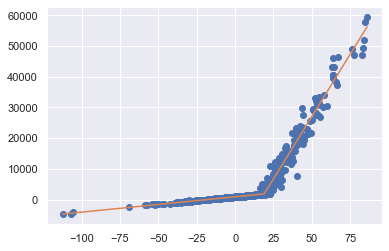

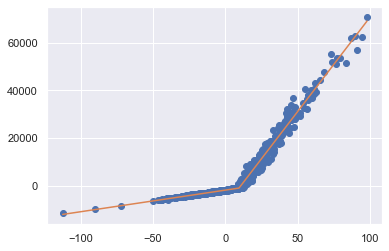

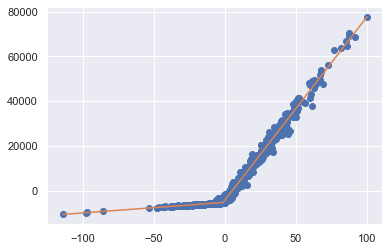

 50% (150 of 300) |###########           | Elapsed Time: 2:36:04 ETA:   2:37:07

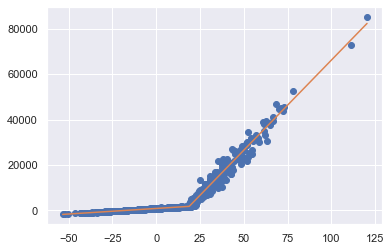

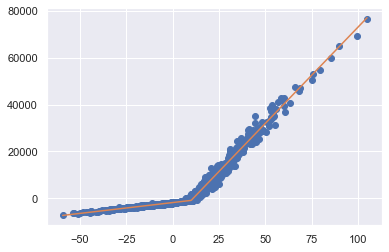

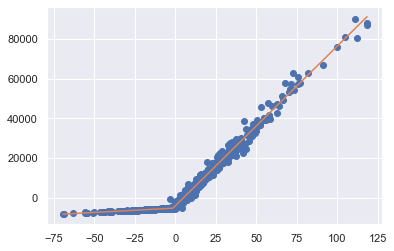

 50% (151 of 300) |###########           | Elapsed Time: 2:37:07 ETA:   2:37:34

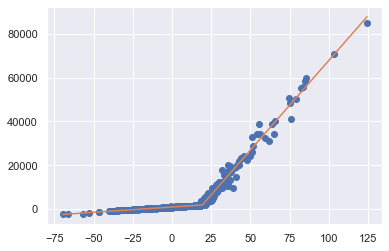

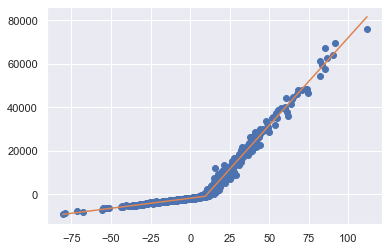

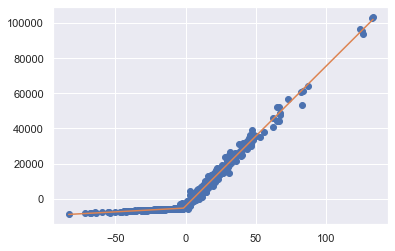

 50% (152 of 300) |###########           | Elapsed Time: 2:38:12 ETA:   2:40:03

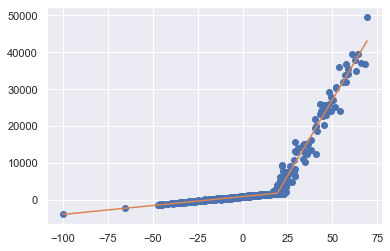

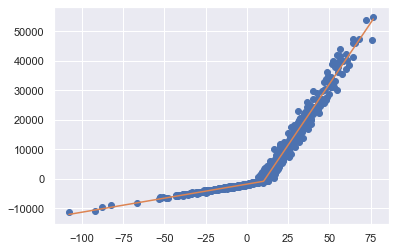

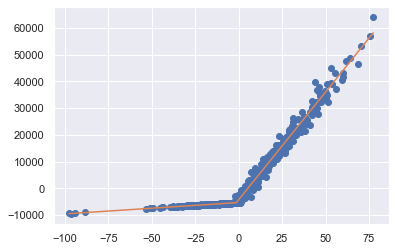

 51% (153 of 300) |###########           | Elapsed Time: 2:39:17 ETA:   2:39:31

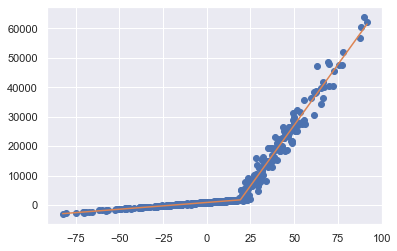

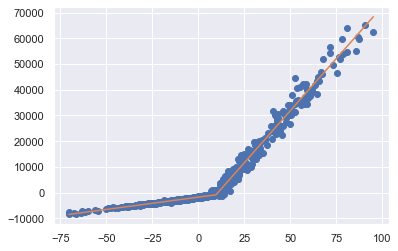

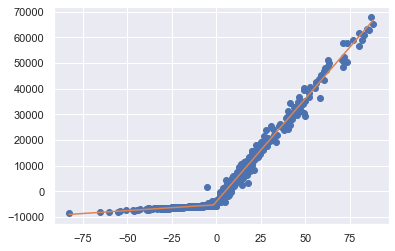

 51% (154 of 300) |###########           | Elapsed Time: 2:40:21 ETA:   2:34:29

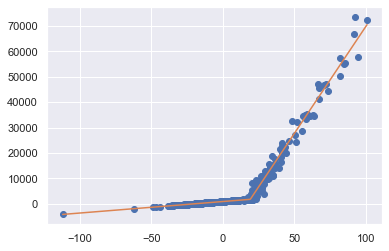

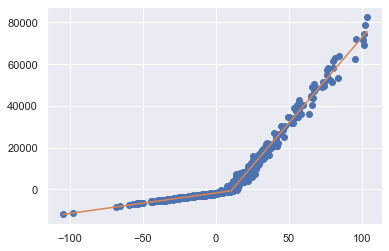

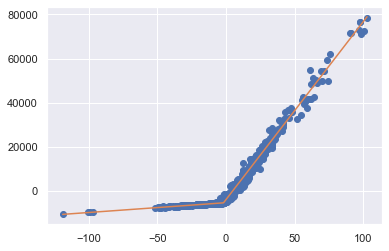

 51% (155 of 300) |###########           | Elapsed Time: 2:41:26 ETA:   2:39:09

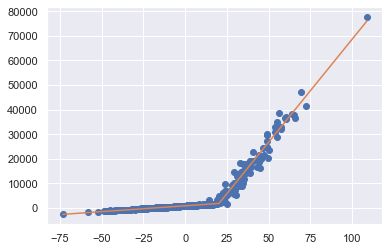

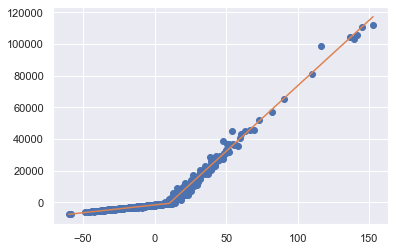

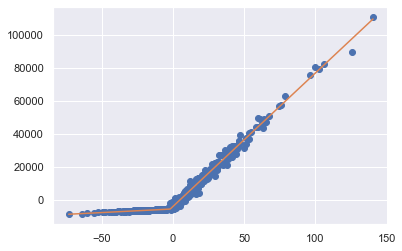

 52% (156 of 300) |###########           | Elapsed Time: 2:42:31 ETA:   2:35:44

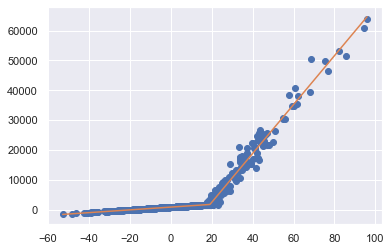

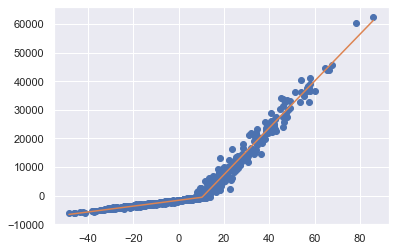

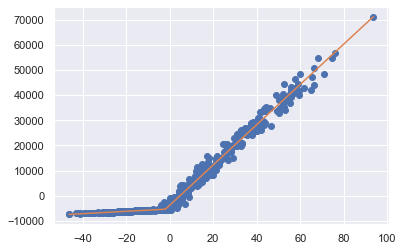

 52% (157 of 300) |###########           | Elapsed Time: 2:43:34 ETA:   2:29:23

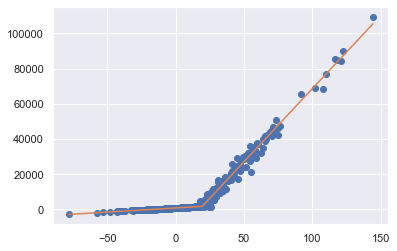

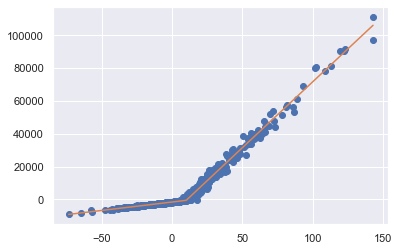

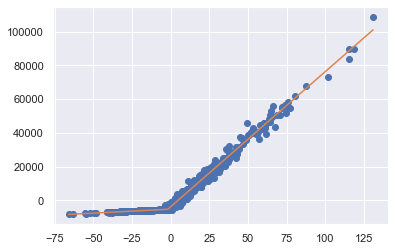

 52% (158 of 300) |###########           | Elapsed Time: 2:44:38 ETA:   2:30:46

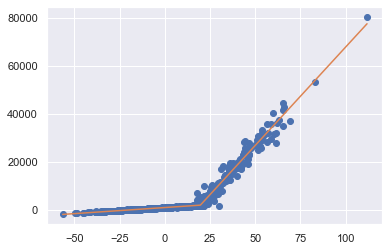

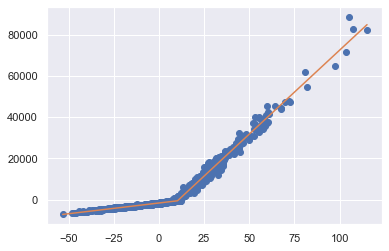

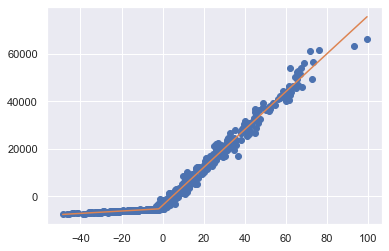

 53% (159 of 300) |###########           | Elapsed Time: 2:45:41 ETA:   2:29:39

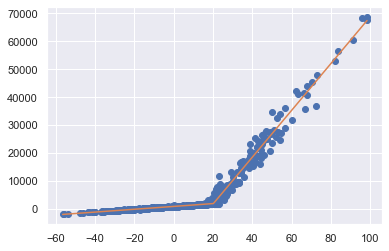

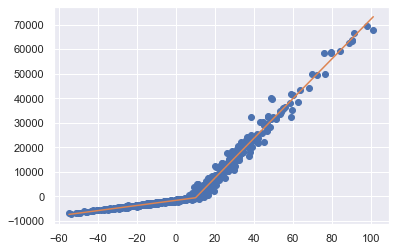

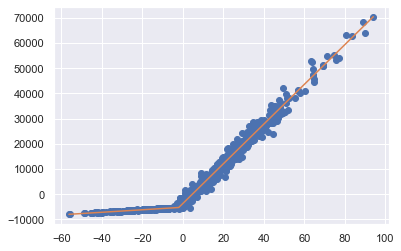

 53% (160 of 300) |###########           | Elapsed Time: 2:46:44 ETA:   2:26:50

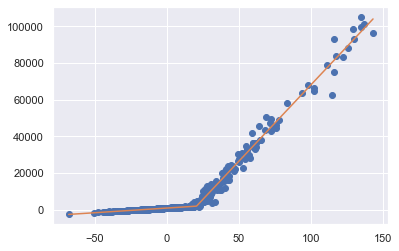

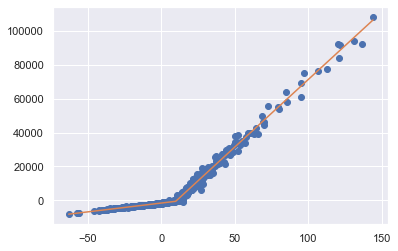

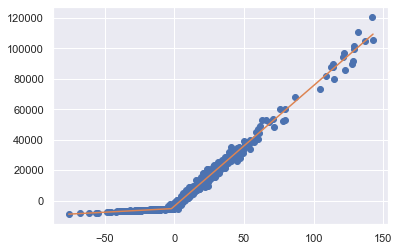

 53% (161 of 300) |###########           | Elapsed Time: 2:47:45 ETA:   2:21:12

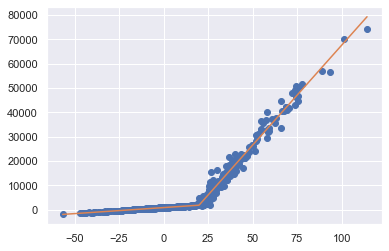

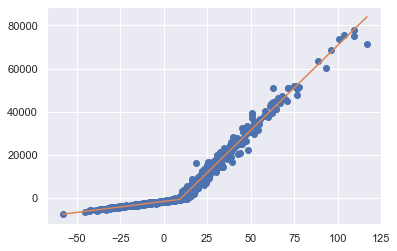

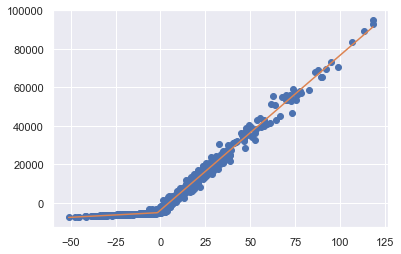

 54% (162 of 300) |###########           | Elapsed Time: 2:48:51 ETA:   2:30:41

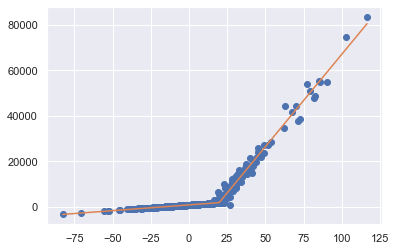

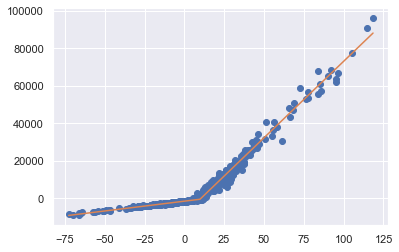

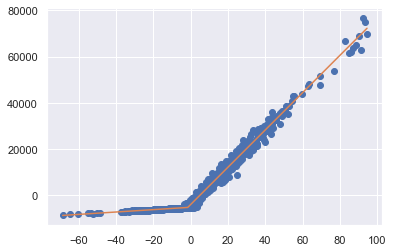

 54% (163 of 300) |###########           | Elapsed Time: 2:49:53 ETA:   2:22:13

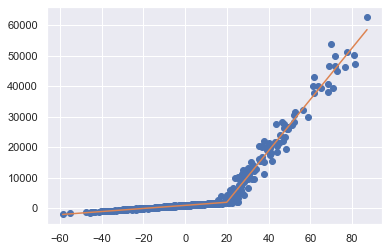

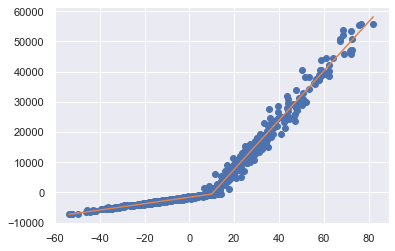

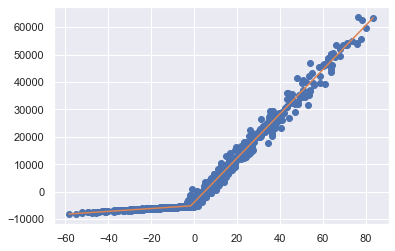

 54% (164 of 300) |############          | Elapsed Time: 2:50:56 ETA:   2:23:34

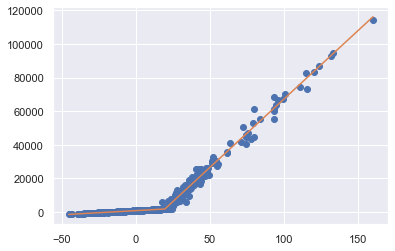

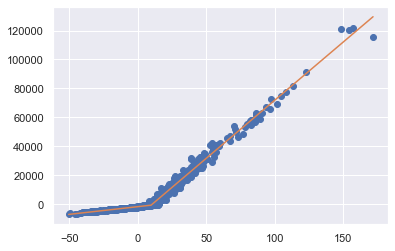

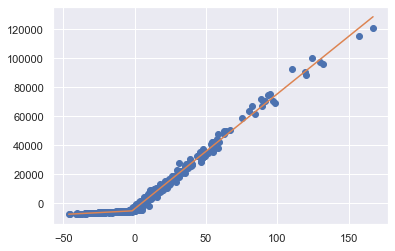

 55% (165 of 300) |############          | Elapsed Time: 2:52:03 ETA:   2:29:02

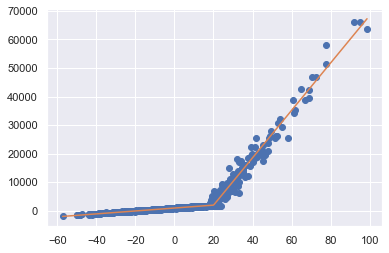

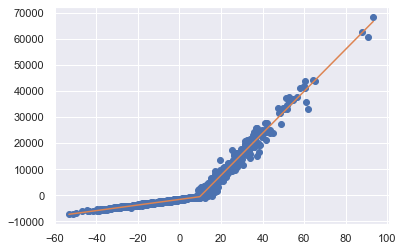

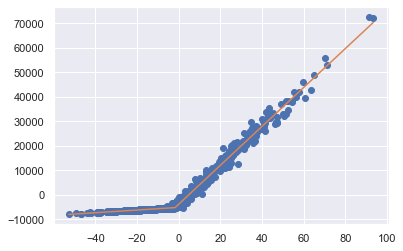

 55% (166 of 300) |############          | Elapsed Time: 2:53:06 ETA:   2:21:26

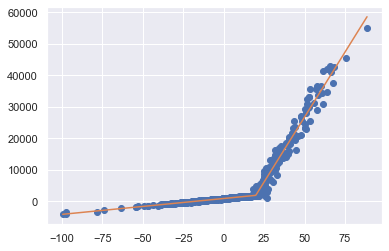

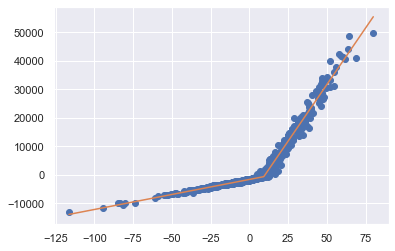

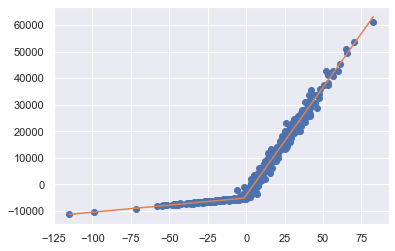

 55% (167 of 300) |############          | Elapsed Time: 2:54:10 ETA:   2:22:17

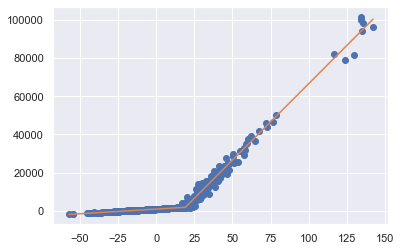

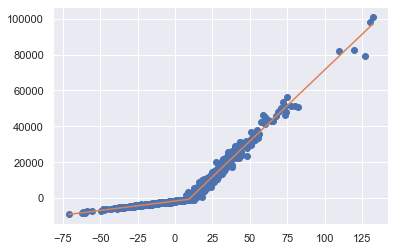

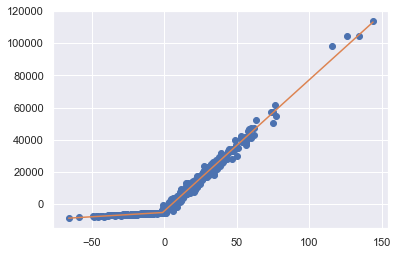

 56% (168 of 300) |############          | Elapsed Time: 2:55:14 ETA:   2:21:17

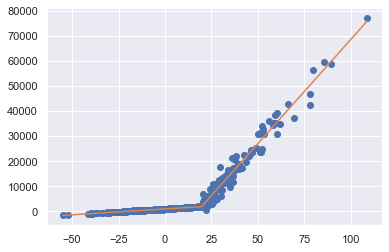

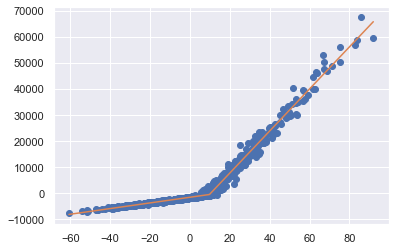

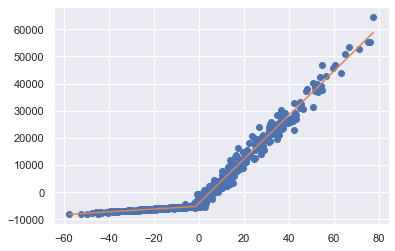

 56% (169 of 300) |############          | Elapsed Time: 2:56:22 ETA:   2:27:11

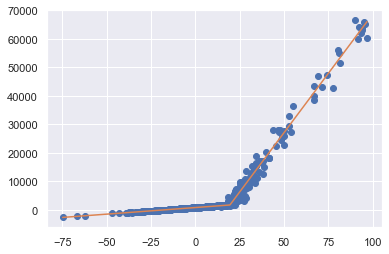

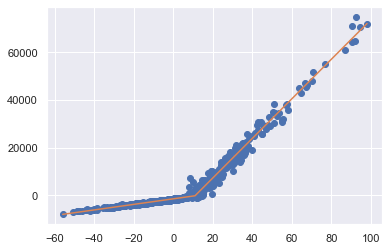

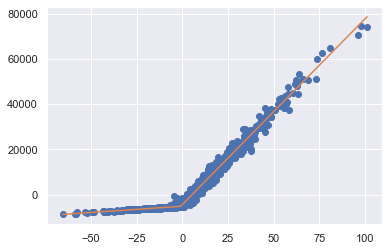

 56% (170 of 300) |############          | Elapsed Time: 2:57:26 ETA:   2:19:09

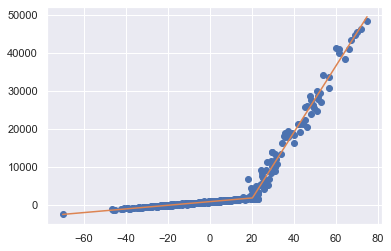

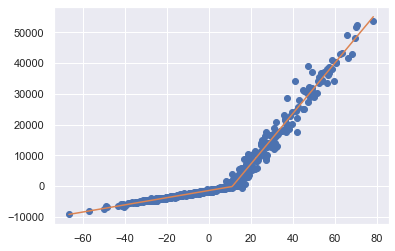

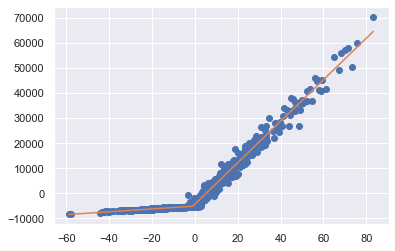

 57% (171 of 300) |############          | Elapsed Time: 2:58:30 ETA:   2:17:21

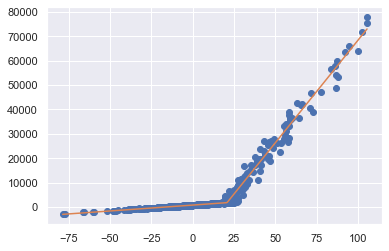

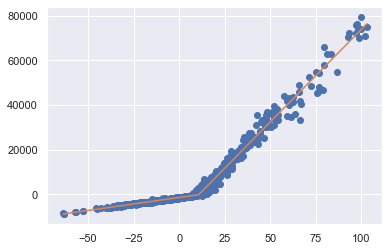

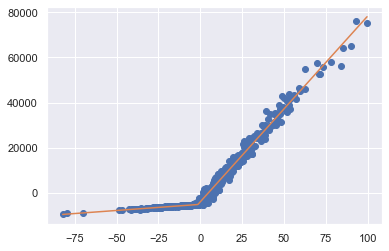

 57% (172 of 300) |############          | Elapsed Time: 2:59:35 ETA:   2:19:00

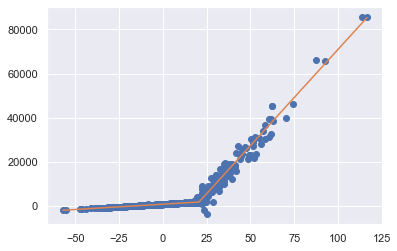

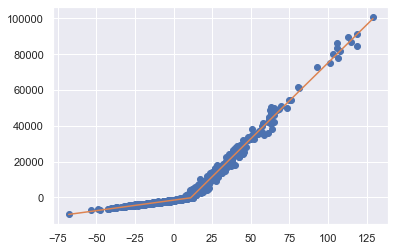

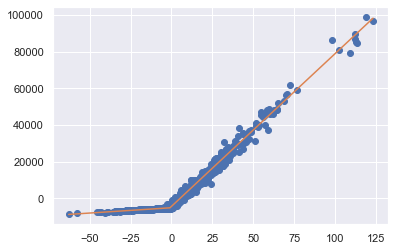

 57% (173 of 300) |############          | Elapsed Time: 3:00:38 ETA:   2:13:01

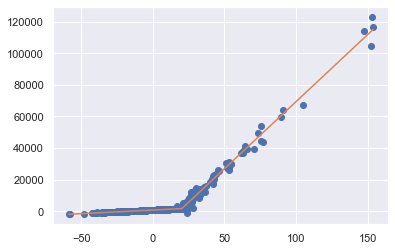

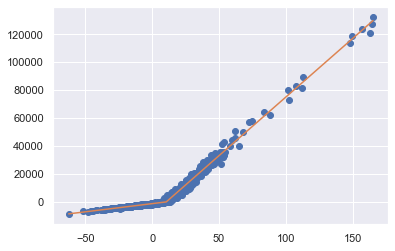

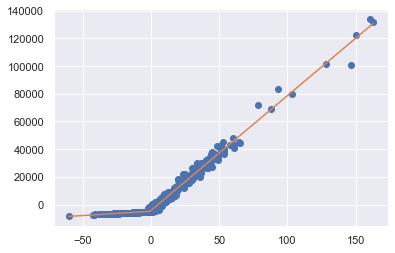

 58% (174 of 300) |############          | Elapsed Time: 3:01:43 ETA:   2:17:14

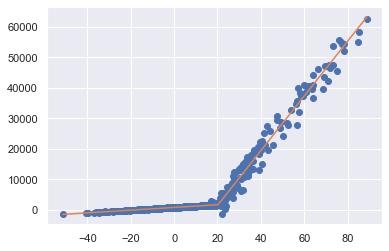

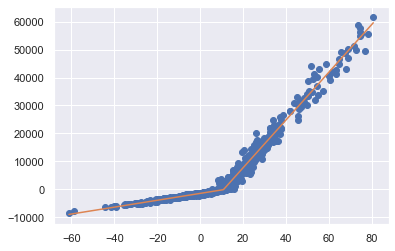

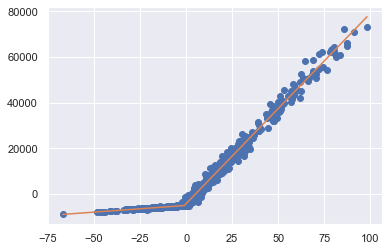

 58% (175 of 300) |############          | Elapsed Time: 3:02:46 ETA:   2:11:07

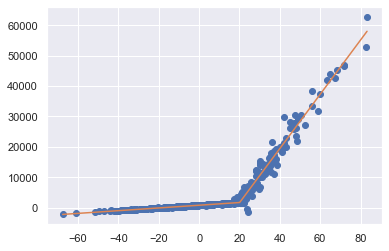

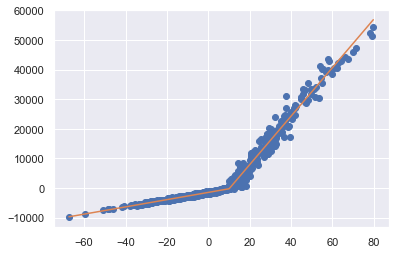

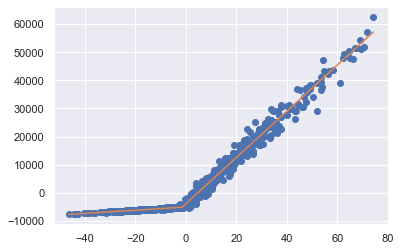

 58% (176 of 300) |############          | Elapsed Time: 3:03:51 ETA:   2:14:10

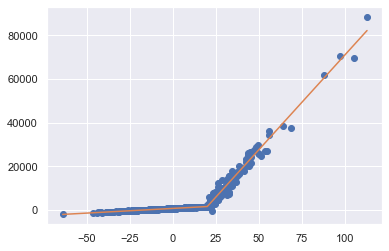

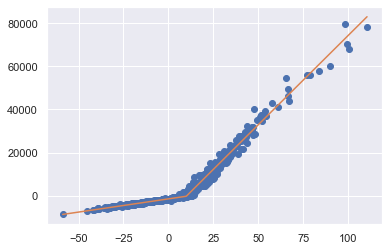

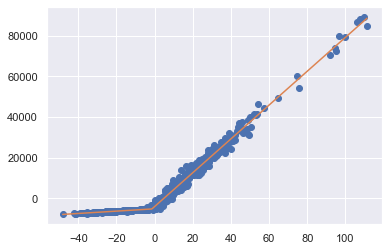

 59% (177 of 300) |############          | Elapsed Time: 3:04:53 ETA:   2:06:21

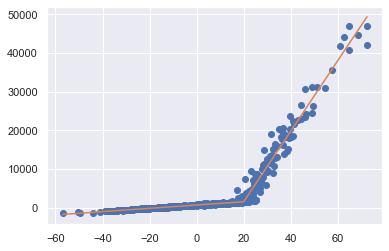

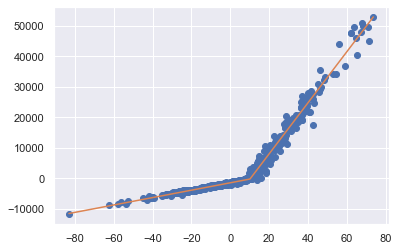

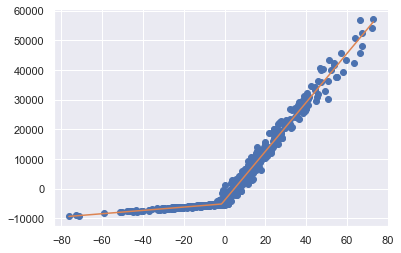

 59% (178 of 300) |#############         | Elapsed Time: 3:05:55 ETA:   2:06:32

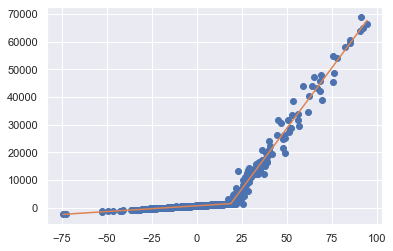

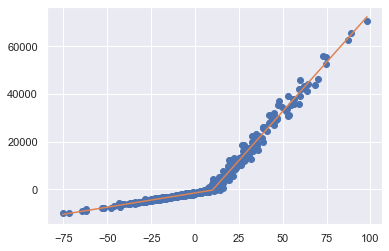

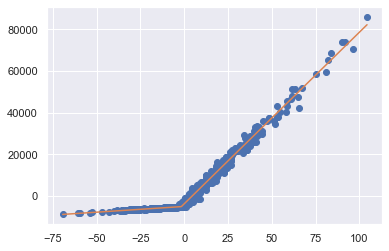

 59% (179 of 300) |#############         | Elapsed Time: 3:06:58 ETA:   2:06:37

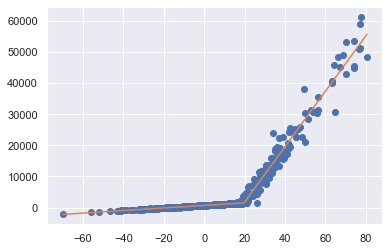

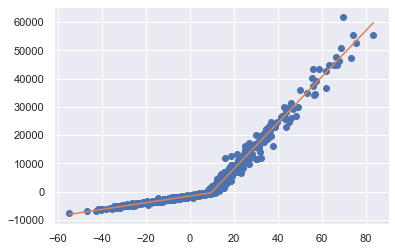

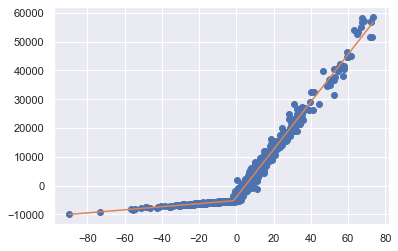

 60% (180 of 300) |#############         | Elapsed Time: 3:08:01 ETA:   2:05:56

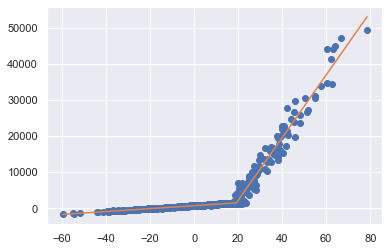

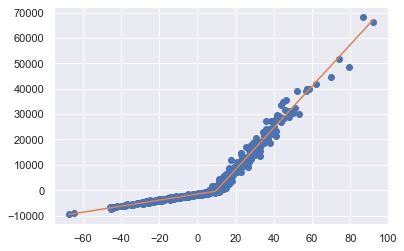

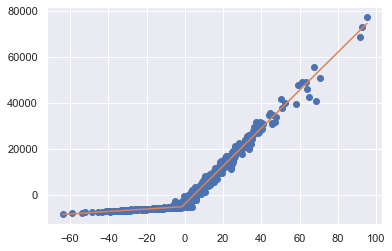

 60% (181 of 300) |#############         | Elapsed Time: 3:09:03 ETA:   2:02:45

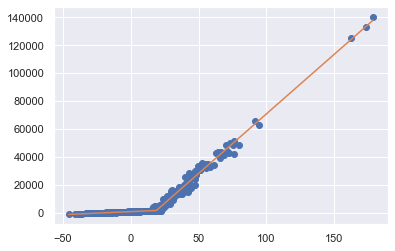

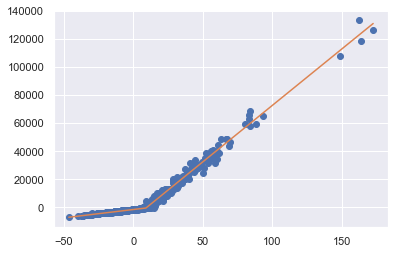

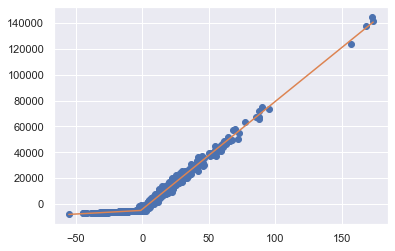

 60% (182 of 300) |#############         | Elapsed Time: 3:10:05 ETA:   2:01:54

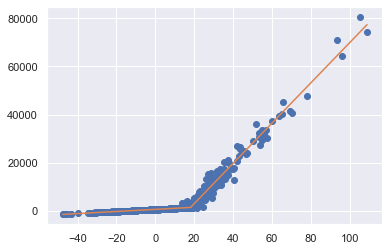

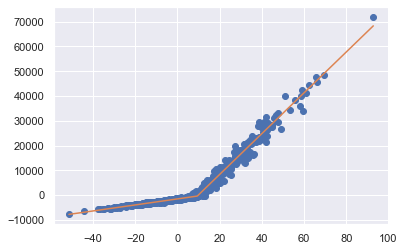

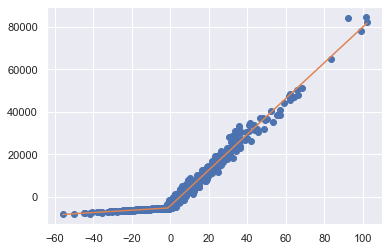

 61% (183 of 300) |#############         | Elapsed Time: 3:11:06 ETA:   1:58:46

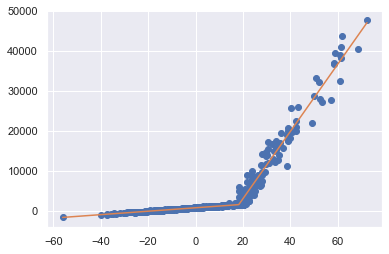

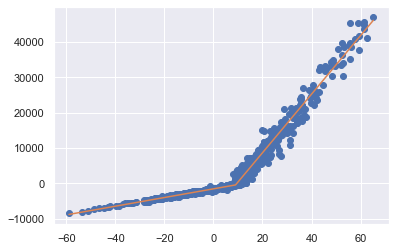

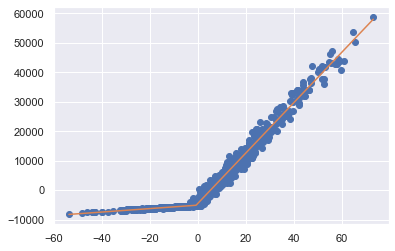

 61% (184 of 300) |#############         | Elapsed Time: 3:12:11 ETA:   2:06:49

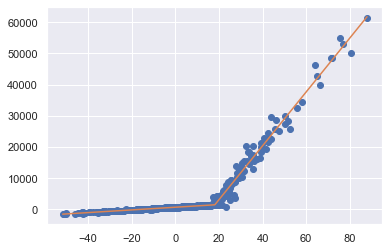

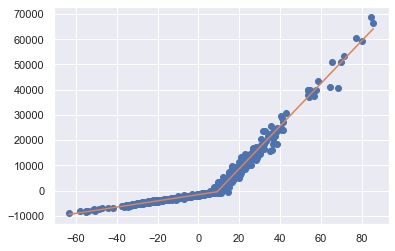

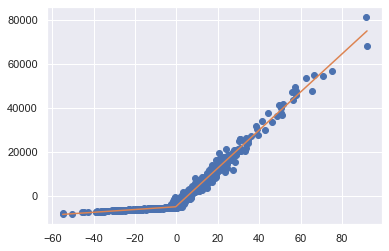

 61% (185 of 300) |#############         | Elapsed Time: 3:13:13 ETA:   1:58:58

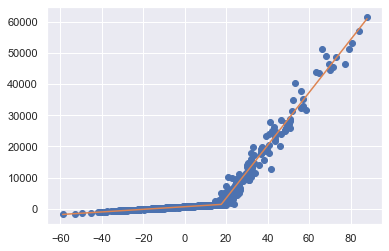

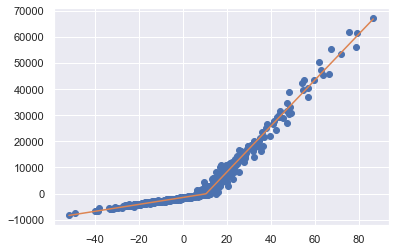

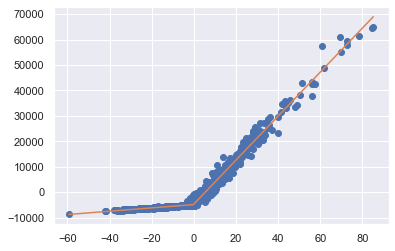

 62% (186 of 300) |#############         | Elapsed Time: 3:14:12 ETA:   1:52:27

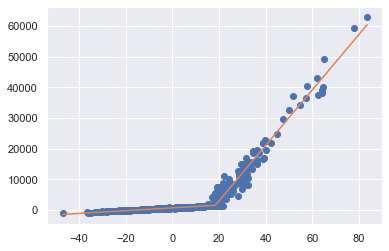

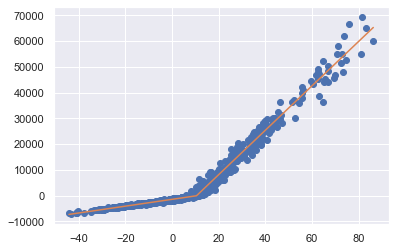

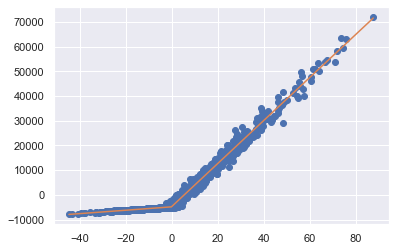

 62% (187 of 300) |#############         | Elapsed Time: 3:15:16 ETA:   2:00:28

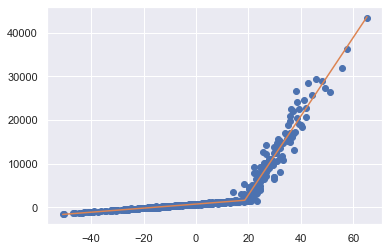

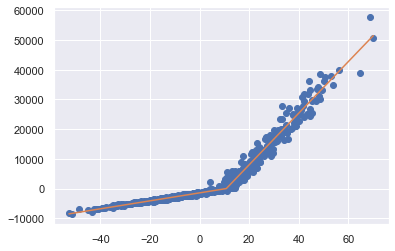

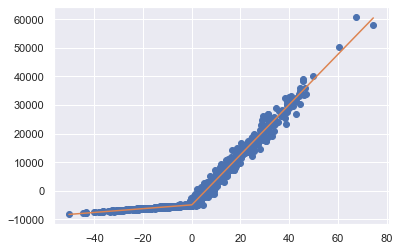

 62% (188 of 300) |#############         | Elapsed Time: 3:16:20 ETA:   1:58:57

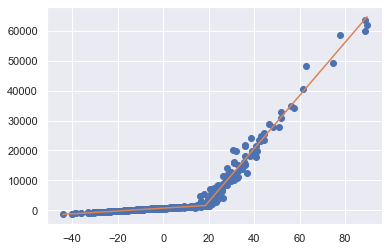

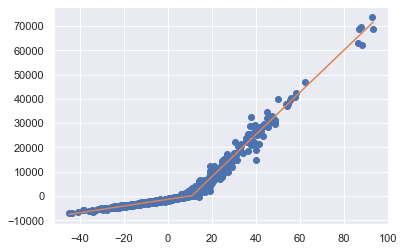

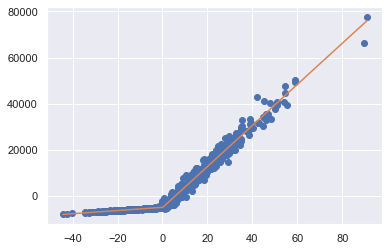

 63% (189 of 300) |#############         | Elapsed Time: 3:17:25 ETA:   2:00:54

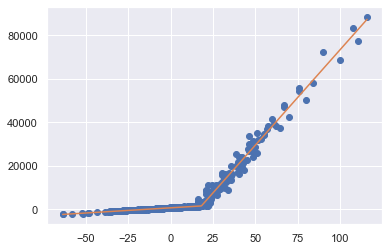

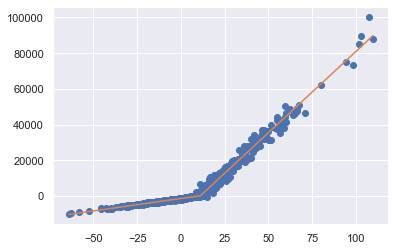

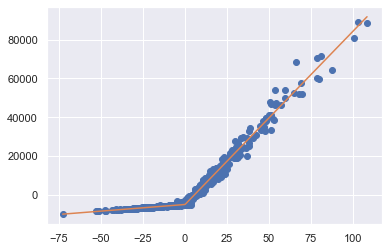

 63% (190 of 300) |#############         | Elapsed Time: 3:18:28 ETA:   1:54:32

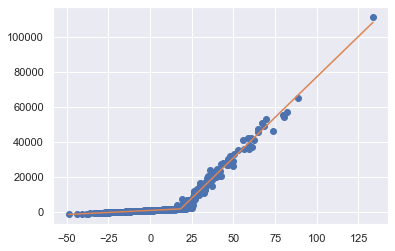

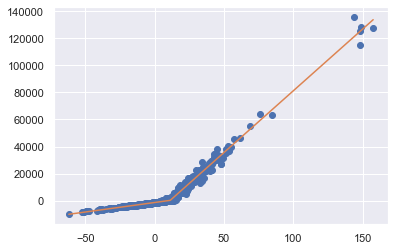

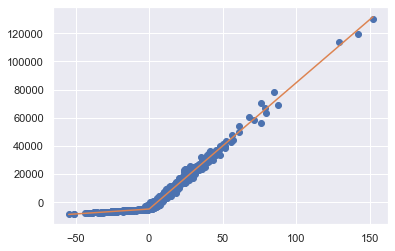

 63% (191 of 300) |##############        | Elapsed Time: 3:19:31 ETA:   1:55:27

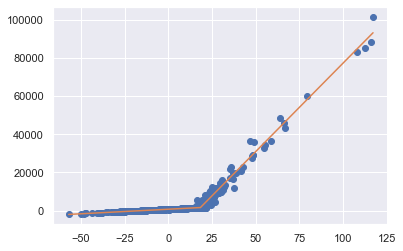

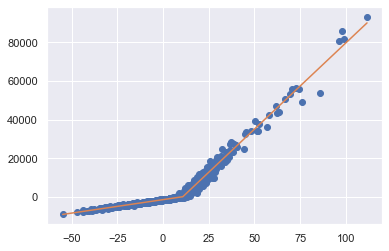

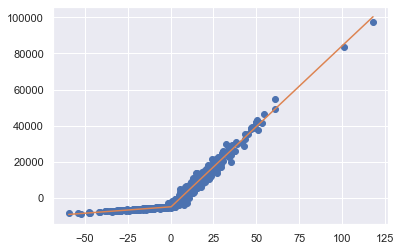

 64% (192 of 300) |##############        | Elapsed Time: 3:20:34 ETA:   1:52:53

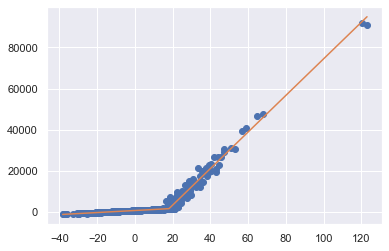

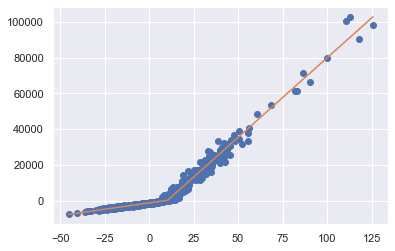

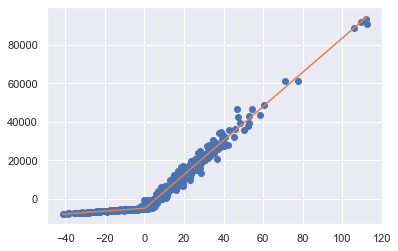

 64% (193 of 300) |##############        | Elapsed Time: 3:21:39 ETA:   1:56:10

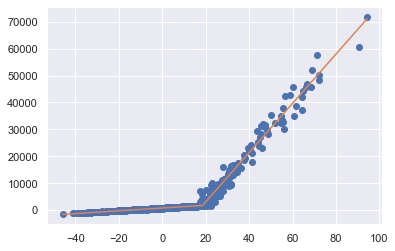

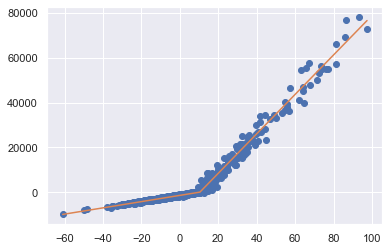

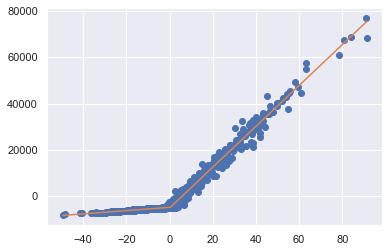

 64% (194 of 300) |##############        | Elapsed Time: 3:22:40 ETA:   1:47:25

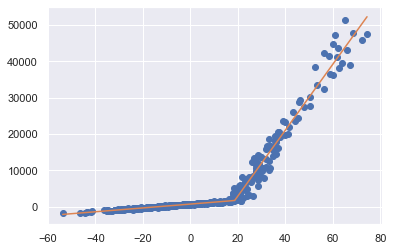

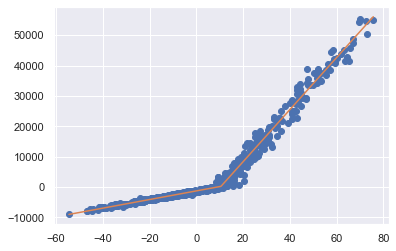

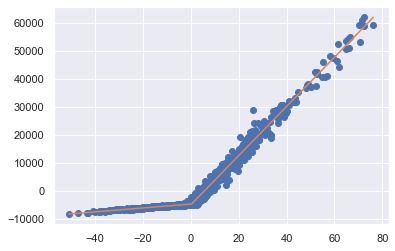

 65% (195 of 300) |##############        | Elapsed Time: 3:23:45 ETA:   1:52:37

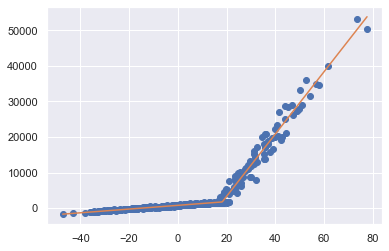

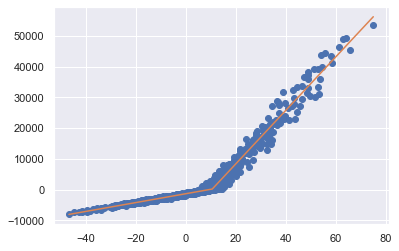

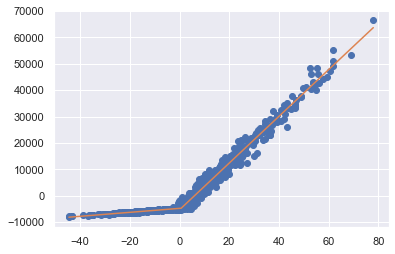

 65% (196 of 300) |##############        | Elapsed Time: 3:24:50 ETA:   1:52:56

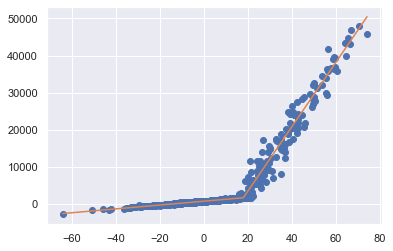

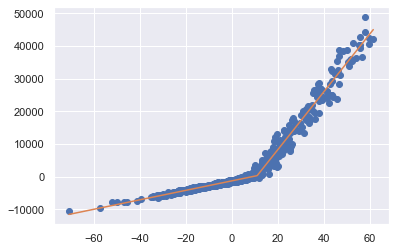

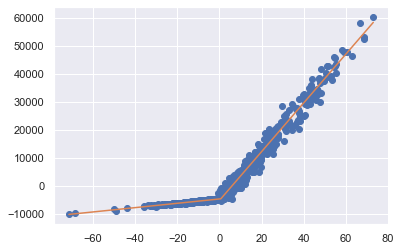

 65% (197 of 300) |##############        | Elapsed Time: 3:25:53 ETA:   1:47:58

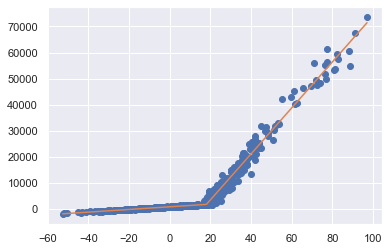

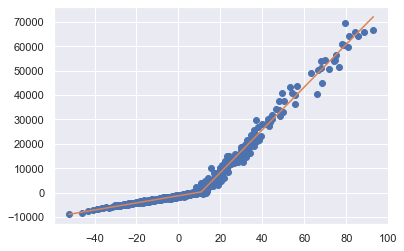

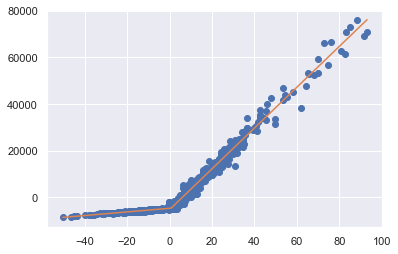

 66% (198 of 300) |##############        | Elapsed Time: 3:26:53 ETA:   1:42:51

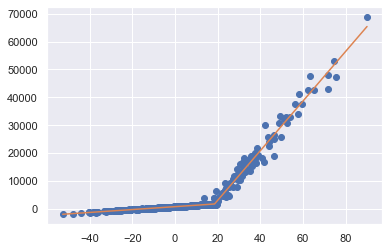

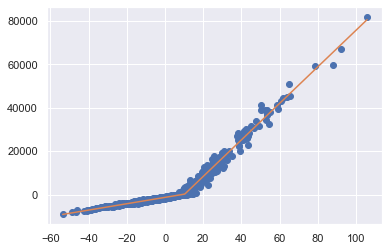

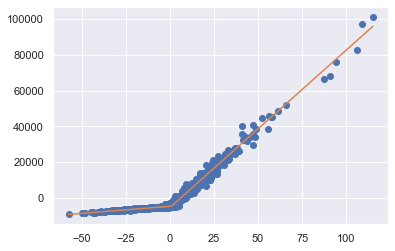

 66% (199 of 300) |##############        | Elapsed Time: 3:27:57 ETA:   1:47:10

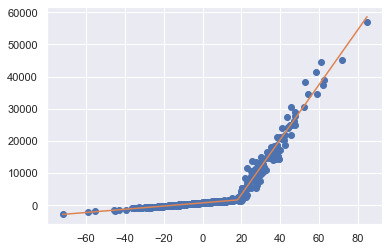

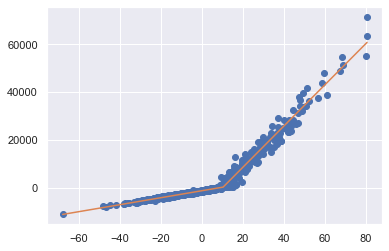

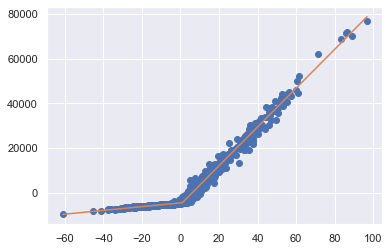

 66% (200 of 300) |##############        | Elapsed Time: 3:29:00 ETA:   1:45:55

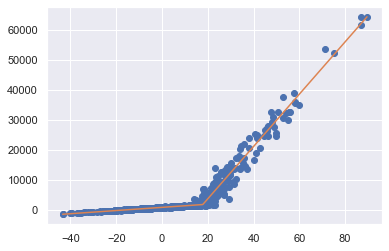

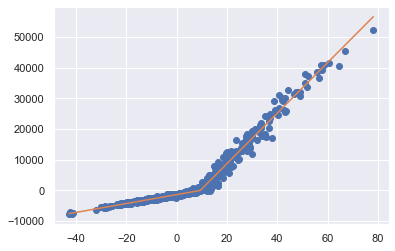

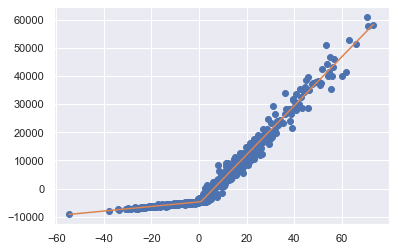

 67% (201 of 300) |##############        | Elapsed Time: 3:30:01 ETA:   1:40:42

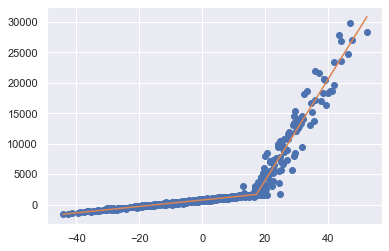

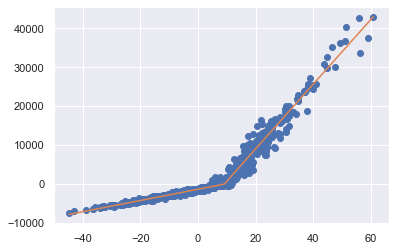

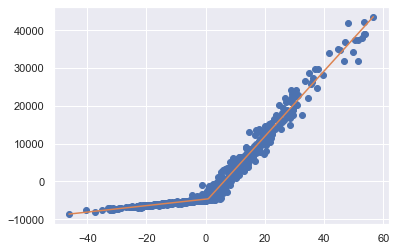

 67% (202 of 300) |##############        | Elapsed Time: 3:31:05 ETA:   1:44:04

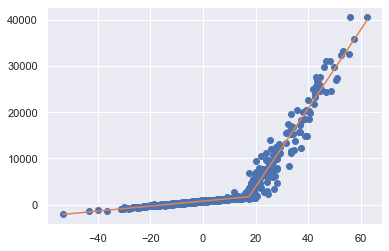

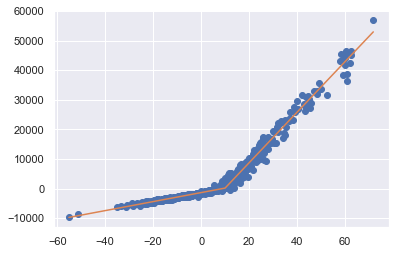

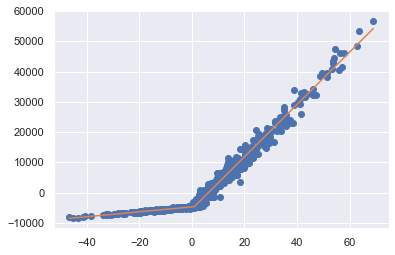

 67% (203 of 300) |##############        | Elapsed Time: 3:32:07 ETA:   1:40:06

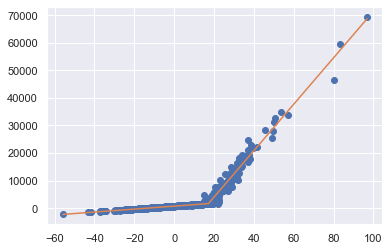

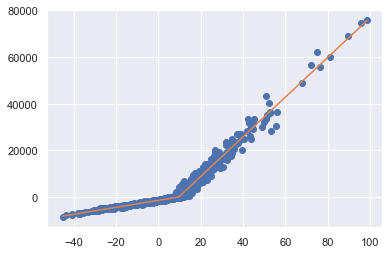

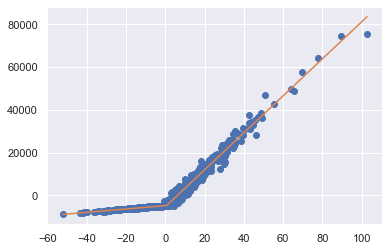

 68% (204 of 300) |##############        | Elapsed Time: 3:33:11 ETA:   1:42:56

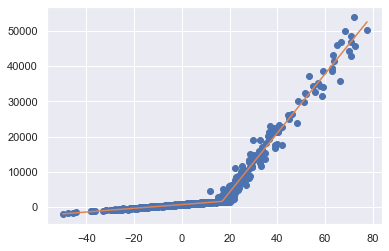

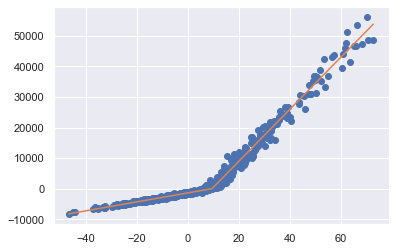

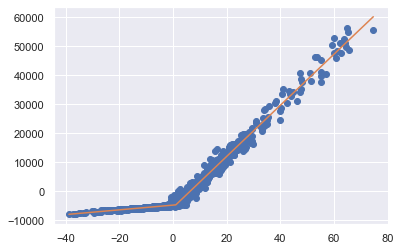

 68% (205 of 300) |###############       | Elapsed Time: 3:34:14 ETA:   1:39:04

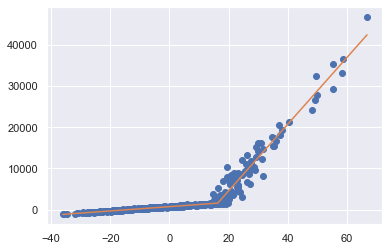

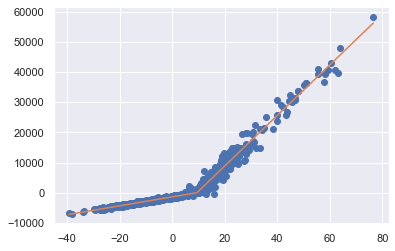

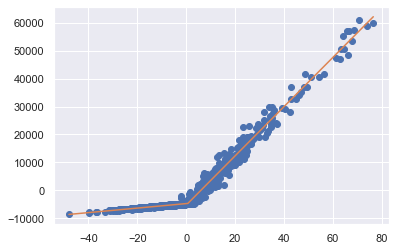

 68% (206 of 300) |###############       | Elapsed Time: 3:35:17 ETA:   1:39:31

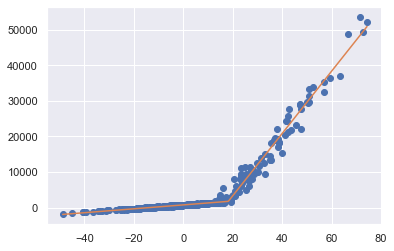

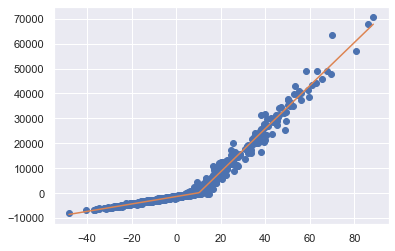

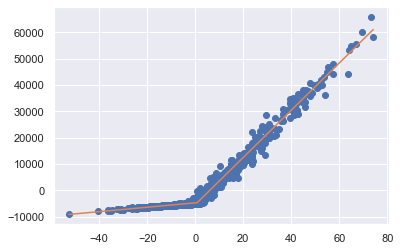

 69% (207 of 300) |###############       | Elapsed Time: 3:36:24 ETA:   1:42:43

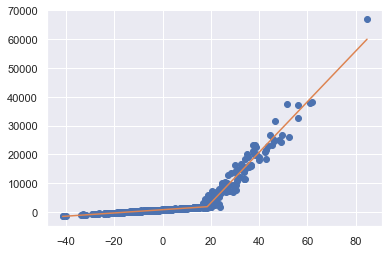

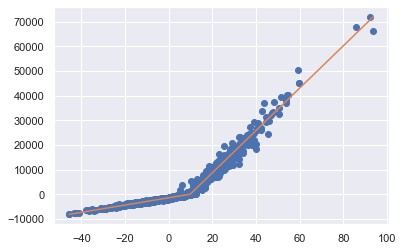

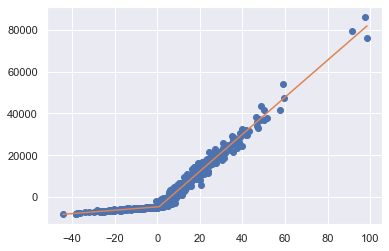

 69% (208 of 300) |###############       | Elapsed Time: 3:37:28 ETA:   1:39:11

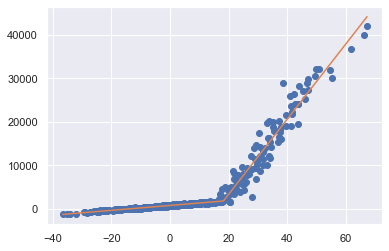

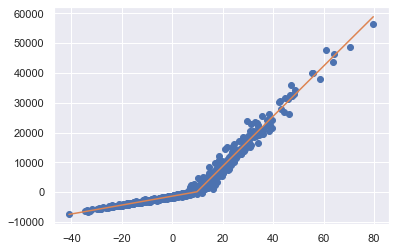

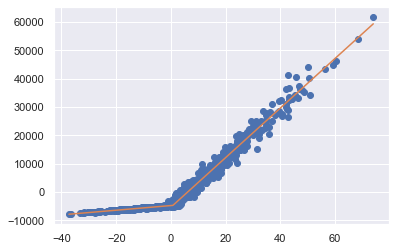

 69% (209 of 300) |###############       | Elapsed Time: 3:38:32 ETA:   1:36:44

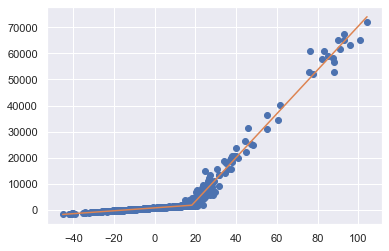

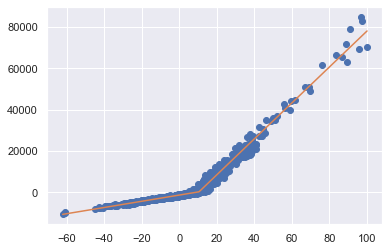

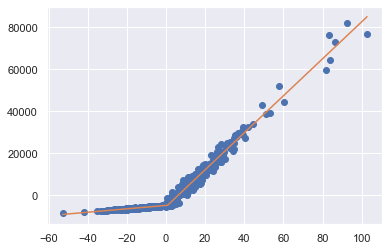

 70% (210 of 300) |###############       | Elapsed Time: 3:39:40 ETA:   1:41:02

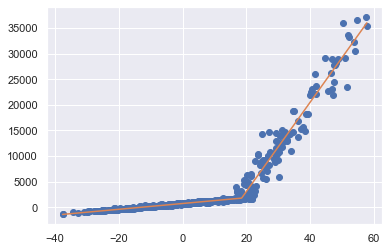

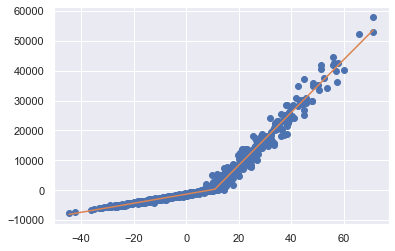

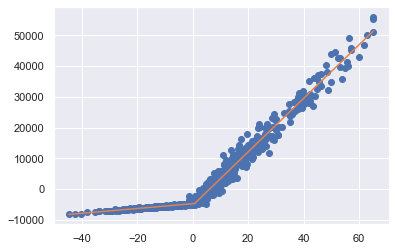

 70% (211 of 300) |###############       | Elapsed Time: 3:40:44 ETA:   1:36:17

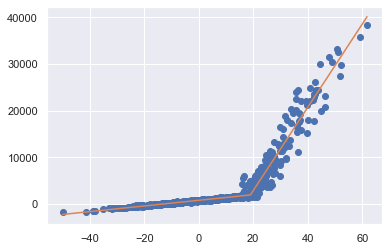

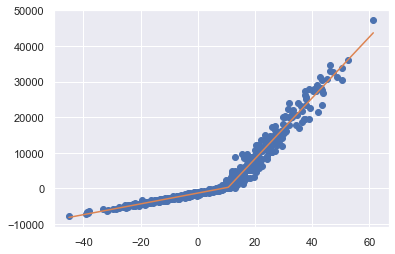

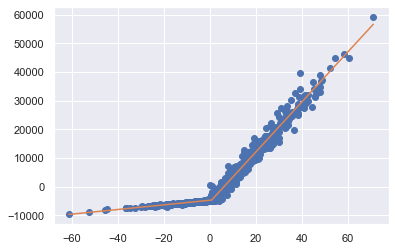

 70% (212 of 300) |###############       | Elapsed Time: 3:41:45 ETA:   1:29:06

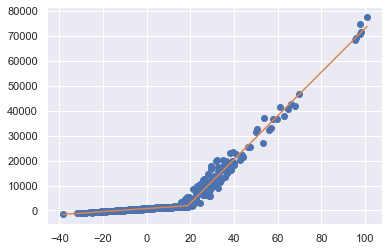

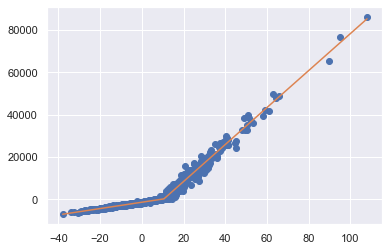

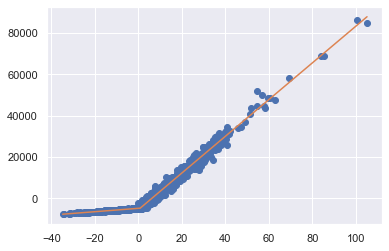

 71% (213 of 300) |###############       | Elapsed Time: 3:42:46 ETA:   1:28:08

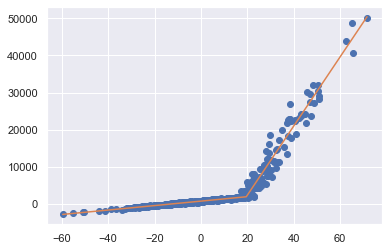

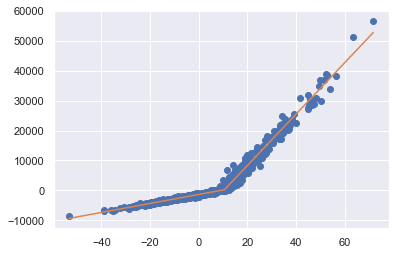

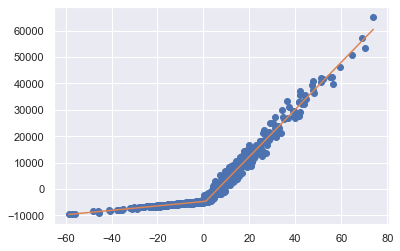

 71% (214 of 300) |###############       | Elapsed Time: 3:43:49 ETA:   1:29:47

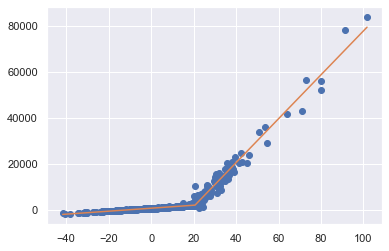

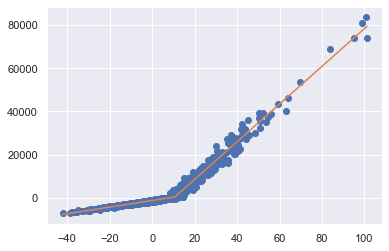

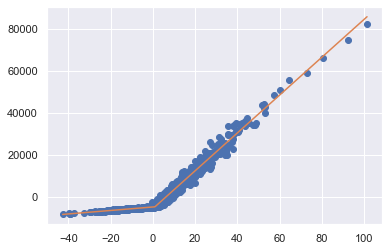

 71% (215 of 300) |###############       | Elapsed Time: 3:44:54 ETA:   1:32:44

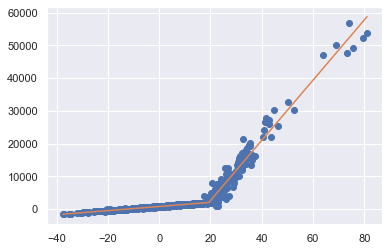

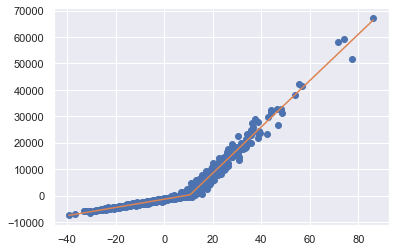

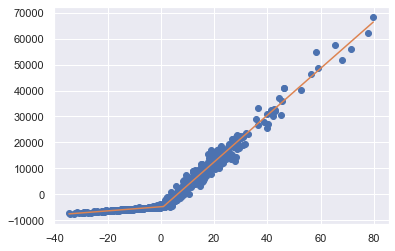

 72% (216 of 300) |###############       | Elapsed Time: 3:45:57 ETA:   1:28:37

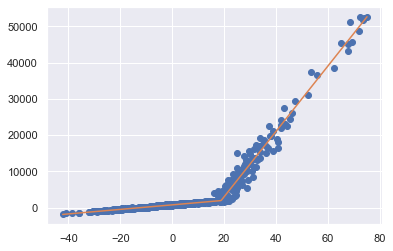

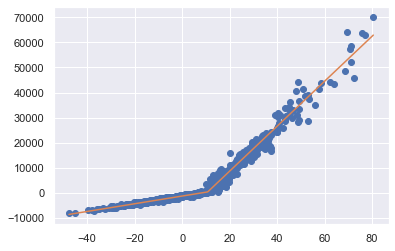

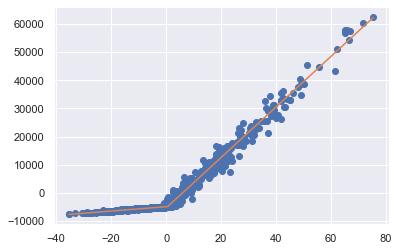

 72% (217 of 300) |###############       | Elapsed Time: 3:47:02 ETA:   1:28:47

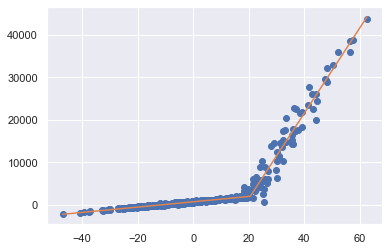

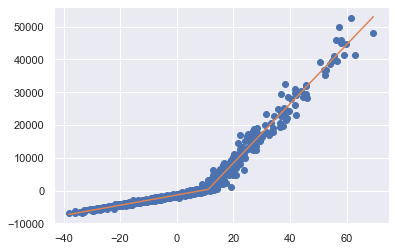

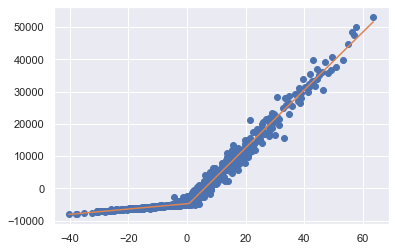

 72% (218 of 300) |###############       | Elapsed Time: 3:48:06 ETA:   1:27:36

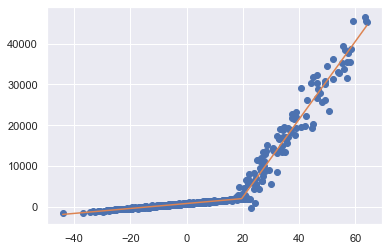

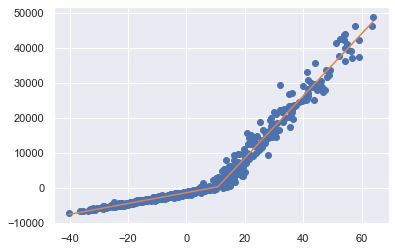

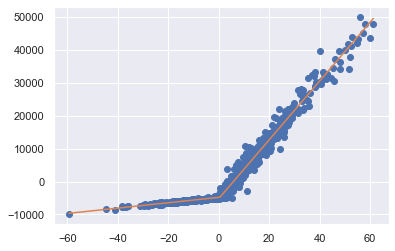

 73% (219 of 300) |################      | Elapsed Time: 3:49:09 ETA:   1:25:47

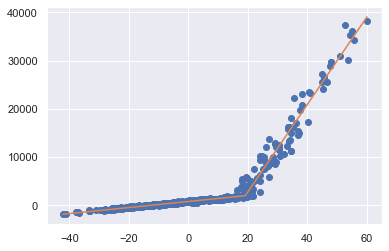

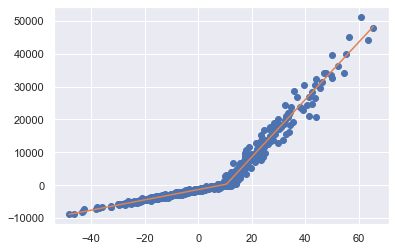

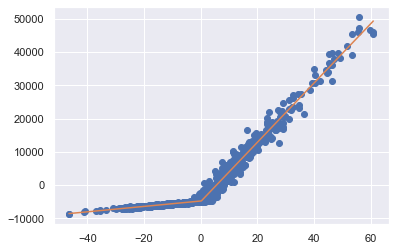

 73% (220 of 300) |################      | Elapsed Time: 3:50:12 ETA:   1:23:22

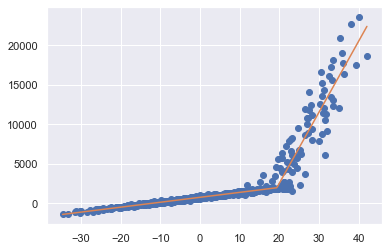

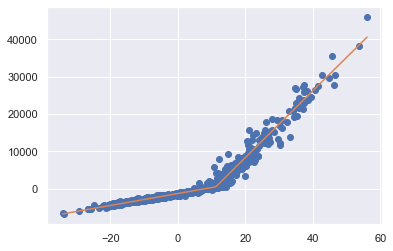

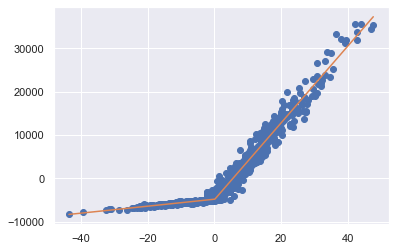

 73% (221 of 300) |################      | Elapsed Time: 3:51:15 ETA:   1:22:41

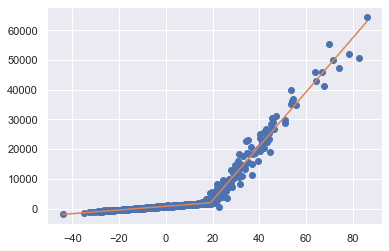

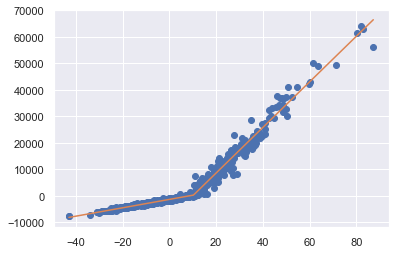

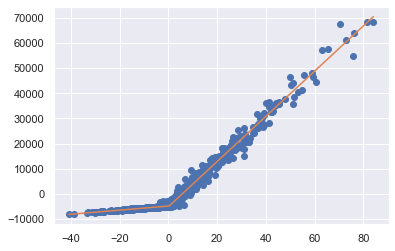

 74% (222 of 300) |################      | Elapsed Time: 3:52:19 ETA:   1:23:39

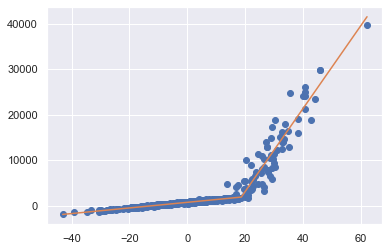

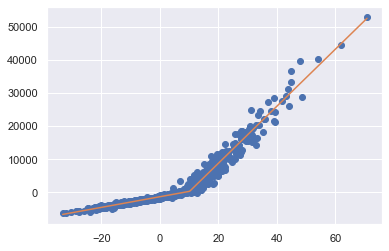

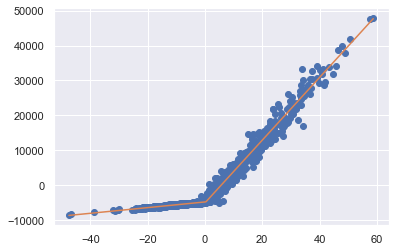

 74% (223 of 300) |################      | Elapsed Time: 3:53:23 ETA:   1:22:33

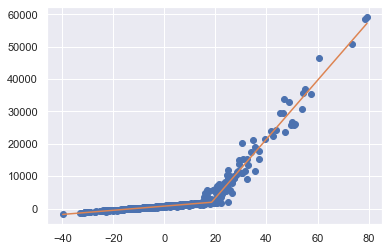

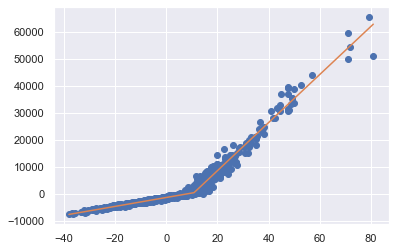

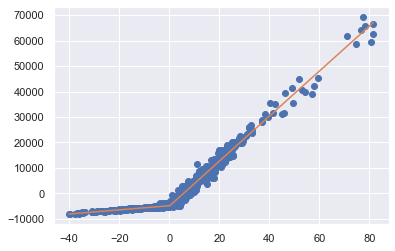

 74% (224 of 300) |################      | Elapsed Time: 3:54:27 ETA:   1:21:19

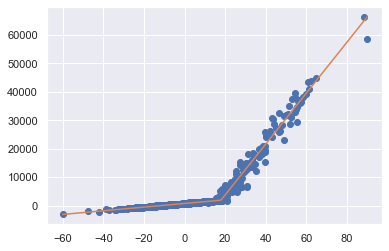

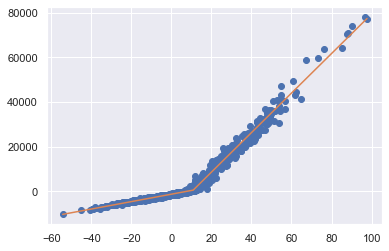

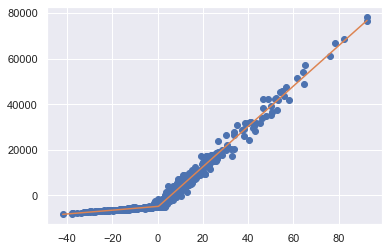

 75% (225 of 300) |################      | Elapsed Time: 3:55:31 ETA:   1:19:47

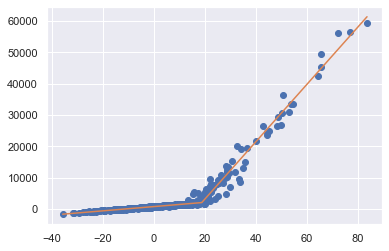

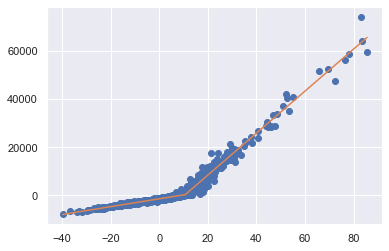

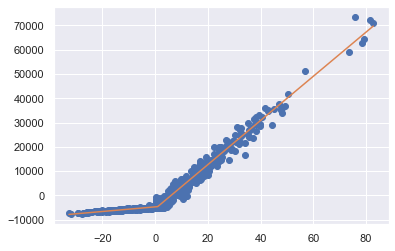

 75% (226 of 300) |################      | Elapsed Time: 3:56:36 ETA:   1:20:22

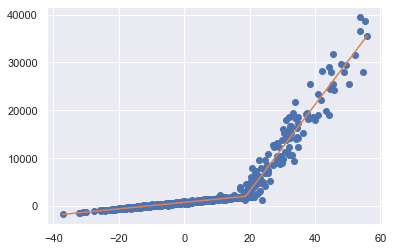

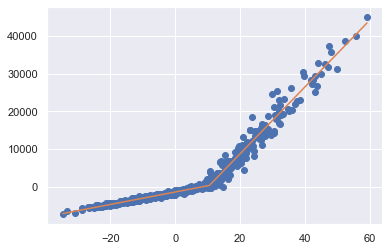

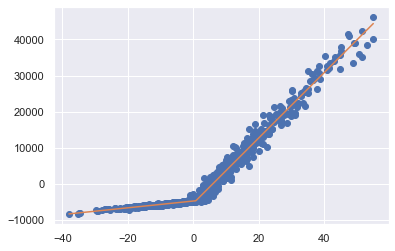

 75% (227 of 300) |################      | Elapsed Time: 3:57:38 ETA:   1:14:51

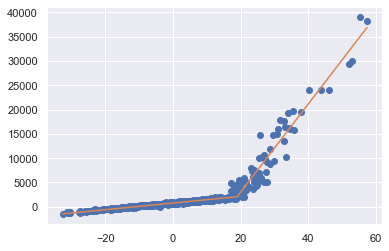

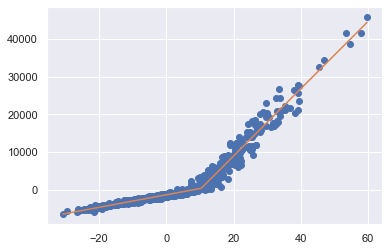

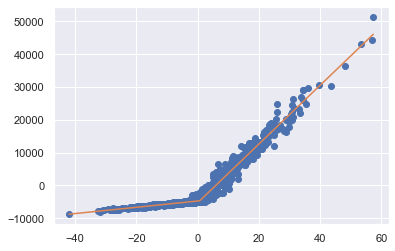

 76% (228 of 300) |################      | Elapsed Time: 3:58:42 ETA:   1:17:08

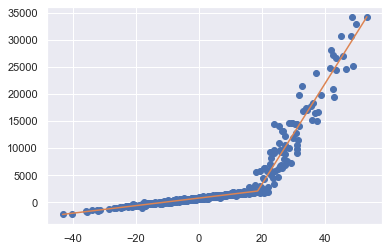

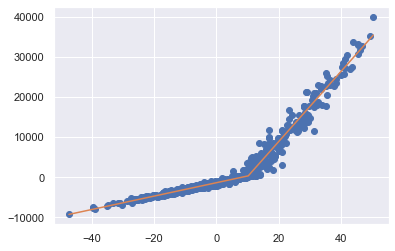

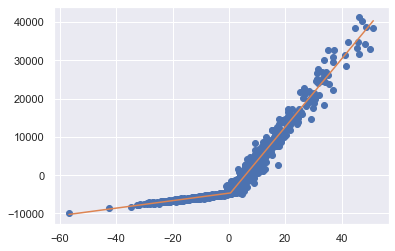

 76% (229 of 300) |################      | Elapsed Time: 3:59:45 ETA:   1:14:25

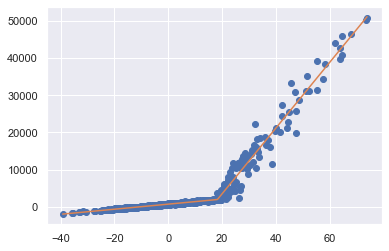

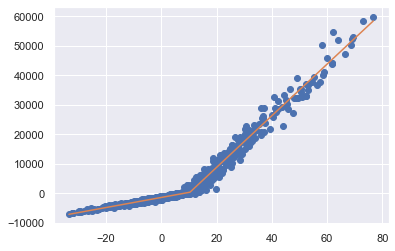

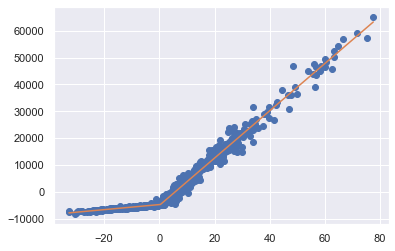

 76% (230 of 300) |################      | Elapsed Time: 4:00:51 ETA:   1:16:19

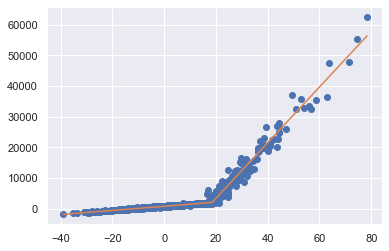

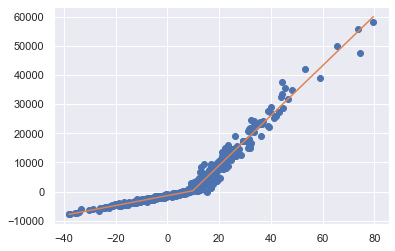

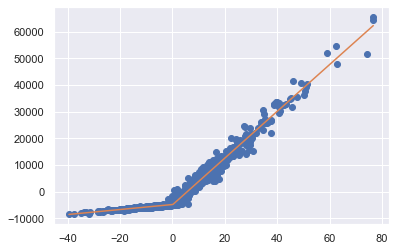

 77% (231 of 300) |################      | Elapsed Time: 4:01:50 ETA:   1:07:53

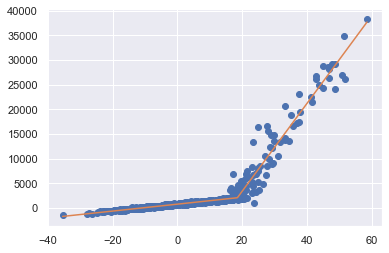

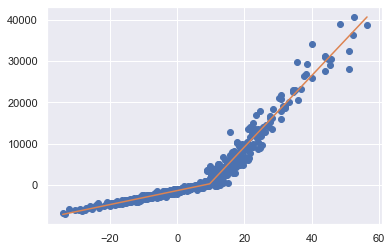

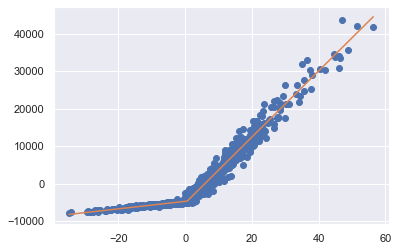

 77% (232 of 300) |#################     | Elapsed Time: 4:02:53 ETA:   1:12:15

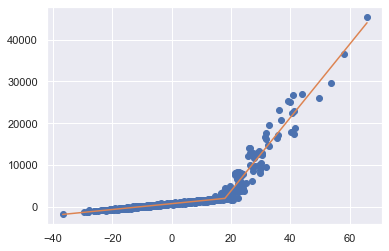

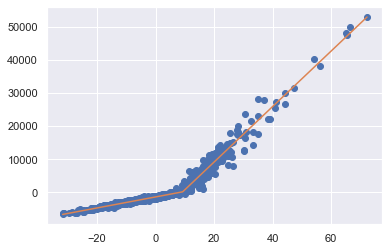

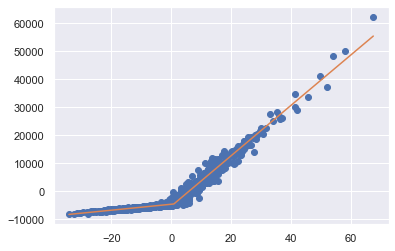

 77% (233 of 300) |#################     | Elapsed Time: 4:03:57 ETA:   1:10:47

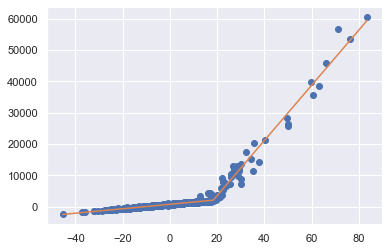

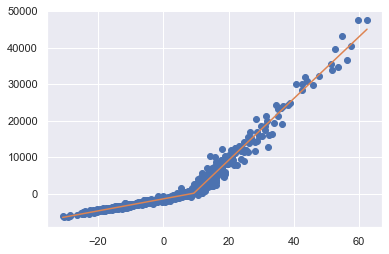

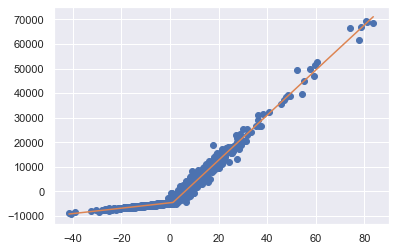

 78% (234 of 300) |#################     | Elapsed Time: 4:04:59 ETA:   1:08:58

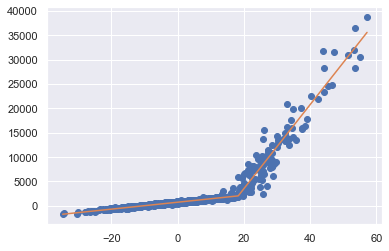

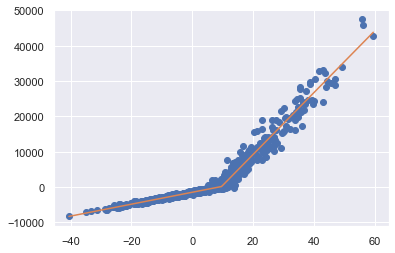

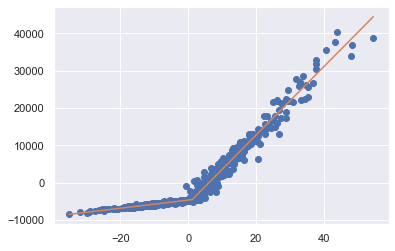

 78% (235 of 300) |#################     | Elapsed Time: 4:06:03 ETA:   1:08:42

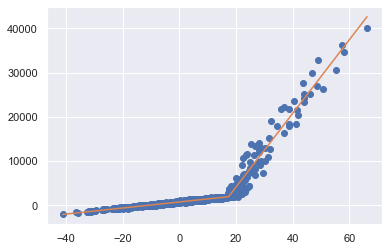

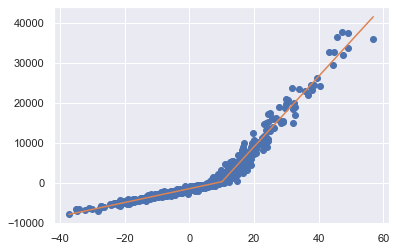

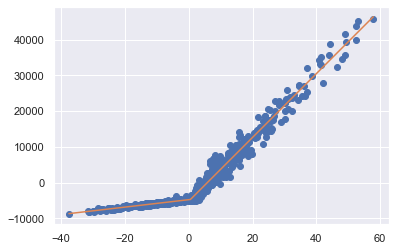

 78% (236 of 300) |#################     | Elapsed Time: 4:07:04 ETA:   1:05:13

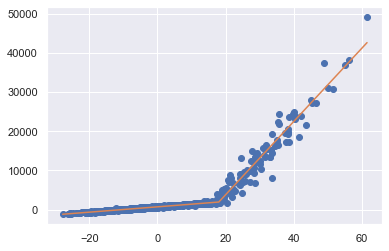

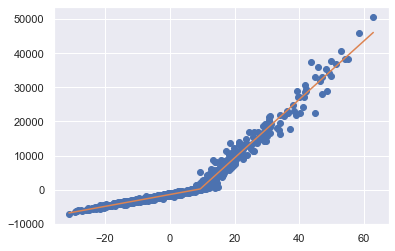

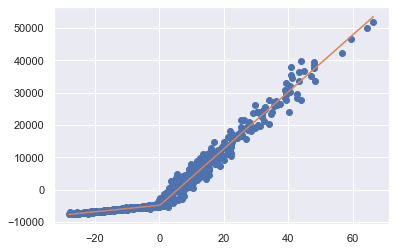

 79% (237 of 300) |#################     | Elapsed Time: 4:08:07 ETA:   1:05:51

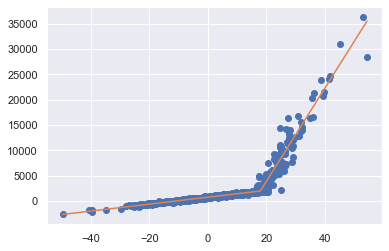

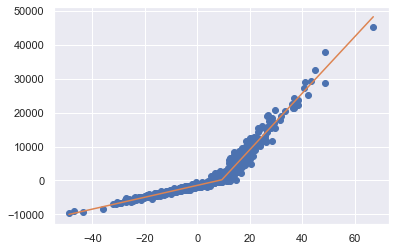

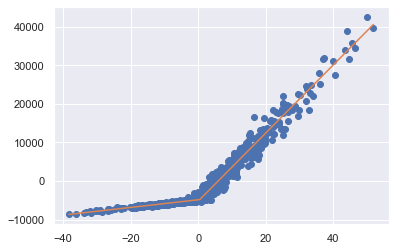

 79% (238 of 300) |#################     | Elapsed Time: 4:09:10 ETA:   1:05:38

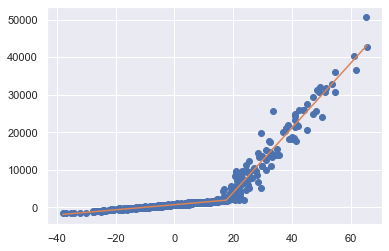

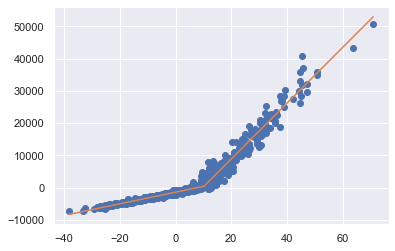

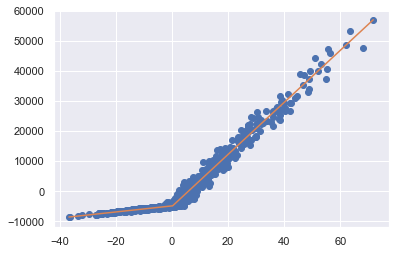

 79% (239 of 300) |#################     | Elapsed Time: 4:10:14 ETA:   1:04:23

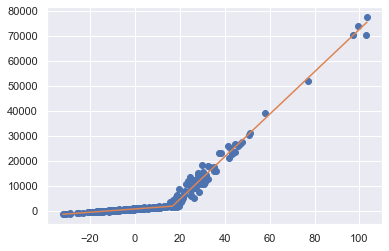

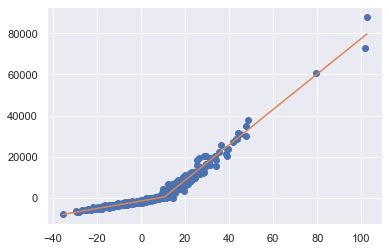

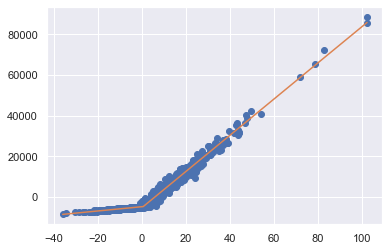

 80% (240 of 300) |#################     | Elapsed Time: 4:11:17 ETA:   1:03:39

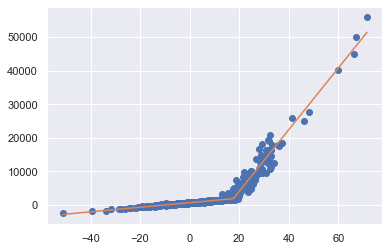

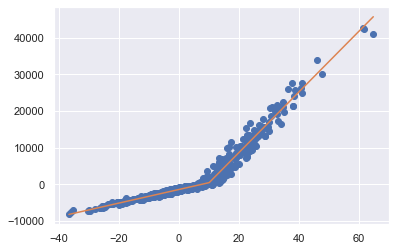

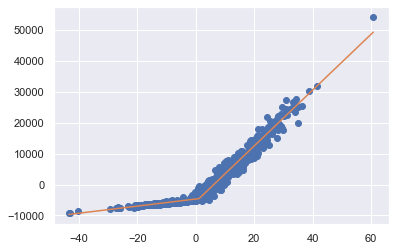

 80% (241 of 300) |#################     | Elapsed Time: 4:12:20 ETA:   1:01:30

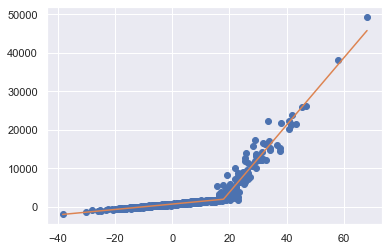

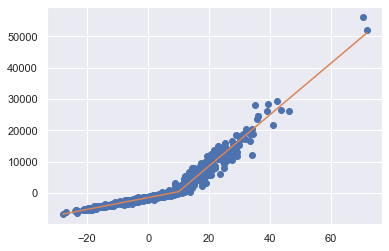

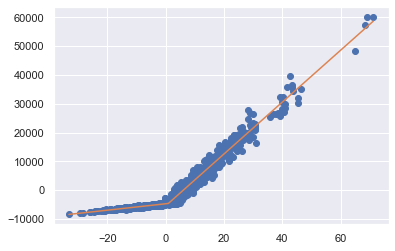

 80% (242 of 300) |#################     | Elapsed Time: 4:13:23 ETA:   1:01:12

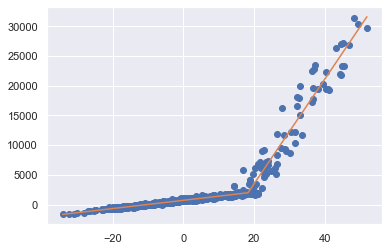

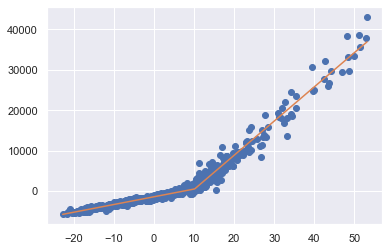

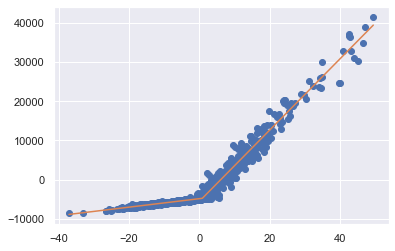

 81% (243 of 300) |#################     | Elapsed Time: 4:14:24 ETA:   0:58:13

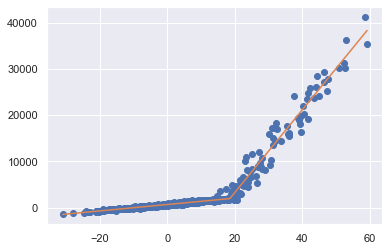

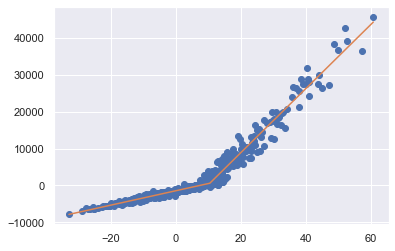

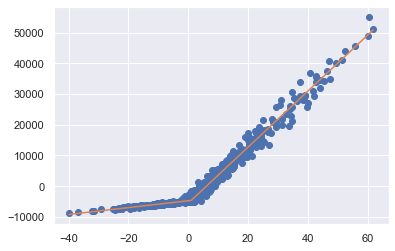

 81% (244 of 300) |#################     | Elapsed Time: 4:15:27 ETA:   0:58:30

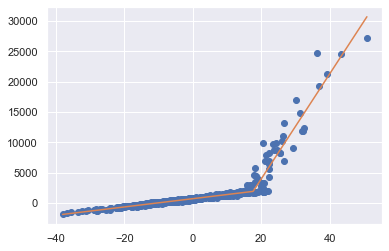

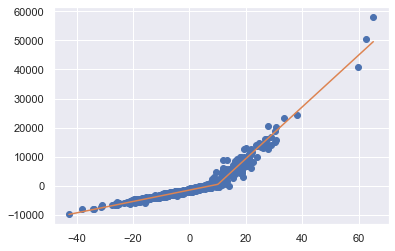

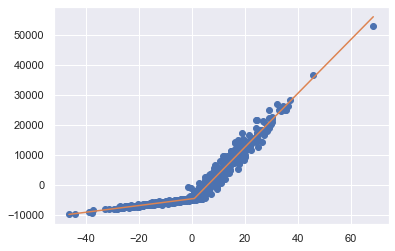

 81% (245 of 300) |#################     | Elapsed Time: 4:16:30 ETA:   0:57:18

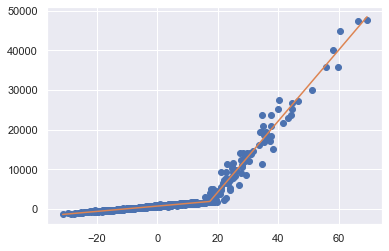

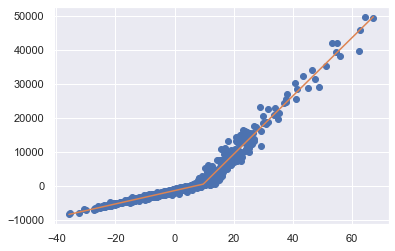

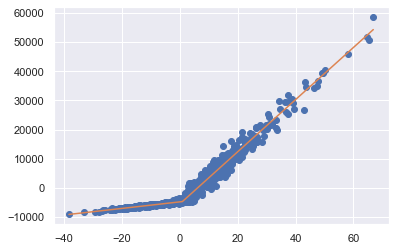

 82% (246 of 300) |##################    | Elapsed Time: 4:17:35 ETA:   0:58:29

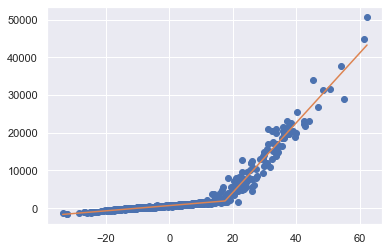

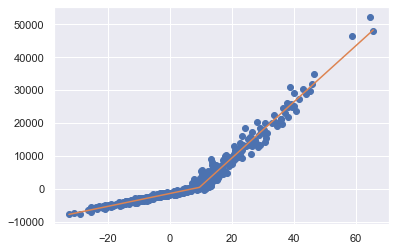

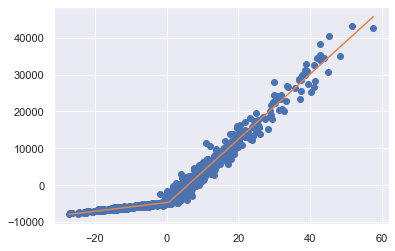

 82% (247 of 300) |##################    | Elapsed Time: 4:18:36 ETA:   0:54:26

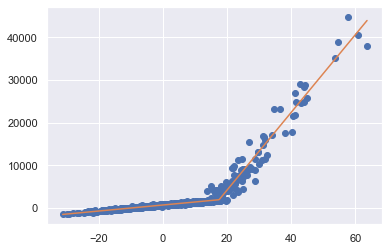

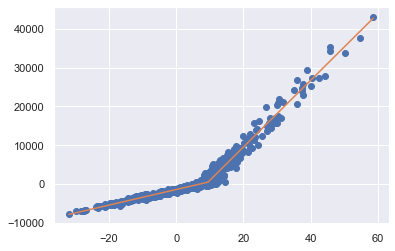

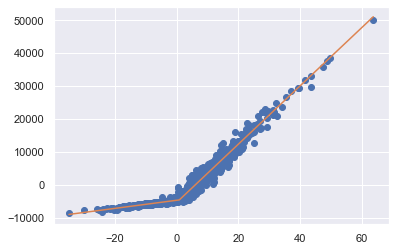

 82% (248 of 300) |##################    | Elapsed Time: 4:19:36 ETA:   0:51:51

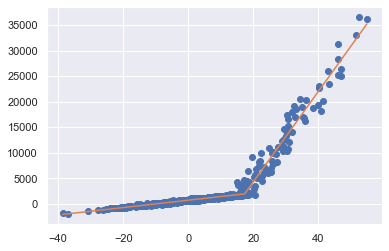

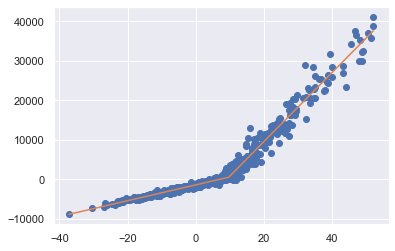

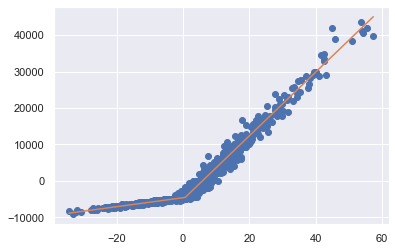

 83% (249 of 300) |##################    | Elapsed Time: 4:20:40 ETA:   0:54:08

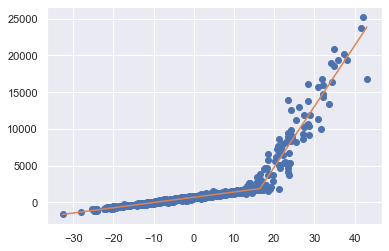

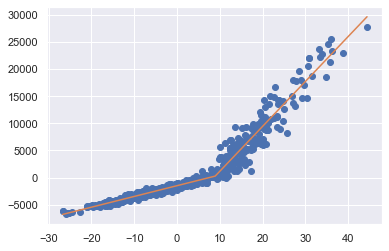

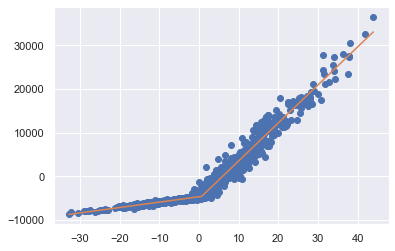

 83% (250 of 300) |##################    | Elapsed Time: 4:21:41 ETA:   0:50:50

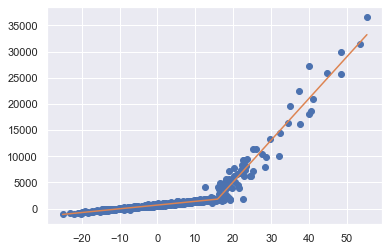

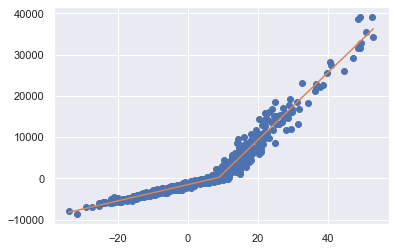

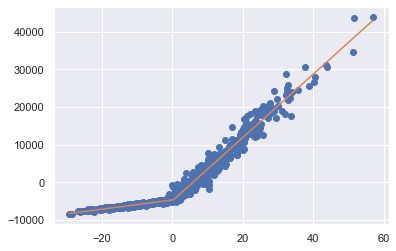

 83% (251 of 300) |##################    | Elapsed Time: 4:22:46 ETA:   0:53:17

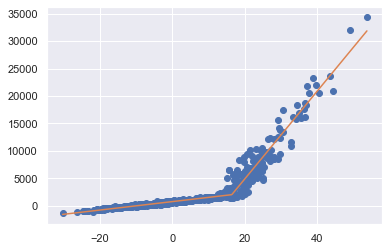

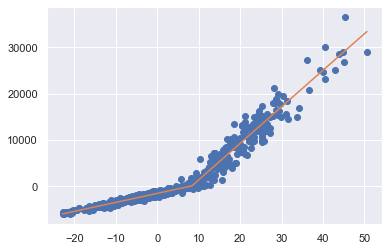

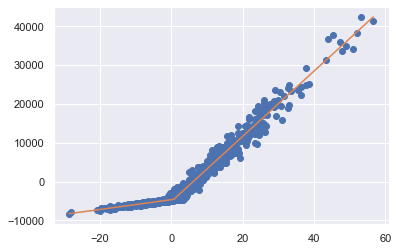

 84% (252 of 300) |##################    | Elapsed Time: 4:23:48 ETA:   0:49:43

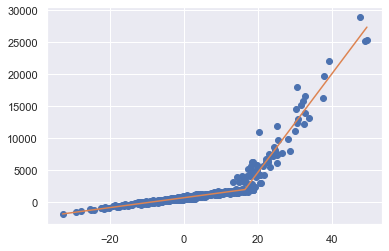

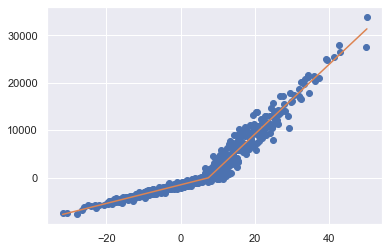

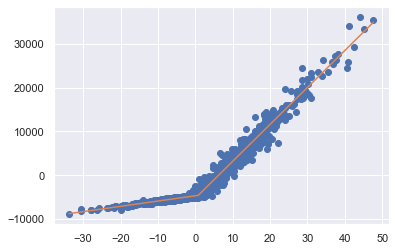

 84% (253 of 300) |##################    | Elapsed Time: 4:24:52 ETA:   0:50:05

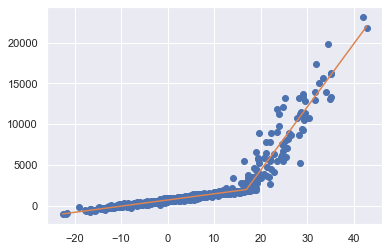

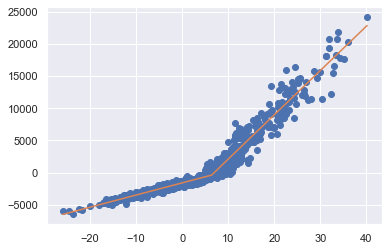

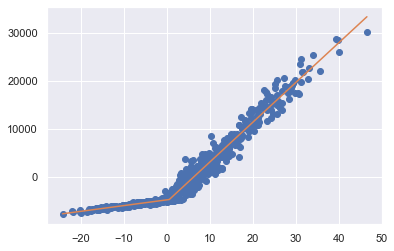

 84% (254 of 300) |##################    | Elapsed Time: 4:25:54 ETA:   0:47:17

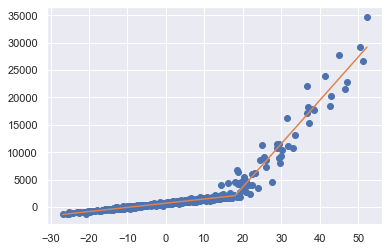

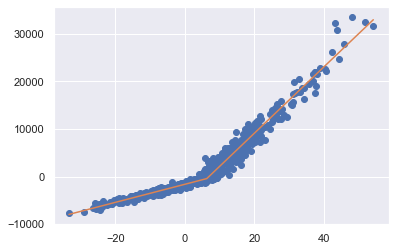

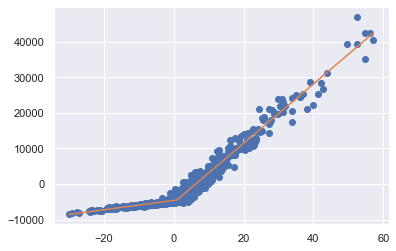

 85% (255 of 300) |##################    | Elapsed Time: 4:27:01 ETA:   0:49:57

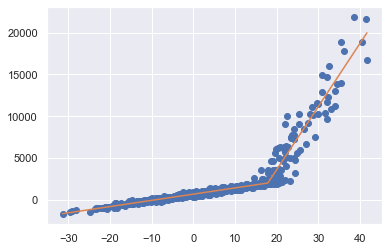

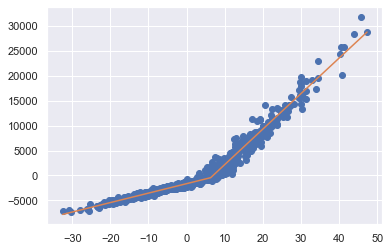

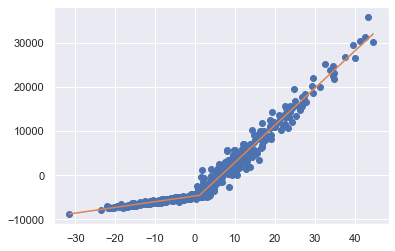

 85% (256 of 300) |##################    | Elapsed Time: 4:28:03 ETA:   0:46:02

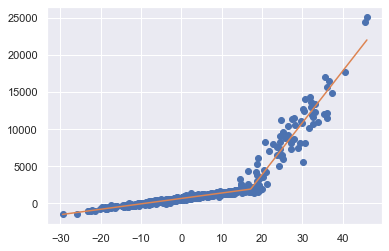

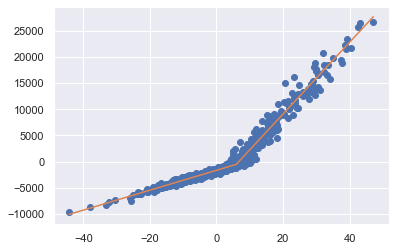

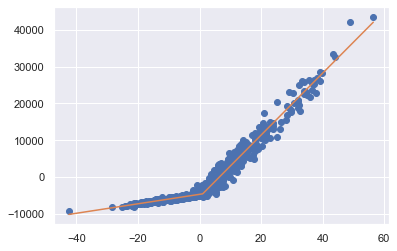

 85% (257 of 300) |##################    | Elapsed Time: 4:29:05 ETA:   0:44:33

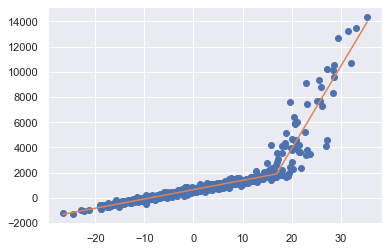

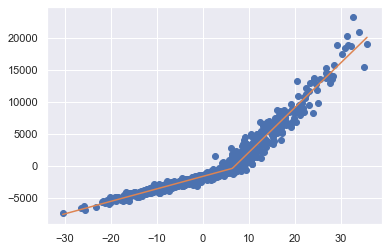

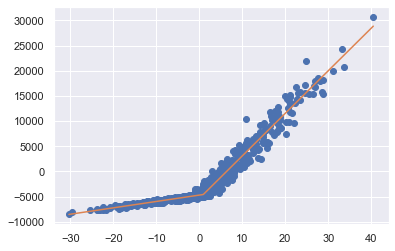

 86% (258 of 300) |##################    | Elapsed Time: 4:30:11 ETA:   0:46:08

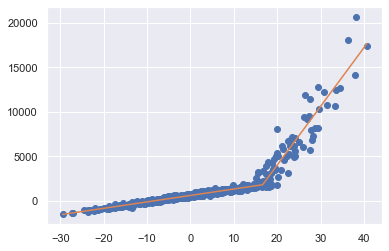

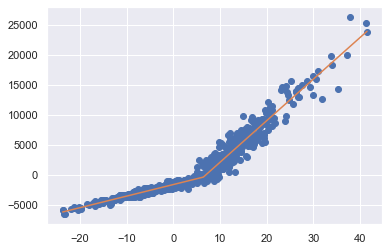

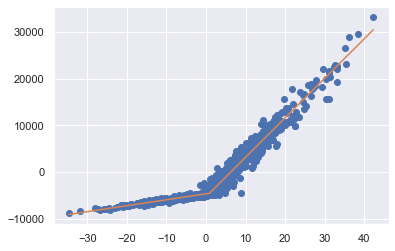

 86% (259 of 300) |##################    | Elapsed Time: 4:31:14 ETA:   0:42:39

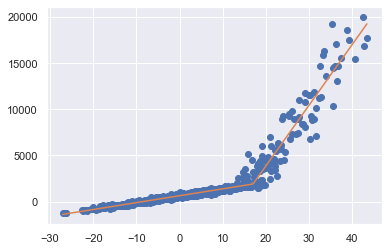

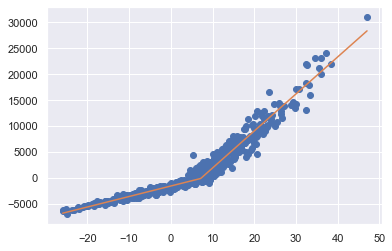

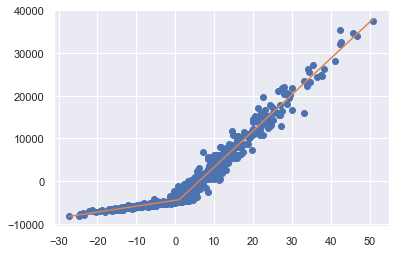

 86% (260 of 300) |###################   | Elapsed Time: 4:32:15 ETA:   0:40:44

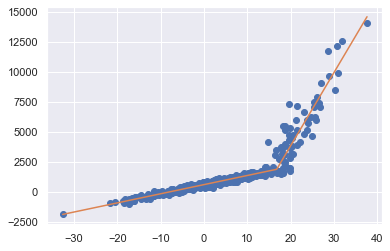

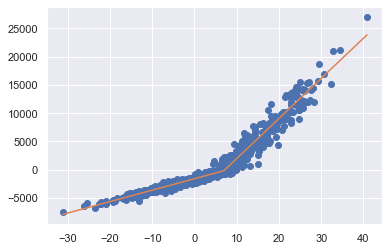

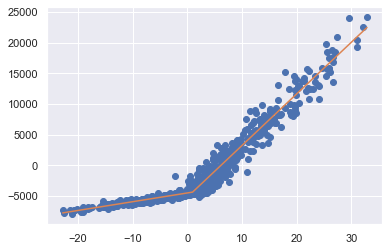

 87% (261 of 300) |###################   | Elapsed Time: 4:33:21 ETA:   0:42:59

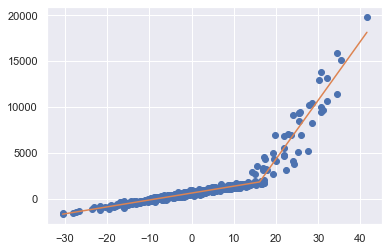

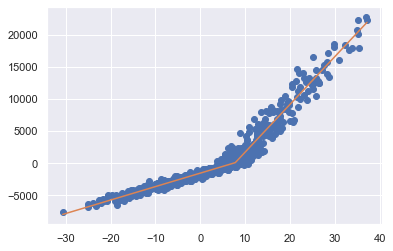

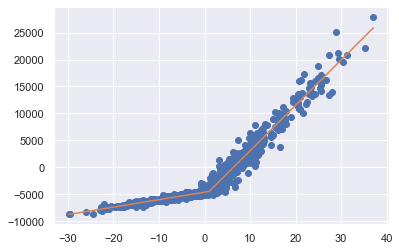

 87% (262 of 300) |###################   | Elapsed Time: 4:34:27 ETA:   0:41:26

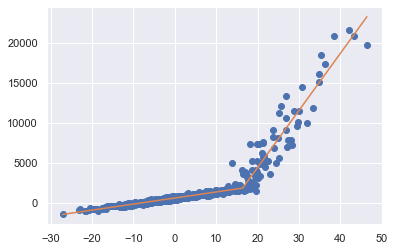

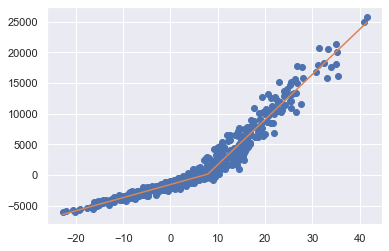

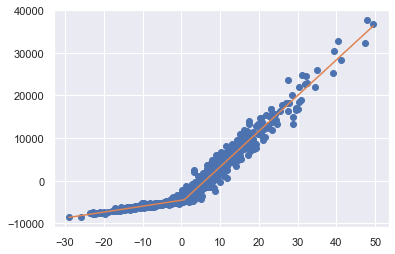

 87% (263 of 300) |###################   | Elapsed Time: 4:35:29 ETA:   0:38:44

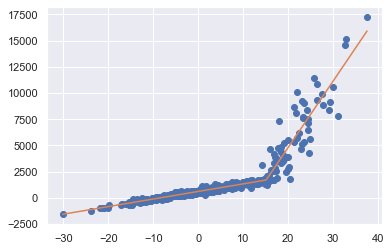

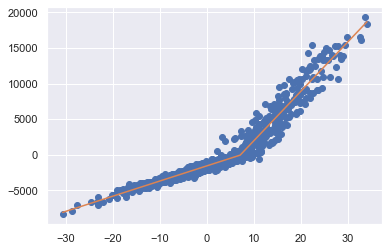

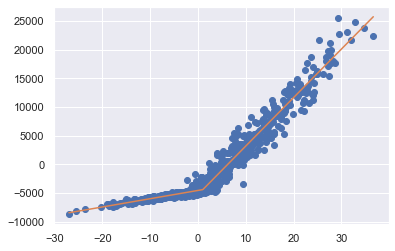

 88% (264 of 300) |###################   | Elapsed Time: 4:36:34 ETA:   0:38:59

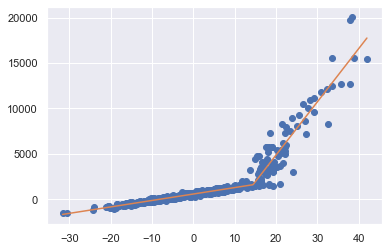

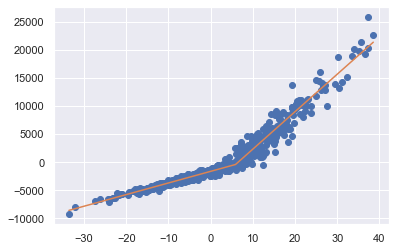

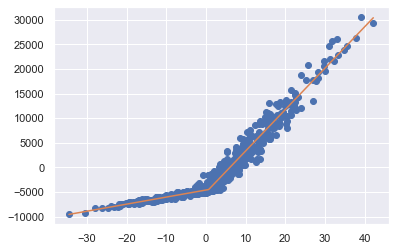

 88% (265 of 300) |###################   | Elapsed Time: 4:37:36 ETA:   0:36:10

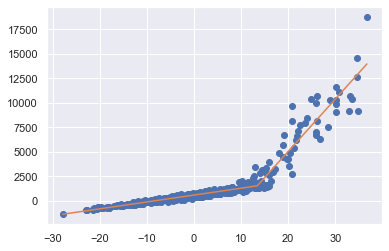

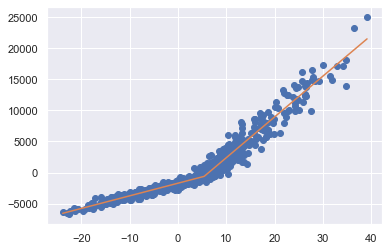

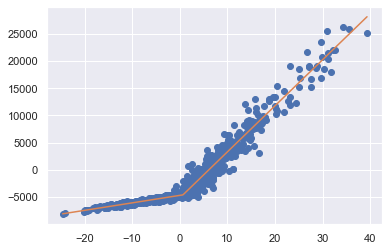

 88% (266 of 300) |###################   | Elapsed Time: 4:38:41 ETA:   0:36:43

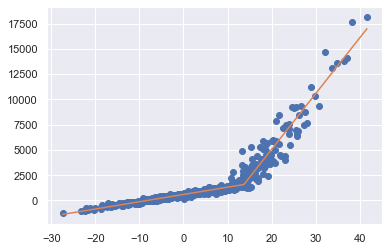

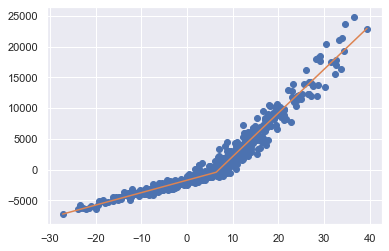

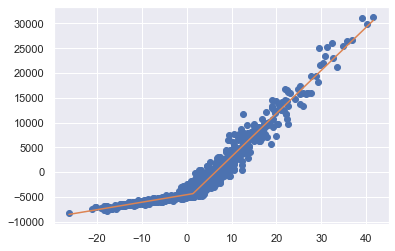

 89% (267 of 300) |###################   | Elapsed Time: 4:39:44 ETA:   0:34:19

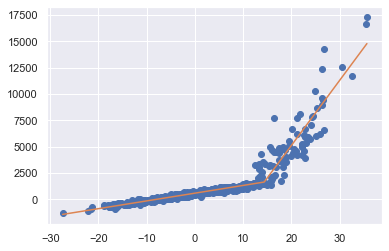

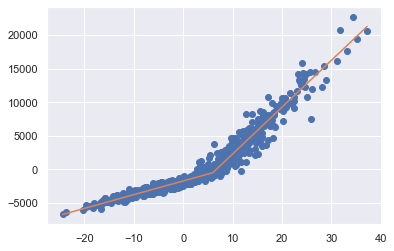

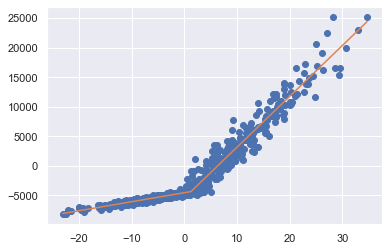

 89% (268 of 300) |###################   | Elapsed Time: 4:40:48 ETA:   0:34:14

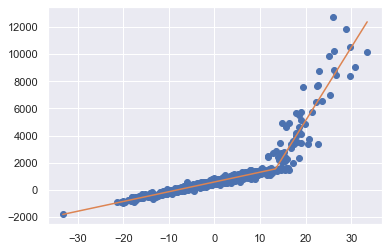

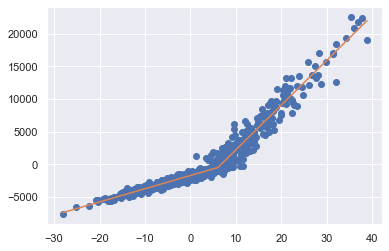

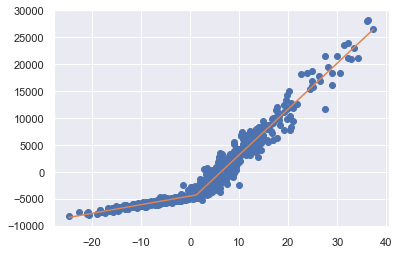

 89% (269 of 300) |###################   | Elapsed Time: 4:41:52 ETA:   0:33:00

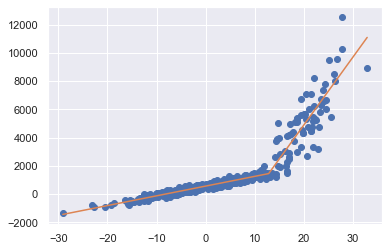

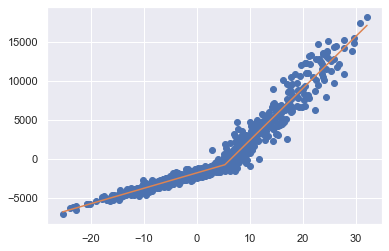

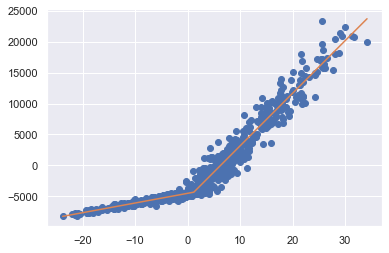

 90% (270 of 300) |###################   | Elapsed Time: 4:42:57 ETA:   0:32:41

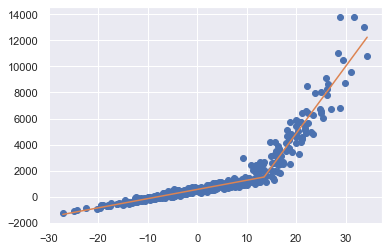

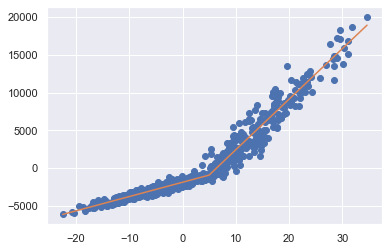

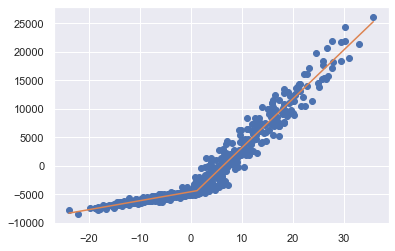

 90% (271 of 300) |###################   | Elapsed Time: 4:44:00 ETA:   0:30:26

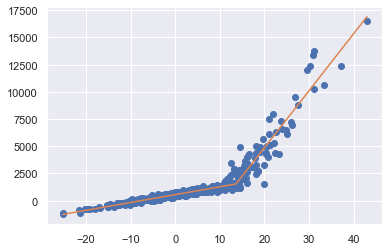

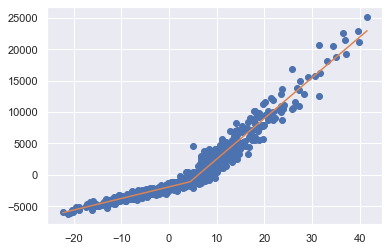

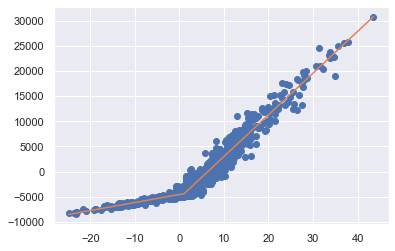

 90% (272 of 300) |###################   | Elapsed Time: 4:45:05 ETA:   0:30:12

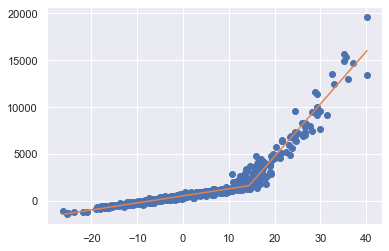

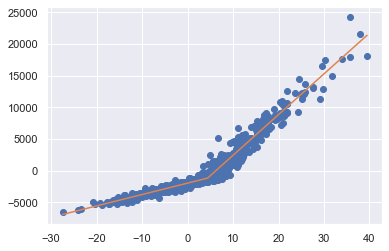

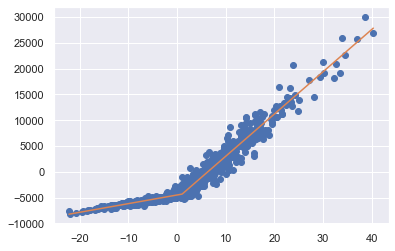

 91% (273 of 300) |####################  | Elapsed Time: 4:46:05 ETA:   0:27:19

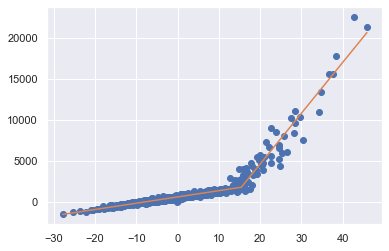

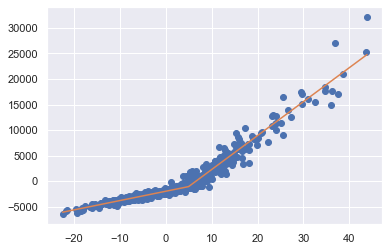

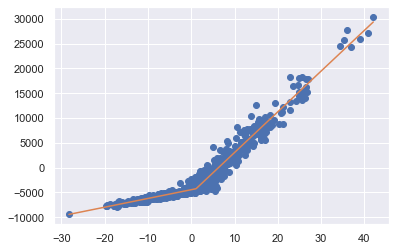

 91% (274 of 300) |####################  | Elapsed Time: 4:47:06 ETA:   0:26:08

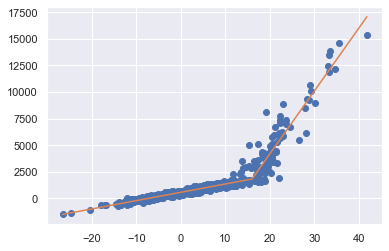

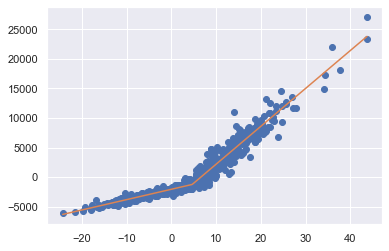

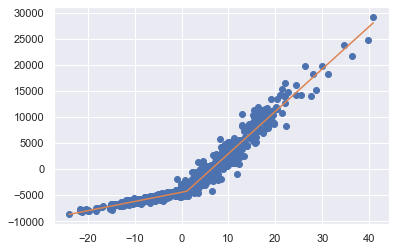

 91% (275 of 300) |####################  | Elapsed Time: 4:48:06 ETA:   0:25:15

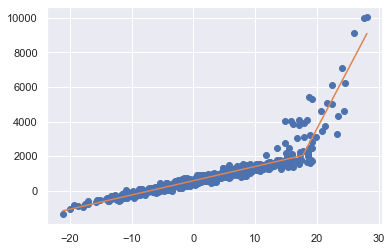

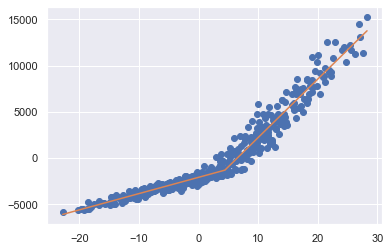

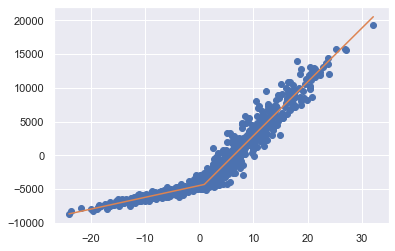

 92% (276 of 300) |####################  | Elapsed Time: 4:49:07 ETA:   0:24:24

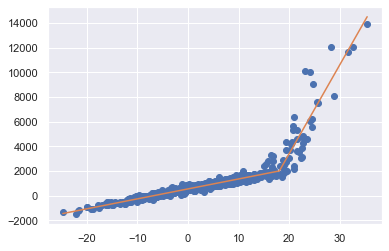

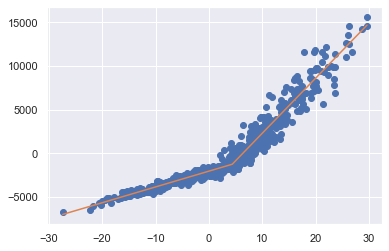

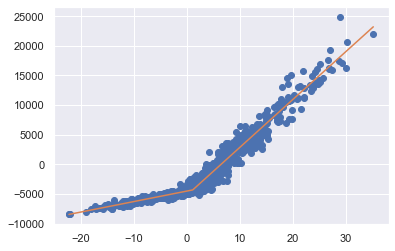

 92% (277 of 300) |####################  | Elapsed Time: 4:50:09 ETA:   0:23:33

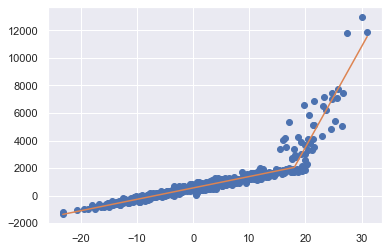

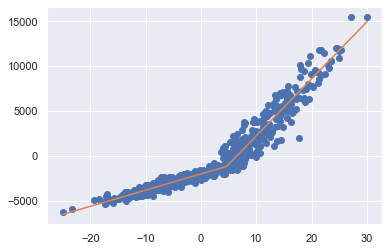

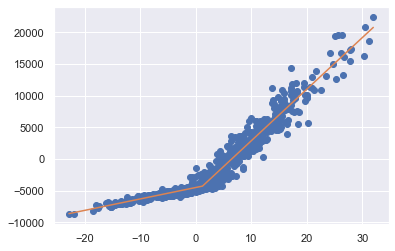

 92% (278 of 300) |####################  | Elapsed Time: 4:51:10 ETA:   0:22:28

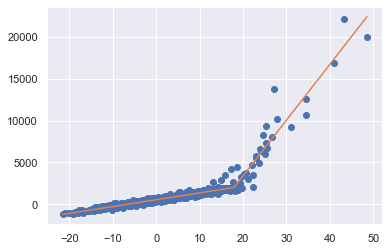

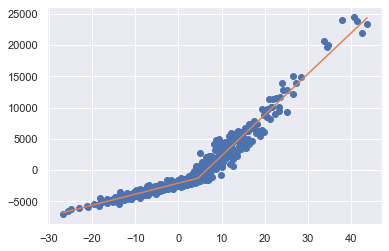

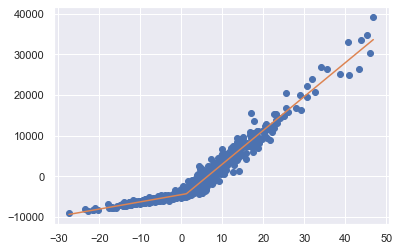

 93% (279 of 300) |####################  | Elapsed Time: 4:52:13 ETA:   0:21:51

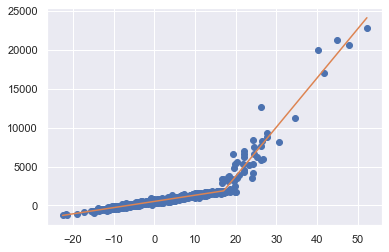

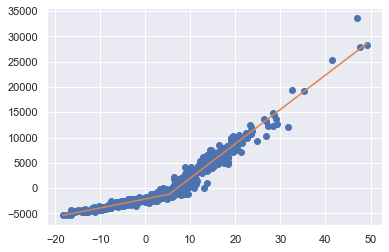

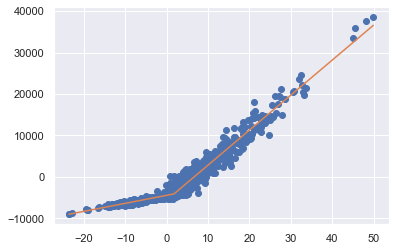

 93% (280 of 300) |####################  | Elapsed Time: 4:53:15 ETA:   0:20:46

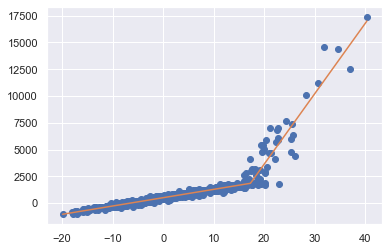

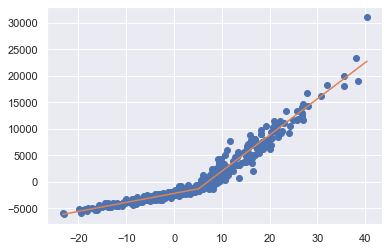

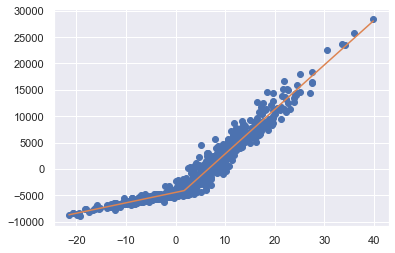

 93% (281 of 300) |####################  | Elapsed Time: 4:54:15 ETA:   0:19:10

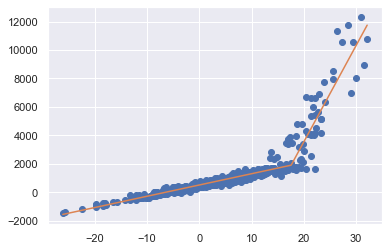

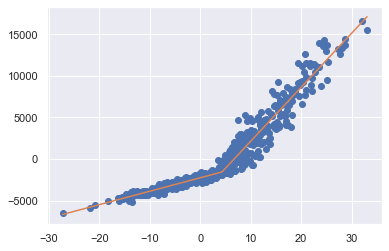

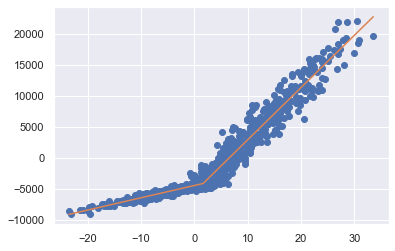

 94% (282 of 300) |####################  | Elapsed Time: 4:55:18 ETA:   0:18:47

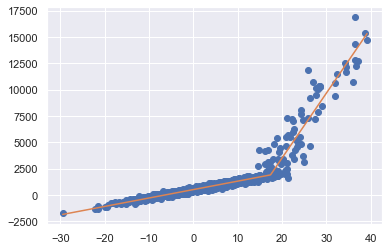

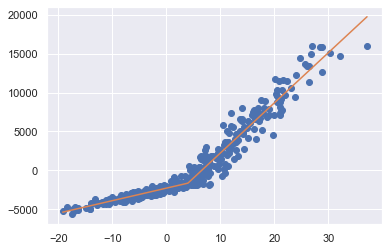

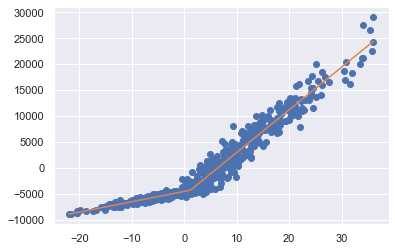

 94% (283 of 300) |####################  | Elapsed Time: 4:56:14 ETA:   0:15:51

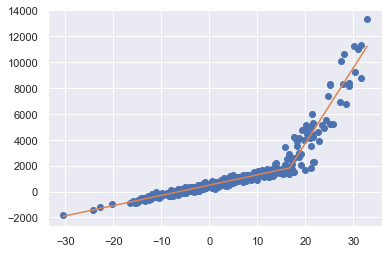

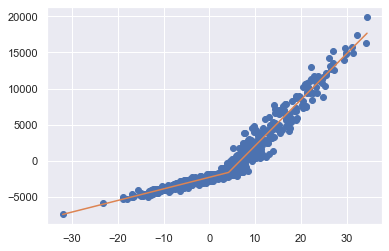

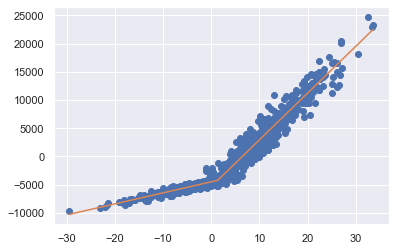

 94% (284 of 300) |####################  | Elapsed Time: 4:57:17 ETA:   0:16:43

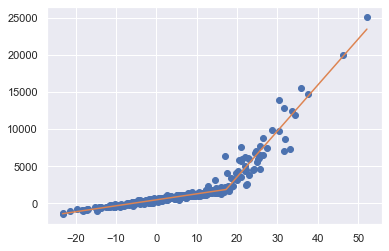

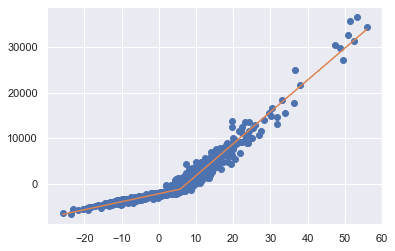

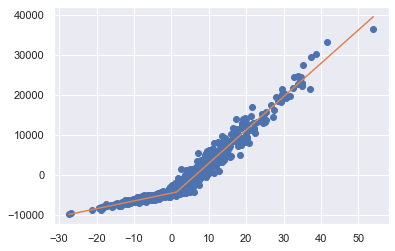

 95% (285 of 300) |####################  | Elapsed Time: 4:58:22 ETA:   0:16:12

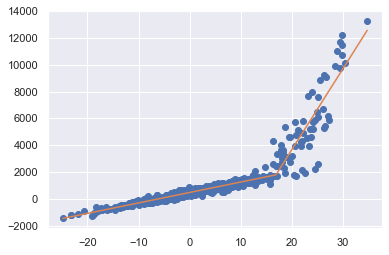

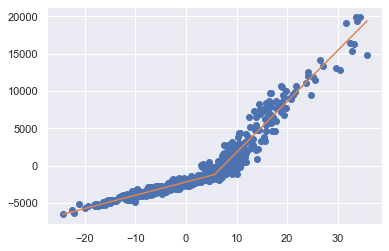

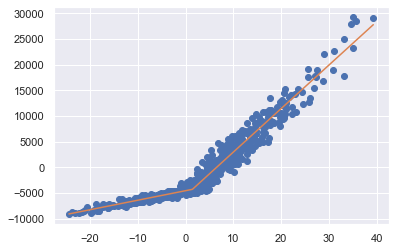

 95% (286 of 300) |####################  | Elapsed Time: 4:59:24 ETA:   0:14:28

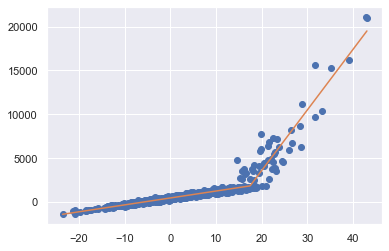

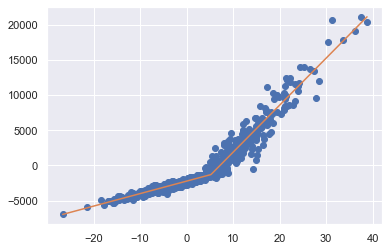

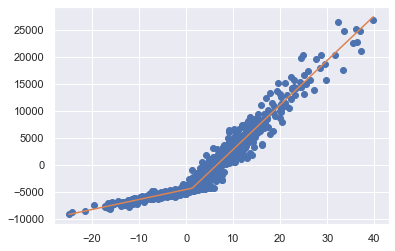

 95% (287 of 300) |##################### | Elapsed Time: 5:00:25 ETA:   0:13:17

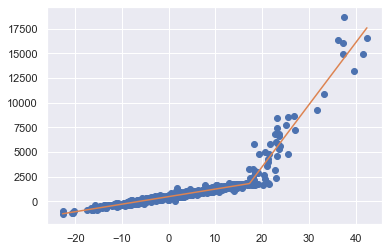

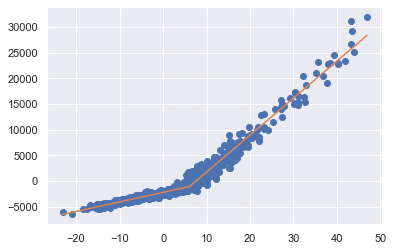

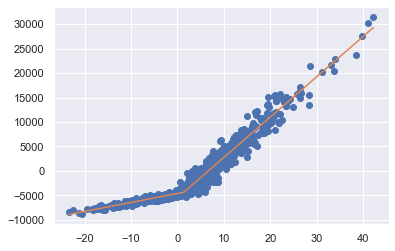

 96% (288 of 300) |##################### | Elapsed Time: 5:01:29 ETA:   0:12:43

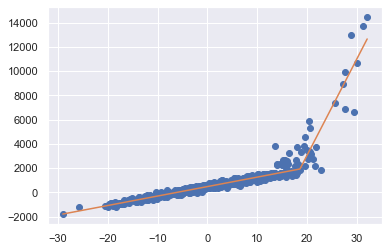

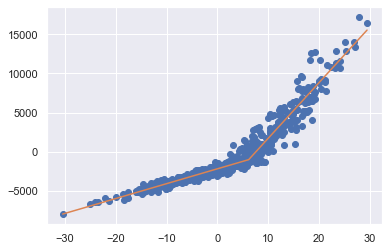

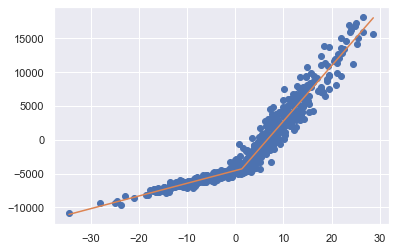

 96% (289 of 300) |##################### | Elapsed Time: 5:02:31 ETA:   0:11:31

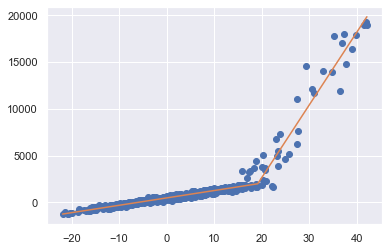

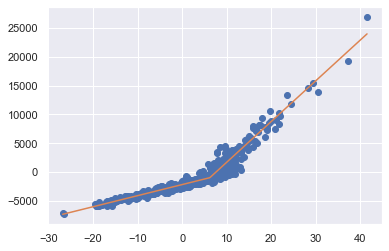

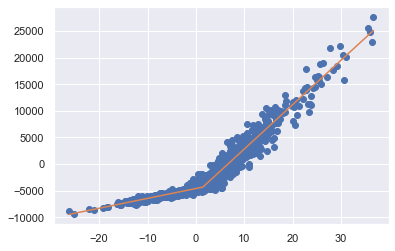

 96% (290 of 300) |##################### | Elapsed Time: 5:03:30 ETA:   0:09:48

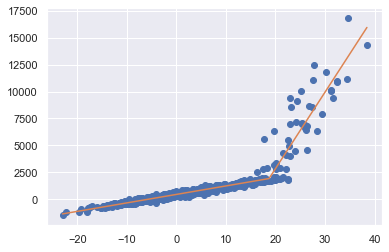

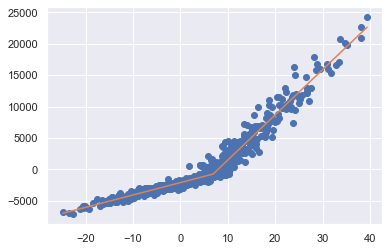

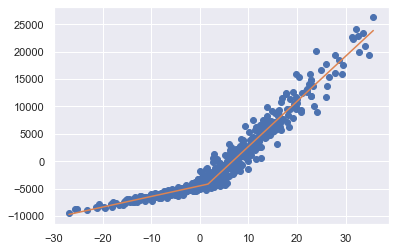

 97% (291 of 300) |##################### | Elapsed Time: 5:04:34 ETA:   0:09:34

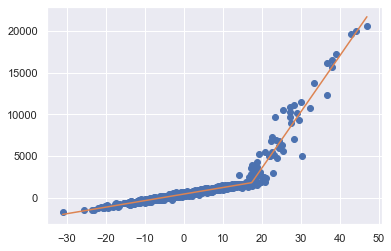

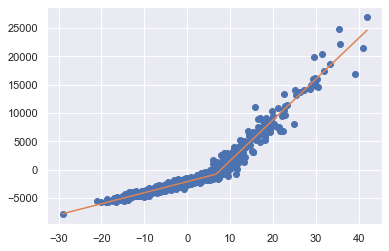

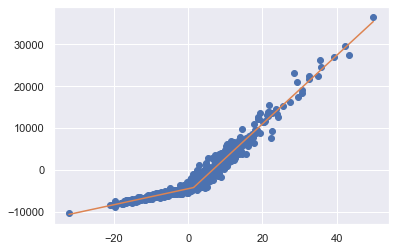

 97% (292 of 300) |##################### | Elapsed Time: 5:05:35 ETA:   0:08:06

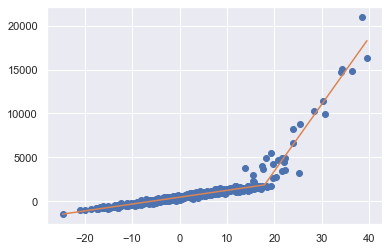

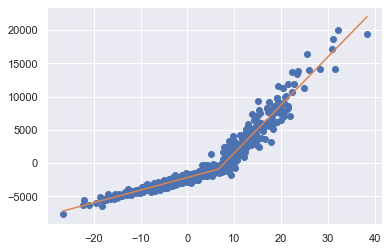

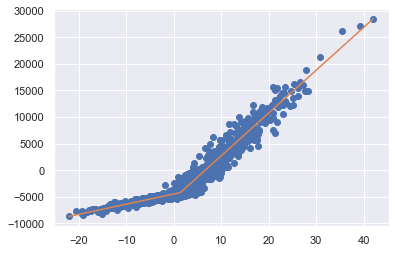

 97% (293 of 300) |##################### | Elapsed Time: 5:06:36 ETA:   0:07:08

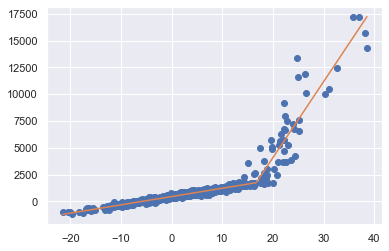

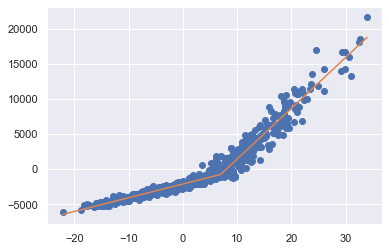

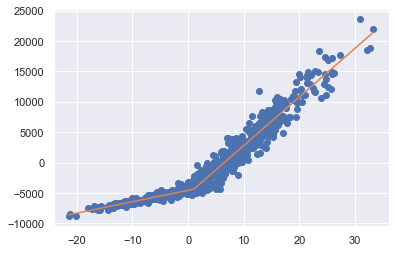

 98% (294 of 300) |##################### | Elapsed Time: 5:07:39 ETA:   0:06:18

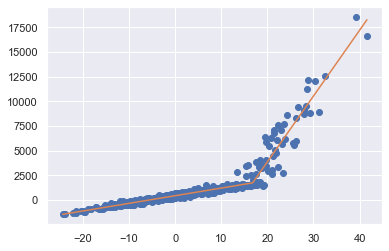

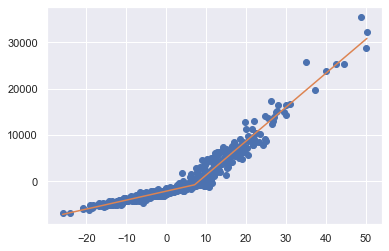

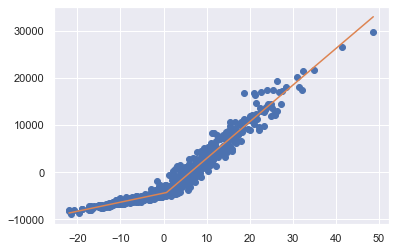

 98% (295 of 300) |##################### | Elapsed Time: 5:08:42 ETA:   0:05:12

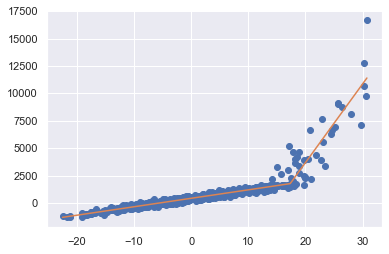

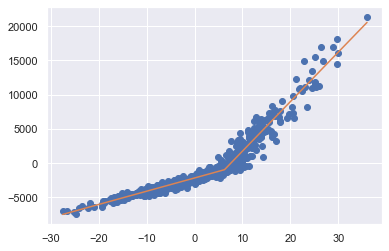

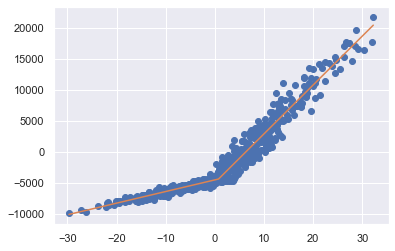

 98% (296 of 300) |##################### | Elapsed Time: 5:09:42 ETA:   0:04:01

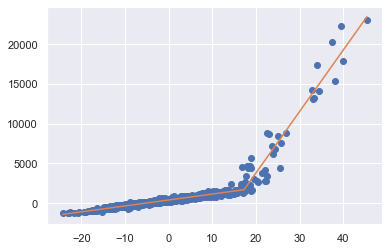

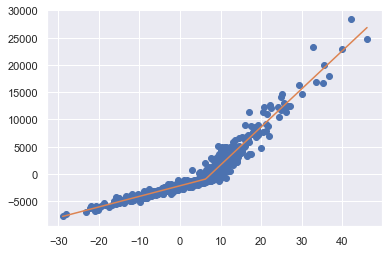

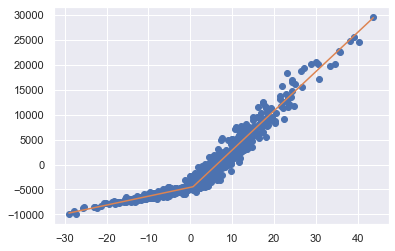

 99% (297 of 300) |##################### | Elapsed Time: 5:10:43 ETA:   0:03:03

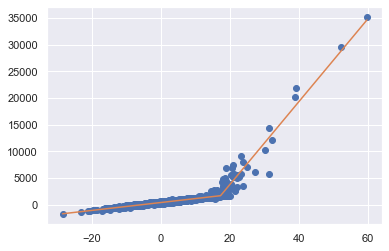

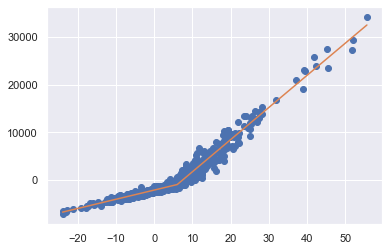

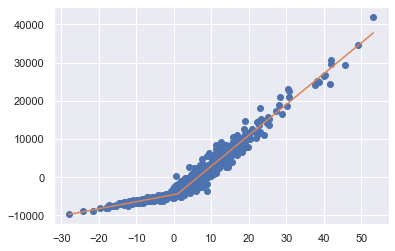

 99% (298 of 300) |##################### | Elapsed Time: 5:11:45 ETA:   0:02:03

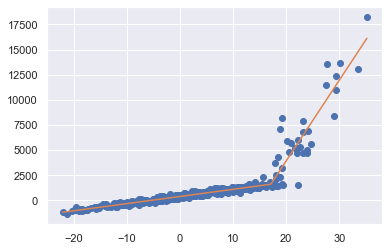

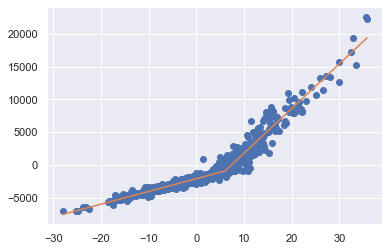

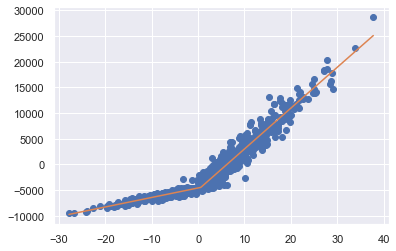

 99% (299 of 300) |##################### | Elapsed Time: 5:12:48 ETA:   0:01:03

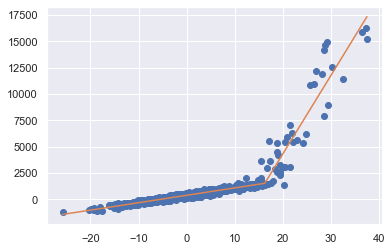

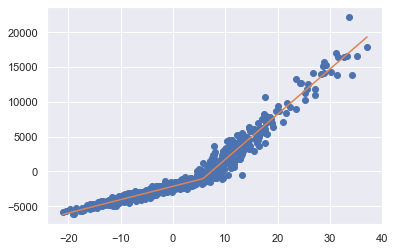

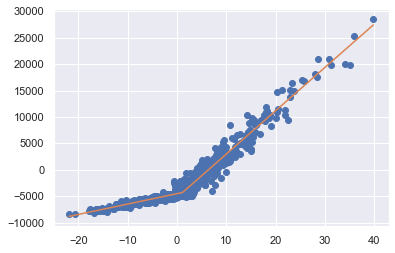

100% (300 of 300) |######################| Elapsed Time: 5:13:52 Time:  5:13:52


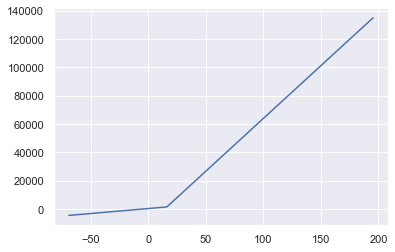

In [13]:
vfs = adp_algorithm_complete()
p = vfs[0].pw_params[0]
plt.plot(xd, piecewise_linear(xd, *p))

In [14]:
vfs[0].pw_params

vfs_params = {}
for i in range(len(vfs)):
    vfs_params[i] = vfs[i].pw_params

In [15]:
df_vfs = pd.DataFrame(vfs_params)

In [16]:
df_vfs.to_pickle('saved_vfs/vfs_12_21_2020.pkl')


In [17]:
s= State(10,25,44, PowerplantState.NOT_BUILT, 110000000)
future_vf = Vf()
future_vf.set_params([[0,0,0,100],[0,0,0,0],[0,0,0,0]])

# Conslusion
- All seems reasonable, no powerplant has more value, because it is vulnerable for price drops. 
- The code is now somehow reasonable and ready to be used in the next notebook in simulation.

- Testing: 
   1. Look what actions are being performed in what states and if they make sense. 
   2. Look what is the result, how does it compare to baseline models and to the pce equivalent stated by the Vf. 
   3. Maybe play more with the constants... 

# Conclusion and model adjustments 
- Each night, I will run the model, with visualisation and see, how good the model is. 
- I will make notes and adjust the model so it is able to catch the pattern better. 

Individual sample size - 200, global sample size -2000, Integral sample size 100. 


# 19.12. First run with large sample size 
- It went good in the first 290 rounds, the option pattern is always there. 

- Problems: 
    1. Negative expected price for the first plant state, should be strictly higher than 0, because I can always do. In other model cases, the project can heave negative value, but not here, where we have the option to do nothing. 
    2. There is s degeneration of the model as we approach time epoch 0. This is caused by low support of the modelled spark prices. We model their variance to be linearly time dependent, but we should put a limit on it. 
         - I have decided this is not that important... It is an approximation, it can slightly not make sense. 
- Powerplant cost is very low, 65M now, could be set to 650, or the volatility of prices could be set lower. 